# Notebook 34: All HR tracks for fixed metallicity

In [1]:
# nb_id is used to identify this notebook's output files (i.e., figures) if there are any
# it should match 
# the first two digits in the notebook's title
nb_id = 34

## Imports

In [2]:
from pathlib import Path
from math import isnan, nan

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize, TwoSlopeNorm, to_rgba
from matplotlib.lines import Line2D

import astropy.units as u
import astropy.constants as ct
from scipy.signal import find_peaks
from scipy.interpolate import interp1d

import mesa_reader as mr
import mesaPlot as mp
#import tulips as tp

import sys
sys.path.append('..')
from src.star import fix_unit, eggleton_rl1_radius, a_from_p, p_from_a, marchant_l2_radius
from src.util import CODE_ROOT, DATA_ROOT, MESA_DATA_ROOT

plt.style.use('./plotstyle.mplstyle')

/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:549: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  return self._float_to_str(self.smallest_subnormal)
/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:549: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <

In [3]:

FIGURE_FOLDER = Path(f'./output/nb{nb_id}/figures')
FIGURE_FOLDER.mkdir(parents=True, exist_ok=True)

In [4]:
plt.style.use('./plotstyle.mplstyle')

## Definitions

### Constants

In [5]:
Z_SUN = 0.017

### Utilities

In [6]:
stage_index = dict(zams=6, prezams=7)

In [7]:
def savefig(fig, fname):
    """Saves png, pdf and eps figure files to a nb-specific folder."""
    fname = f'nb{nb_id}_{fname}'
    plt.savefig(FIGURE_FOLDER/(fname+'.png'), bbox_inches='tight')
    plt.savefig(FIGURE_FOLDER/(fname+'.pdf'), bbox_inches='tight')
    plt.savefig(FIGURE_FOLDER/(fname+'.eps'), bbox_inches='tight')

In [8]:
def normarr(arr):
    return (arr-min(arr))/(max(arr)-min(arr))

In [9]:
def get_model_folder(model_id, verbose=True):
    """Finds model folder given its id."""
    matches = list(PROJECT_FOLDER.glob(f'{model_id}*'))
    
    if len(matches) > 1:
        if verbose:
            print('\n'.join((
                f'Multiple matches for id {model_id} found in {PROJECT_FOLDER}:',
                *[str(match) for match in matches]
            )))
        return
    elif len(matches) != 0:
        match = matches[0]
        if verbose:
            print(f'Found match {match}')
        return match
    else:
        if verbose:
            print(f'No matches found in {PROJECT_FOLDER}')
        return           

In [10]:
def get_model_dict(grid_folder):
    """Given a model folder, loads the paths of specific stars into a 
    m1, p_orb dictionary."""
    d = dict()
    for model_folder in grid_folder.glob('m*_w*'):
        if model_folder.suffix == '.log':
            continue
        try:
            m, p, w = model_folder.name.replace('d', 'e').split('_')
            w = float(w.lstrip('w'))
            p = f'{float(p.lstrip("p")):.2f}'      
        except ValueError:
            m, w = model_folder.name.replace('d', 'e').split('_')   
            w = float(w.lstrip('w'))
            p = (2*np.pi/w) / (60*60*24)
        m = f'{float(m.lstrip("m")):.1f}'
        
        if m not in d.keys():
            d[m] = dict()
        d[m][p] = model_folder
    return d

In [11]:
def mesareader_operator(expression, object_to_call='h'):
    """Converts strings into operations between mesareader columns.
    
    Supports summation, subtraction, multiplication, division and exp10."""
    operations = ['+', '-', '*', '/', '^', 'E', '(', ')', ',']
    
    mr_expression = ''
    attr = ''
    char_i = 0
    while char_i < len(expression):
        char = expression[char_i]
        if char not in operations:
            mr_expression += f'{object_to_call}.__getattr__("{char}'
        else:
            if char == '^':
                char = '10**'
            elif char == 'E':
                char = 'gamma_e('
            mr_expression += f'{char}{object_to_call}.__getattr__("'
        char_i += 1
        char = expression[char_i]
        while char not in operations+['']:
            attr += char
            char_i += 1
            try:
                char = expression[char_i]
            except IndexError:
                char = ''
        if char == '^':
            char = '10**'
        elif char == 'E':
                char = 'gamma_e('
        attr = f'{attr}"){char}'
        mr_expression += attr
        attr = ''
        char_i += 1
            
    return mr_expression


### Plotting

In [12]:
def history_plot(ax, model_dict_list, model_styles, x, y, invert_xaxis, invert_yaxis, title=False,
                 label_period=True):
    """2D line plot for all m1, p_orb combinations from a given model.
    
    Assumes a single m1 per dict.
    """
    
    #base_dict = model_dict_list[0]
    #all_paths = [base_dict[k1][k2] for k1 in base_dict.keys() for k2 in base_dict[k1].keys()] 
    
    all_periods = []
    for dict_ in model_dict_list:
        for k1 in dict_.keys():
            for k2 in dict_[k1].keys():
                all_periods.append(k2)
    all_periods = np.unique(all_periods)
    all_periods = all_periods[np.argsort([float(p) for p in all_periods])]
    
    period_color_dict = {}
    for i, p in enumerate(all_periods):
        period_color_dict[p] = cm.jet(i/len(all_periods))
    
    handles = []
    for p_key in all_periods:
        p = float(p_key)
        c = period_color_dict[p_key]
        
        if label_period:
            label = f'${p:.2f}\\,\\mathrm{{d}}$'
        else:
            label = None
        handles.append(Line2D([], [], ls='-', color=c, label=label))
               
        for dict_, ls in zip(model_dict_list, model_styles):
            dict_ = dict_[list(dict_.keys())[0]]
            try:
                model_path = dict_[p_key]
                h = mr.MesaData(str(model_path/'LOGS/history.data'))
            except:
                print(f'Model {model_path} failed to load.')
                continue
            else:
                x_data = eval(mesareader_operator(x))
                y_data = eval(mesareader_operator(y))
                ax.plot(x_data, y_data, ls=ls, color=c, lw=1)
                
    if invert_xaxis:
        ax.invert_xaxis()
    if invert_yaxis:
        ax.invert_yaxis()
    
    if label_period:
        ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(1, 1), ncol=2)
    
    return ax, handles

### Winds

In [13]:
def _sanders_winds(l, t, z):
    logz = np.log10(z/Z_SUN)
    alpha = 0.32 * logz + 1.4
    l0 = 10.**(-0.87*logz + 5.06)
    mdot10 = 10.**(-0.75*logz - 4.06)
    
    if l <= l0:
        log_power_term = 0
    else:
        log_power_term = np.log10(l/l0) ** alpha
              
    w = mdot10 * log_power_term * (l/(10*l0))**0.75
    
    if t > 1.41e5 and l > l0:
        log_w = np.log10(w) - 6*np.log10(t/1.41e5)
        w = 10.**log_w
    return w

def _vink2017_winds(l, z):
    log_mdot = - 13.3 + 1.36*np.log10(l) + 0.61*np.log10(z/Z_SUN)
    return 10.**log_mdot

def _vink2001_winds(l, t, m, z):
    Teff_jump = 1e3*(61.2 + 2.59*(-13.636 + 0.889*np.log10(z/Z_SUN)))
    
    if t > 27.5e3:
        a = 1
    elif t < 22.5e3:
        a = 0
    else:
        dt = 100
        if t > Teff_jump + dt:
            a = 1
        elif t < Teff_jump - dt:
            a = 0
        else:
            a = (t - (Teff_jump - dt)) / (2*dt)
    
    if a > 0:
        vinf_div_vesc = 2.6
        vinf_div_vesc = vinf_div_vesc * (z/Z_SUN)**0.13
        log_mdot = (
            - 6.697
            + 2.194 * np.log10(l/1e5)
            - 1.313 * np.log10(m/3e1)  
            - 1.226 * np.log10(vinf_div_vesc/2e0)              
            + 0.933 * np.log10(t/4e4) 
            - 10.92 * np.log10(t/4e4)**2
            + 0.85 * np.log10(z/Z_SUN)
            )
        mdot1 = 10.**log_mdot
    else:
        mdot1 = 0
        
    if a < 1:
        vinf_div_vesc = 1.3    
        vinf_div_vesc = vinf_div_vesc * (z/Z_SUN)**0.13
        log_mdot = (
            - 6.688 
            + 2.210 * np.log10(l/1e5) 
            - 1.339 * np.log10(m/3e1) 
            - 1.601 * np.log10(vinf_div_vesc/2)
            + 1.07 * np.log10(t/2e4) 
            + 0.85 * np.log10(z/Z_SUN)
            )
        mdot2 = 10.**log_mdot
    else:
        mdot2 = 0
        
    w = a*mdot1 + (1-a)*mdot2  
    return w


In [14]:
vink2001_w = np.vectorize(_vink2001_winds)
vink2017_winds = np.vectorize(_vink2017_winds)
sanders_winds = np.vectorize(_sanders_winds)

In [15]:
def _winds(l, t, m, z, y):
    
    v01 = vink2001_winds(l, t, m, z)
    v17 = vink2017_winds(l, z)
    s23 = sanders_winds(l, t, z)
    
    he_w = max(v17, s23)
    
    if y < 0.4:
        y_weight = 0
    elif y < 0.7:
        y_weight = (y - 0.4)/0.3
    else:
        y_weight = 1
        
    w = y_weight * he_w + (1-y_weight) * v01
    
    return w
    

In [16]:
winds = np.vectorize(_winds)

## HR diagram

In [17]:
def log_l_const_rad(log_teff, r):
    teff = 10.**log_teff * u.K
    r = fix_unit(r, u.Rsun)
    log_l = np.log10(4*np.pi*ct.sigma_sb * teff**4 * r**2 / u.Lsun)
    return log_l
log_l_const_rad = np.vectorize(log_l_const_rad)

In [18]:
def hd_limit(log_teff):
    teff = 10**log_teff * u.K
    log_l = (
        np.log10(1.e5*np.sqrt(4*np.pi))
        + 0.5*np.log10(ct.sigma_sb * u.Rsun**2 * teff**4 / u.Lsun)
    ).value
    log_l = max(log_l, np.log10(6.e5))
    return log_l
hd_limit = np.vectorize(hd_limit)

In [19]:
def hr_diagram_tracks(
    ax,
    models_to_plot,
    model_style_list,
    xlim, 
    ylim,
    legend=True,
    labelx=True, 
    labely=True
    ):
    model_dict_list = [{models_to_plot: model_dicts[models_to_plot]}]
    
    settings = dict(
        x='log_Teff',
        y='log_L',
        invert_xaxis=True,
        invert_yaxis=False,
        model_dict_list=model_dict_list,
        model_styles=model_style_list,
        label_period=legend
        )

    ax, handles = history_plot(ax, **settings)

    if labelx:
        ax.set_xlabel('$\\log T_\\mathrm{eff}/\\mathrm{K}$')
    if labely:
        ax.set_ylabel('$\\log L/\\mathrm{L}_\\odot$')

    # GUIDELINES
    
    if xlim is None:
        xlim = ax.get_xlim()
    if ylim is None:
        ylim = ax.get_ylim()

    ## Humphreys-Davidson limit and LBV regime
    hd_x = np.linspace(*xlim, 100)
    hd_y = hd_limit(hd_x)
    ax.plot(hd_x, hd_y, 'k--', lw=1)
    ax.fill_between(hd_x, hd_y, [ylim[1]]*len(hd_y), color='k', alpha=0.05)

    ## Lines of constant radius
    r_to_plot = np.concatenate((np.arange(0.5, 1, 0.1), np.arange(1, 10, 1), np.arange(10, 40, 10)))
    for i, r in enumerate(r_to_plot):
        r_y = log_l_const_rad(hd_x, r)
        ax.plot(hd_x, r_y, 'k--', lw=0.5, alpha=0.5)
        
        # label every two lines
        if not i%2:
            rotation = -np.arctan((r_y[10]-r_y[0])/(hd_x[10]-hd_x[0]))/np.pi*180       
            r_y_ = r_y[(hd_x >= xlim[1]) & (hd_x <= xlim[0])]
            y = r_y_[np.argmin(np.abs(r_y_-ylim[1]))]     
            x = hd_x[np.argmin(np.abs(r_y-y))]
            if (x < max(xlim) and x > min(xlim)) and (y < max(ylim) and y > min(ylim)):
                ax.text(
                    x, 
                    y,
                    f'${r:.1f}\\,\\mathrm{{R}}_\\odot$',
                    rotation=rotation,
                    ha='left',
                    va='top', 
                    fontsize=6,
                    alpha=0.8
                    )
    
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
        
    return ax, handles

In [20]:
def density_temperature_diagram_tracks(
    ax,
    models_to_plot,
    model_style_list,
    xlim, 
    ylim,
    legend=True,
    labelx=True, 
    labely=True
    ):
    model_dict_list = model_dicts[models_to_plot]
    model_label_list = model_labels[models_to_plot]
    
    settings = dict(
        x='log_center_Rho',
        y='log_center_T',
        invert_xaxis=False,
        invert_yaxis=False,
        model_dict_list=model_dict_list,
        model_styles=model_style_list,
        model_labels=model_label_list,
        label_period=legend
        )

    ax = history_plot(ax, **settings)

    if labelx:
        ax.set_xlabel('$\\log \\rho_\\mathrm{c}/\\mathrm{g}\\,\\mathrm{cm}^{-3}$')
    if labely:
        ax.set_ylabel('$\\log T_\\mathrm{c}/\\mathrm{K}$')

    # GUIDELINES
    
    if xlim is None:
        xlim = ax.get_xlim()
    if ylim is None:
        ylim = ax.get_ylim()

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    return ax

In [21]:
def old_e_scattering_edd_l(m):
    m = fix_unit(m, u.Msun)
    k = 0.4 * u.cm**2 /u.g
    l = 4*np.pi*ct.c*ct.G*m/k
    l = l.to(u.Lsun)
    return l.value

In [22]:
def gamma_e(m, l, x):
    m = fix_unit(m, u.Msun).value
    l = fix_unit(l, u.Lsun).value
    return 10.**-4.813 * (1+x) * l/m

In [23]:
def hre_diagram_tracks(
    ax,
    models_to_plot,
    model_style_list,
    xlim, 
    ylim,
    legend=True,
    labelx=True, 
    labely=True
    ):
    model_dict_list = model_dicts[models_to_plot]
    model_label_list = model_labels[models_to_plot]
    
    settings = dict(
        x='log_Teff',
        #y='^log_L/Estar_mass)',
        y='Estar_mass,^log_L,surface_h1)',
        invert_xaxis=True,
        invert_yaxis=False,
        model_dict_list=model_dict_list,
        model_styles=model_style_list,
        model_labels=model_label_list,
        label_period=legend
        )

    ax, handles = history_plot(ax, **settings)

    if labelx:
        ax.set_xlabel('$\\log T_\\mathrm{eff}/\\mathrm{K}$')
    if labely:
        ax.set_ylabel('$\\Gamma_\\mathrm{e}$')
    
    if xlim is not None:    
        ax.set_xlim(xlim)
    if ylim is not None:
        ax.set_ylim(ylim)
    
    return ax, handles

In [24]:
def set_mcores(sample):
    for i, star in enumerate(sample):
        r = star[2]
        isof = is_of(r=r, m=star[0], p=star[1], q=1, kind='L2')
        if isof:
            mcore = nan
        else:
            mcore = l2_mzams_mcore_interpolator(star[0], star[1])
        sample[i, 3] = mcore
    return sample

In [25]:
def draw_mass_sample(
    res=int(1e8),
    min_m=20,
    max_m=300,
    min_p=0.1,
    max_p=4,
    min_mfinal=20,
    max_mfinal=50,
    mfinal_bin_width=0.2
):
    sample_masses = np.linspace(min_m, max_m, res)
    sample_probs = sample_masses**-2.3/np.sum(sample_masses**-2.3)
    sample_masses = np.random.choice(sample_masses, p=sample_probs, size=int(res/100))

    sample_periods = np.linspace(np.log10(min_p), np.log10(max_p), res)
    sample_probs = np.ones(res)/res
    sample_periods = 10.**np.random.choice(sample_periods, p=sample_probs, size=int(res/100))

    sample_zams_rs = np.array([l2_mzams_rzams_interpolator(m, p) for m, p in zip(sample_masses, sample_periods)])

    sample_mcores = np.zeros(int(res/100))

    sample_ = np.array([sample_masses, sample_periods, sample_zams_rs, sample_mcores]).T
    zams_l2of_sample = set_mcores(sample_).copy()
    
    mass_draw = zams_l2of_sample[:, 3]
    mass_draw = mass_draw[~np.isnan(mass_draw)]

    bins = np.arange(min_mfinal, max_mfinal+mfinal_bin_width, mfinal_bin_width)
    hist, bins = np.histogram(mass_draw, density=True, bins=bins)
    centers = np.array([(bin0+bin1)/2 for bin0, bin1 in zip(bins[:-1], bins[1:])])
    mode = centers[np.argmax(hist)]
    
    return zams_l2of_sample, mode

### Final properties

In [26]:
def get_core_mass_spin_w(logs, iso):
    central_iso_arr = [logs.profile_data(profile_number=n).__getattr__(iso)[-1] for n in logs.profile_numbers]
    max_iso_i = np.argmax(central_iso_arr)
    core_prof = logs.profile_data(profile_number=logs.profile_numbers[max_iso_i])
    core_edge_index = np.where(np.abs(core_prof.__getattr__(iso)-core_prof.__getattr__(iso)[-1]) <= 0.01)[0][0]
    core_mass = core_prof.mass[core_edge_index]
    core_am = 10**core_prof.log_J_inside[core_edge_index]
    core_w = core_prof.omega[core_edge_index]
    core_spin = (ct.c.cgs * core_am * u.g*u.cm**2/u.s / (ct.G.cgs * (core_mass * ct.M_sun.cgs)**2 )).to(u.dimensionless_unscaled).value
    return core_mass, core_spin, core_w

In [27]:
class WindIntegrator:
    
    def __init__(self, model_path, q0=1) -> None:
        self.h = mr.MesaData(str(model_path/'LOGS/history.data'))
        self.logs = mr.MesaLogDir(str(model_path/'LOGS'))
        self.time = self.h.star_age
        self.mdot = -10.**self.h.log_abs_mdot
        self.w0 = self.h.surf_avg_omega[np.where(self.h.surf_avg_omega > 0)[0][0]]
        self.p0 = 2*np.pi/self.w0 * u.s.to(u.d)
        self.q0 = q0
        
    @staticmethod
    def a_from_p(p, m, q):
        p = fix_unit(p, u.d)
        m = fix_unit(m, u.Msun)
        a = np.cbrt(ct.G * (1+q) * m / (4*np.pi**2) * p**2)
        a = a.to(u.Rsun).value
        return a
        
    @staticmethod
    def p_from_a(a, m, q):
        a = fix_unit(a, u.Rsun)
        m = fix_unit(m, u.Msun)
        p = np.sqrt(4 * np.pi**2 / (ct.G * (1+q) * m) * a**3)
        p = p.to(u.d).value
        return p
    
    def integrate(self, t_target):
        m = self.h.star_mass[0]
        p = self.p0
        q = self.q0
        a = self.a_from_p(p, m, q)
        
        i = 0
        t0 = self.time[i]
        t1 = self.time[i+1]
        mdot = self.mdot[i]
        while t1 < t_target:
            dm = mdot*(t1-t0)
            da = -2/(1+q) * dm/m
            dq = 0
            
            m += dm
            a += da
            q += dq
            p = self.p_from_a(a, m, q)
            
            i += 1
            try:
                t1 = self.time[i+1]   
            except:
                print(f'Reached end of model at t={t1/1e6:.2f} Myr')
                break
            else:
                t0 = self.time[i]
                mdot = self.mdot[i]
        
        return m, p, a, q
    
    @staticmethod
    def p_from_s(s, m):
        j = (ct.G.cgs * (m * u.Msun)**2 * s / ct.c.cgs).to(u.s).value
        return p
    
    def get_final_core_mps(self):
        core_m, core_s, core_w = get_core_mass_spin_w(self.logs, iso='o16')
        core_p = 2*np.pi/core_w * u.s.to(u.d)
        return core_m, core_p, core_s

In [28]:
def edd_gamma(x, l, m):
    return 10**-4.813 * (1+x) * l/m

def krticka2024_w(l, teff, z):
    a = -13.82
    b = 1.52
    c = 3.84
    t1 = 14.16e3
    t2 = 37.9e3
    dt1 = 3.58e3
    dt2 = 56.5e3
    alpha = 0.358
    beta = -0.11
    delta = 0.73
    log_z_div_z_sun = np.log10(z/Z_SUN)
    
    log_lin_comp = (a
                    + alpha * log_z_div_z_sun
                    + (b + beta * log_z_div_z_sun) * np.log10(l/1e6))
    gauss_mix_comp = ((1 + delta * log_z_div_z_sun) * np.exp(-(teff-t1)**2/dt1**2)
                      + c * np.exp(-(teff-t2)**2/dt2**2))
    log_mdot = log_lin_comp - a * np.log10(gauss_mix_comp)
    w = 10.**log_mdot
    return w

def bjorklund2023_w(l, m, teff, z, x):
    g_e = edd_gamma(x, l, m)
    meff = (1-g_e)*m
    log_mdot = (-5.52
                +2.39*np.log10(l/1e6)
                -1.48*np.log10(meff/45)
                +2.12*np.log10(teff/4.5e4)
                +(0.75
                  -1.87*np.log10(teff/4.5e4)) * np.log10(z/Z_SUN))
    w = 10.**log_mdot 
    return w

def vink2017_w(l, z):
    log_mdot = -13.3 + 1.36*np.log10(l) + 0.61*np.log10(z/Z_SUN)
    w = 10.**log_mdot
    return w

def sander2023_w(l, t, z):
    logz = np.log10(z/Z_SUN)
    alpha = 0.32 * logz + 1.4
    l0 = 10.**(-0.87*logz + 5.06)
    mdot10 = 10.**(-0.75*logz - 4.06)
    
    if l <= l0:
        log_power_term = 0
    else:
        log_power_term = np.log10(l/l0) ** alpha
              
    w = mdot10 * log_power_term * (l/(10*l0))**0.75
    
    if t > 1e5 and l > l0:
        log_w = np.log10(w) - 6*np.log10(t/1e5)
        w = 10.**log_w
    return w

def get_g_switch(l, m, t, z, x, scheme):
    z_div_zsun = z/Z_SUN
    if scheme == 'vink':
        g_switch = 0.243 * z_div_zsun**-0.541
    elif scheme == 'krticka':
        g_switch = 0.585 * z_div_zsun**-0.016
    elif scheme == 'bjorklund':
        g_switch = 0.838 * z_div_zsun**-0.099
    elif scheme == 'bjorklund+krticka':
        k24_w = krticka2024_w(l, t, z)
        b23_w = bjorklund2023_w(l, m, t, z, x)
        if k24_w <= b23_w:
            g_switch = 0.585 * z_div_zsun**-0.016
        else:
            g_switch = 0.838 * z_div_zsun**-0.099
    return g_switch

def vink2011_winds(l, m, t, z, x, g_switch, m_switch):
    g_e = edd_gamma(x, l, m)
    v01_w = vink2001_w(l, t, m, z)
    
    if g_e < g_switch:
        w = v01_w
    else:
        w = v01_w * (m/m_switch)**0.78 * (g_e/g_switch)**4.77
        
    return w
        

class Winds:
    
    def __init__(self, ms_winds):
        self.ms_winds = ms_winds
        self.g_switch = None
        self.m_switch = 10
        self.vms_switch = False
        
    def winds(self, l, m, teff, z, x, ms_winds):
        x0 = 0.6
        dx = 0.3
        
        #MS or WR winds
        if x > x0:
            he_poor_a = 1
        elif x > x0-dx:
            he_poor_a = (x - (x0-dx)) / dx
        else:
            he_poor_a = 0
        
            
        vink2001_winds = vink2001_w(l, teff, m, z)
        bjorklund2023_winds = bjorklund2023_w(l, m, teff, z, x)
        krticka2024_winds = krticka2024_w(l, teff, z)
        vink2017_winds = vink2017_w(l, z)
        sander2023_winds = sander2023_w(l, teff, z)
        
        if ms_winds == 'vink':
            ms_w = vink2001_winds
        elif ms_winds == 'bjorklund':
            ms_w = bjorklund2023_winds
        elif ms_winds == 'krticka':
            ms_w = krticka2024_winds
        elif ms_winds == 'bjorklund+krticka':
            ms_w = min(bjorklund2023_winds, krticka2024_winds)
        else:
            raise ValueError(f'Value {ms_winds} not recognized for ms_winds')
        
        if self.g_switch is None:
            g_switch = get_g_switch(l, m, teff, z, x, scheme=ms_winds)
        else:
            g_switch = self.g_switch
        g_e = edd_gamma(x, l, m)
        
        if (g_e >= g_switch) and (self.vms_switch is False):
            self.vms_switch = True
            self.m_switch = m
            self.g_switch = g_switch
            
        vms_w = vink2011_winds(l, m, teff, z, x, g_switch, self.m_switch)
        
        if g_e > g_switch:
            ms_w = vms_w        
        
        w = (1-he_poor_a)*max(vink2017_winds, sander2023_winds) + he_poor_a * ms_w
        return w
    
    
def winds(l, m, teff, z, x, ms_winds='vink'):
    x0 = 0.6
    dx = 0.3
       
    #MS or WR winds
    if x > x0:
        he_poor_a = 1
    elif x > x0-dx:
        he_poor_a = (x - (x0-dx)) / dx
    else:
        he_poor_a = 0
    
        
    vink2001_winds = vink2001_w(l, teff, m, z)
    bjorklund2023_winds = bjorklund2023_w(l, m, teff, z, x)
    krticka2024_winds = krticka2024_w(l, teff, z)
    vink2017_winds = vink2017_w(l, z)
    sander2023_winds = sander2023_w(l, teff, z)
    
    if ms_winds == 'vink':
        ms_w = vink2001_winds
    elif ms_winds == 'bjorklund':
        ms_w = bjorklund2023_winds
    elif ms_winds == 'krticka':
        ms_w = krticka2024_winds
    elif ms_winds == 'bjorklund+krticka':
        ms_w = min(bjorklund2023_winds, krticka2024_winds)
    else:
        raise ValueError(f'Value {ms_winds} not recognized for ms_winds')
    
    g_switch = get_g_switch(l, m, teff, z, x, scheme=ms_winds)
    
    
    w = (1-he_poor_a)*max(vink2017_winds, sander2023_winds) + he_poor_a * ms_w
    return w
    

# Analysis

In [29]:
def load_models(project_folder):
    model_folders = list(project_folder.glob('*_md*_m*_zsundiv*_*y0_*dy'))
    _model_dicts = np.array([get_model_dict(folder) for folder in model_folders])
    model_dicts = dict()
    for dicts in _model_dicts:
        for m in dicts.keys():
            if m not in model_dicts.keys():
                model_dicts[m] = dicts[m]
    return model_dicts

In [30]:
PROJECT_FOLDER = MESA_DATA_ROOT/'sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4'

model_ids = np.arange(1, 11, 1)
model_ids = np.array([f'{id:03d}' for id in model_ids])
model_folders = np.array([get_model_folder(id) for id in model_ids])
model_dicts = np.array([get_model_dict(folder) for folder in model_folders])
model_labels = np.array([f'${float(id):0f}\,\\mathrm{{M}}_\\odot$' for id in model_ids])

model_dicts_00005zsun = model_dicts

###

PROJECT_FOLDER = MESA_DATA_ROOT/'sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3'

model_ids = np.arange(1, 11, 1)
model_ids = np.array([f'{id:03d}' for id in model_ids])
model_folders = np.array([get_model_folder(id) for id in model_ids])
model_dicts = np.array([get_model_dict(folder) for folder in model_folders])
model_labels = np.array([f'${float(id):0f}\,\\mathrm{{M}}_\\odot$' for id in model_ids])

model_dicts_0005zsun = model_dicts

###

PROJECT_FOLDER = MESA_DATA_ROOT/'sse_enhanced_w_proof_of_concept/07_ZdivZsun_2d-2'

model_ids = np.arange(1, 11, 1)
model_ids = np.array([f'{id:03d}' for id in model_ids])
model_folders = np.array([get_model_folder(id) for id in model_ids])
model_dicts = np.array([get_model_dict(folder) for folder in model_folders])
model_labels = np.array([f'${float(id):0f}\,\\mathrm{{M}}_\\odot$' for id in model_ids])

model_dicts_002zsun = model_dicts

###

PROJECT_FOLDER = MESA_DATA_ROOT/'sse_enhanced_w_proof_of_concept/06_ZdivZsun_5d-2'

model_ids = np.arange(1, 11, 1)
model_ids = np.array([f'{id:03d}' for id in model_ids])
model_folders = np.array([get_model_folder(id) for id in model_ids])
model_dicts = np.array([get_model_dict(folder) for folder in model_folders])
model_labels = np.array([f'${float(id):0f}\,\\mathrm{{M}}_\\odot$' for id in model_ids])

model_dicts_005zsun = model_dicts

###

PROJECT_FOLDER = MESA_DATA_ROOT/'sse_enhanced_w_proof_of_concept/00_ZdivZsun_1d-1'

model_ids = np.arange(1, 11, 1)
model_ids = np.array([f'{id:03d}' for id in model_ids])
model_folders = np.array([get_model_folder(id) for id in model_ids])
model_dicts = np.array([get_model_dict(folder) for folder in model_folders])
model_labels = np.array([f'${float(id):0f}\,\\mathrm{{M}}_\\odot$' for id in model_ids])

model_dicts_01zsun = model_dicts

###

PROJECT_FOLDER = MESA_DATA_ROOT/'sse_enhanced_w_proof_of_concept/01_ZdivZsun_2d-1'

model_ids = np.arange(1, 11, 1)
model_ids = np.array([f'{id:03d}' for id in model_ids])
model_folders = np.array([get_model_folder(id) for id in model_ids])
model_dicts = np.array([get_model_dict(folder) for folder in model_folders])
model_labels = np.array([f'${float(id):0f}\,\\mathrm{{M}}_\\odot$' for id in model_ids])

model_dicts_02zsun = model_dicts

###

PROJECT_FOLDER = MESA_DATA_ROOT/'sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1'

model_ids = np.arange(1, 11, 1)
model_ids = np.array([f'{id:03d}' for id in model_ids])
model_folders = np.array([get_model_folder(id) for id in model_ids])
model_dicts = np.array([get_model_dict(folder) for folder in model_folders])
model_labels = np.array([f'${float(id):0f}\,\\mathrm{{M}}_\\odot$' for id in model_ids])

model_dicts_04zsun = model_dicts

###

PROJECT_FOLDER = MESA_DATA_ROOT/'sse_enhanced_w_proof_of_concept/03_ZdivZsun_6d-1'

model_ids = np.arange(1, 11, 1)
model_ids = np.array([f'{id:03d}' for id in model_ids])
model_folders = np.array([get_model_folder(id) for id in model_ids])
model_dicts = np.array([get_model_dict(folder) for folder in model_folders])
model_labels = np.array([f'${float(id):0f}\,\\mathrm{{M}}_\\odot$' for id in model_ids])

model_dicts_06zsun = model_dicts

###

PROJECT_FOLDER = MESA_DATA_ROOT/'sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1'

model_ids = np.arange(1, 11, 1)
model_ids = np.array([f'{id:03d}' for id in model_ids])
model_folders = np.array([get_model_folder(id) for id in model_ids])
model_dicts = np.array([get_model_dict(folder) for folder in model_folders])
model_labels = np.array([f'${float(id):0f}\,\\mathrm{{M}}_\\odot$' for id in model_ids])

model_dicts_08zsun = model_dicts

###

PROJECT_FOLDER = MESA_DATA_ROOT/'sse_enhanced_w_proof_of_concept/05_ZdivZsun_1d0'

model_ids = np.arange(1, 11, 1)
model_ids = np.array([f'{id:03d}' for id in model_ids])
model_folders = np.array([get_model_folder(id) for id in model_ids])
model_dicts = np.array([get_model_dict(folder) for folder in model_folders])
model_labels = np.array([f'${float(id):0f}\,\\mathrm{{M}}_\\odot$' for id in model_ids])

model_dicts_10zsun = model_dicts


Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/001_md1_m20_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/002_md1_m30_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/003_md1_m40_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/004_md1_m50_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/005_md1_m60_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/006_md1_m70_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/007_md1_m80_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZs

Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/004_md1_m50_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/005_md1_m60_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/006_md1_m70_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/007_md1_m80_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/008_md1_m100_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/009_md1_m200_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/010_md1_m300_zsundiv10_04y0_03dy
Found match /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/07_Zdi

In [31]:
all_model_dicts = {
    '0.0005': model_dicts_00005zsun,
    '0.005': model_dicts_0005zsun,
    '0.02': model_dicts_002zsun,
    '0.05': model_dicts_005zsun,
    '0.1': model_dicts_01zsun,
    '0.2': model_dicts_02zsun,
    '0.4': model_dicts_04zsun,
    '0.6': model_dicts_06zsun,
    '0.8': model_dicts_08zsun,
    '1.0': model_dicts_10zsun
}

final_core_prop_array_dict = {
    '0.0005': np.load(DATA_ROOT/'09_enhanced_w_core_props.npy'),
    '0.005': np.load(DATA_ROOT/'08_enhanced_w_core_props.npy'),
    '0.02': np.load(DATA_ROOT/'07_enhanced_w_core_props.npy'),
    '0.05': np.load(DATA_ROOT/'06_enhanced_w_core_props.npy'),
    '0.1': np.load(DATA_ROOT/'00_enhanced_w_core_props.npy'),
    '0.2': np.load(DATA_ROOT/'01_enhanced_w_core_props.npy'),
    '0.4': np.load(DATA_ROOT/'02_enhanced_w_core_props.npy'),
    '0.6': np.load(DATA_ROOT/'03_enhanced_w_core_props.npy'),
    '0.8': np.load(DATA_ROOT/'04_enhanced_w_core_props.npy'),
    '1.0': np.load(DATA_ROOT/'05_enhanced_w_core_props.npy')
}

In [ ]:
fig, axes = plt.subplots(3, 4, figsize=(16, 14))
fig.subplots_adjust(wspace=0)

model_dicts = model_dicts_00005zsun

mass_label_x = 0.1
mass_label_y = 0.1
mass_label_fontsize = 18

xlim = (5.5, 4.2)
ylim = (4.5, 6.6)

# PLOT M=20
ax = axes[0, 0]
models_to_plot = '20.0'
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$20\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=30
ax = axes[0, 1]
models_to_plot = '30.0'
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$30\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=40
ax = axes[0, 2]
models_to_plot = '40.0'
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$40\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=50
ax = axes[0, 3]
models_to_plot = '50.0'
model_style_list = ['-']
legend = True
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$50\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

xlim = (5.5, 4.6)
ylim = (5.5, 6.7)

# PLOT M=60
ax = axes[1, 0]
models_to_plot = '60.0'
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$60\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=70
ax = axes[1, 1]
models_to_plot = '70.0'
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$70\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=80
ax = axes[1, 2]
models_to_plot = '80.0'
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$80\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=100
ax = axes[1, 3]
models_to_plot = '100.0'
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$100\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

xlim = (5.5, 4.7)
ylim = (6.5, 7.0)

# PLOT M=200
ax = axes[2, 0]
models_to_plot = '200.0'
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$200\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=300
ax = axes[2, 1]
models_to_plot = '300.0'
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$300\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

axes[2, 2].axis('off')
axes[2, 3].axis('off')


#######################################

fig.text(0.5, 0.07, '$\\log T_\\mathrm{eff}/\\mathrm{K}$', va='top', ha='center')
fig.text(0.08, 0.5, '$\\log L/\\mathrm{L}_\\odot$', rotation=90, va='center', ha='right')
fig.text(0.5, 0.9, '$0.0005\\mathrm{Z}_\\odot$', va='bottom', ha='center')

savefig(fig, 'hr_allp_mass_comparison_00005Zsun')

Model /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p9.000d-01_w8.080d-05 failed to load.


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


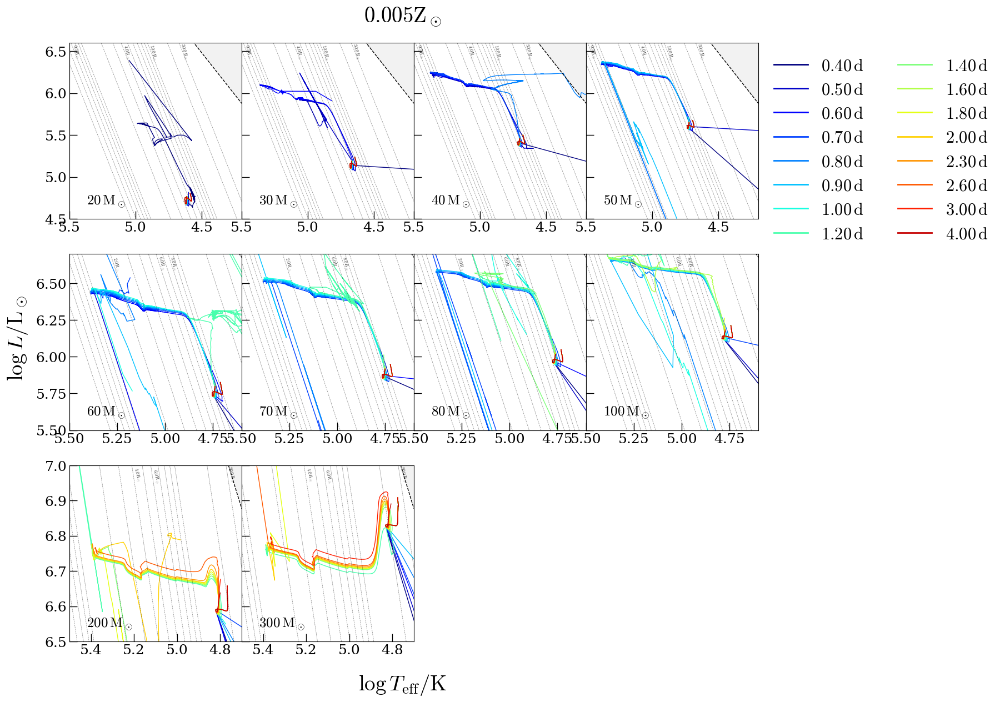

In [ ]:
fig, axes = plt.subplots(3, 4, figsize=(16, 14))
fig.subplots_adjust(wspace=0)

model_dicts = model_dicts_0005zsun

mass_label_x = 0.1
mass_label_y = 0.1
mass_label_fontsize = 18

xlim = (5.5, 4.2)
ylim = (4.5, 6.6)

# PLOT M=20
ax = axes[0, 0]
models_to_plot = [0]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$20\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=30
ax = axes[0, 1]
models_to_plot = [1]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$30\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=40
ax = axes[0, 2]
models_to_plot = [2]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$40\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=50
ax = axes[0, 3]
models_to_plot = [3]
model_style_list = ['-']
legend = True
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$50\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

xlim = (5.5, 4.6)
ylim = (5.5, 6.7)

# PLOT M=60
ax = axes[1, 0]
models_to_plot = [4]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$60\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)



# PLOT M=70
ax = axes[1, 1]
models_to_plot = [5]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$70\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=80
ax = axes[1, 2]
models_to_plot = [6]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$80\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=100
ax = axes[1, 3]
models_to_plot = [7]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$100\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)


xlim = (5.5, 4.7)
ylim = (6.5, 7.0)

# PLOT M=200
ax = axes[2, 0]
models_to_plot = [8]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$200\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=300
ax = axes[2, 1]
models_to_plot = [9]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$300\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

axes[2, 2].axis('off')
axes[2, 3].axis('off')


#######################################

fig.text(0.5, 0.07, '$\\log T_\\mathrm{eff}/\\mathrm{K}$', va='top', ha='center')
fig.text(0.08, 0.5, '$\\log L/\\mathrm{L}_\\odot$', rotation=90, va='center', ha='right')
fig.text(0.5, 0.9, '$0.005\\mathrm{Z}_\\odot$', va='bottom', ha='center')

savefig(fig, 'hr_allp_mass_comparison_0005Zsun')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


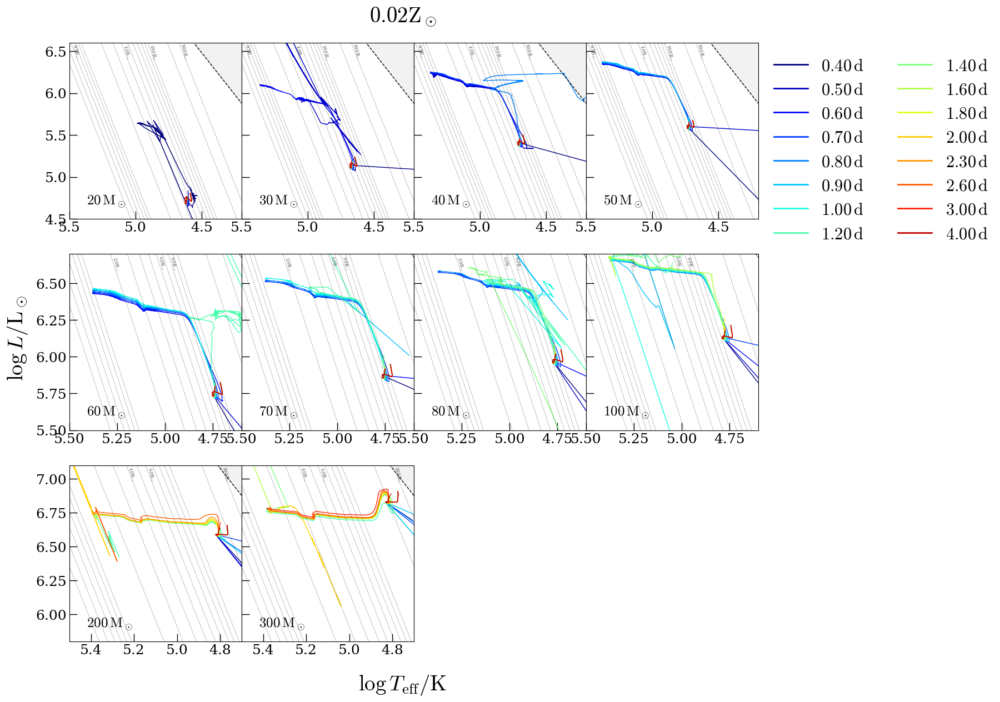

In [ ]:
fig, axes = plt.subplots(3, 4, figsize=(16, 14))
fig.subplots_adjust(wspace=0)

model_dicts = model_dicts_002zsun

mass_label_x = 0.1
mass_label_y = 0.1
mass_label_fontsize = 18

xlim = (5.5, 4.2)
ylim = (4.5, 6.6)

# PLOT M=20
ax = axes[0, 0]
models_to_plot = [0]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$20\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=30
ax = axes[0, 1]
models_to_plot = [1]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$30\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=40
ax = axes[0, 2]
models_to_plot = [2]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$40\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=50
ax = axes[0, 3]
models_to_plot = [3]
model_style_list = ['-']
legend = True
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$50\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

xlim = (5.5, 4.6)
ylim = (5.5, 6.7)

# PLOT M=60
ax = axes[1, 0]
models_to_plot = [4]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$60\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)



# PLOT M=70
ax = axes[1, 1]
models_to_plot = [5]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$70\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=80
ax = axes[1, 2]
models_to_plot = [6]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$80\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=100
ax = axes[1, 3]
models_to_plot = [7]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$100\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)


xlim = (5.5, 4.7)
ylim = (5.8, 7.1)

# PLOT M=200
ax = axes[2, 0]
models_to_plot = [8]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$200\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=300
ax = axes[2, 1]
models_to_plot = [9]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$300\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

axes[2, 2].axis('off')
axes[2, 3].axis('off')


#######################################

fig.text(0.5, 0.07, '$\\log T_\\mathrm{eff}/\\mathrm{K}$', va='top', ha='center')
fig.text(0.08, 0.5, '$\\log L/\\mathrm{L}_\\odot$', rotation=90, va='center', ha='right')
fig.text(0.5, 0.9, '$0.02\\mathrm{Z}_\\odot$', va='bottom', ha='center')

savefig(fig, 'hr_allp_mass_comparison_002Zsun')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


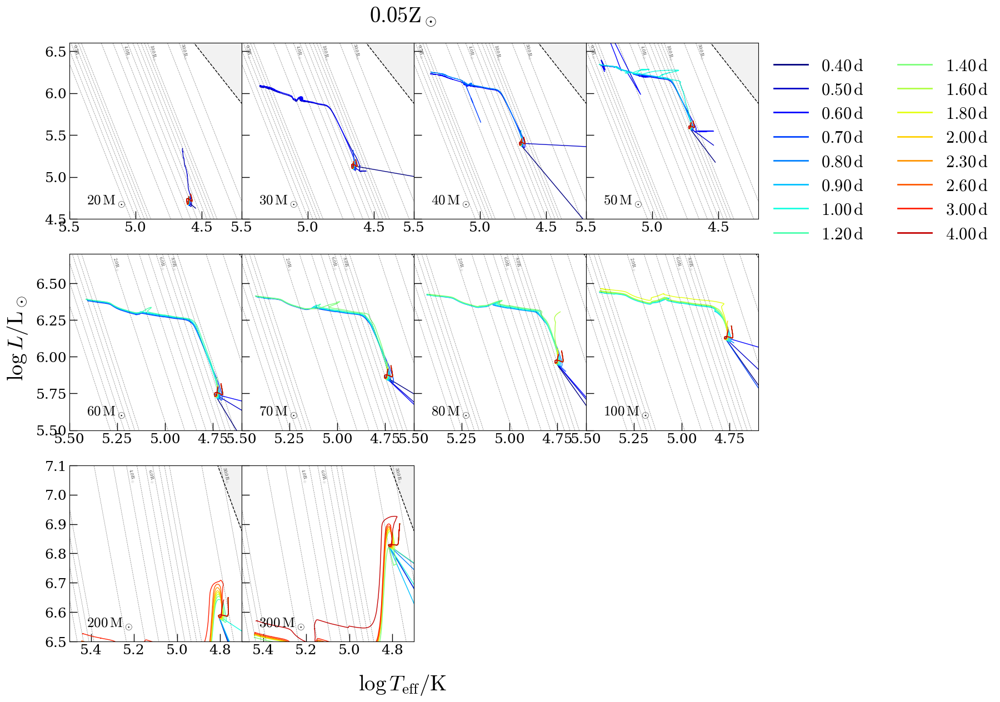

In [ ]:
fig, axes = plt.subplots(3, 4, figsize=(16, 14))
fig.subplots_adjust(wspace=0)

model_dicts = model_dicts_005zsun

mass_label_x = 0.1
mass_label_y = 0.1
mass_label_fontsize = 18

xlim = (5.5, 4.2)
ylim = (4.5, 6.6)

# PLOT M=20
ax = axes[0, 0]
models_to_plot = [0]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$20\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=30
ax = axes[0, 1]
models_to_plot = [1]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$30\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=40
ax = axes[0, 2]
models_to_plot = [2]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$40\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=50
ax = axes[0, 3]
models_to_plot = [3]
model_style_list = ['-']
legend = True
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$50\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

xlim = (5.5, 4.6)
ylim = (5.5, 6.7)

# PLOT M=60
ax = axes[1, 0]
models_to_plot = [4]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$60\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)



# PLOT M=70
ax = axes[1, 1]
models_to_plot = [5]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$70\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=80
ax = axes[1, 2]
models_to_plot = [6]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$80\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=100
ax = axes[1, 3]
models_to_plot = [7]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$100\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)


xlim = (5.5, 4.7)
ylim = (6.5, 7.1)

# PLOT M=200
ax = axes[2, 0]
models_to_plot = [8]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$200\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=300
ax = axes[2, 1]
models_to_plot = [9]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$300\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

axes[2, 2].axis('off')
axes[2, 3].axis('off')


#######################################

fig.text(0.5, 0.07, '$\\log T_\\mathrm{eff}/\\mathrm{K}$', va='top', ha='center')
fig.text(0.08, 0.5, '$\\log L/\\mathrm{L}_\\odot$', rotation=90, va='center', ha='right')
fig.text(0.5, 0.9, '$0.05\\mathrm{Z}_\\odot$', va='bottom', ha='center')

savefig(fig, 'hr_allp_mass_comparison_005Zsun')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


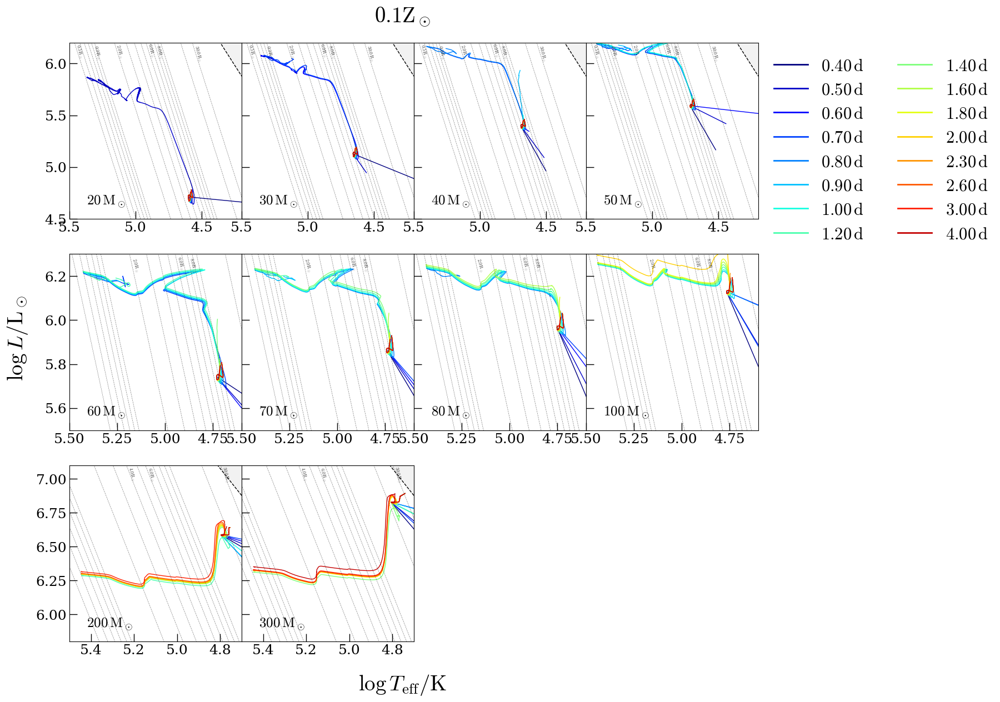

In [ ]:
fig, axes = plt.subplots(3, 4, figsize=(16, 14))
fig.subplots_adjust(wspace=0)

model_dicts = model_dicts_01zsun

mass_label_x = 0.1
mass_label_y = 0.1
mass_label_fontsize = 18

xlim = (5.5, 4.2)
ylim = (4.5, 6.2)

# PLOT M=20
ax = axes[0, 0]
models_to_plot = [0]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$20\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=30
ax = axes[0, 1]
models_to_plot = [1]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$30\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=40
ax = axes[0, 2]
models_to_plot = [2]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$40\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=50
ax = axes[0, 3]
models_to_plot = [3]
model_style_list = ['-']
legend = True
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$50\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

xlim = (5.5, 4.6)
ylim = (5.5, 6.3)

# PLOT M=60
ax = axes[1, 0]
models_to_plot = [4]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$60\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)



# PLOT M=70
ax = axes[1, 1]
models_to_plot = [5]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$70\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=80
ax = axes[1, 2]
models_to_plot = [6]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$80\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=100
ax = axes[1, 3]
models_to_plot = [7]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$100\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)


xlim = (5.5, 4.7)
ylim = (5.8, 7.1)

# PLOT M=200
ax = axes[2, 0]
models_to_plot = [8]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$200\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=300
ax = axes[2, 1]
models_to_plot = [9]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$300\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

axes[2, 2].axis('off')
axes[2, 3].axis('off')


#######################################

fig.text(0.5, 0.07, '$\\log T_\\mathrm{eff}/\\mathrm{K}$', va='top', ha='center')
fig.text(0.08, 0.5, '$\\log L/\\mathrm{L}_\\odot$', rotation=90, va='center', ha='right')
fig.text(0.5, 0.9, '$0.1\\mathrm{Z}_\\odot$', va='bottom', ha='center')

savefig(fig, 'hr_allp_mass_comparison_01Zsun')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


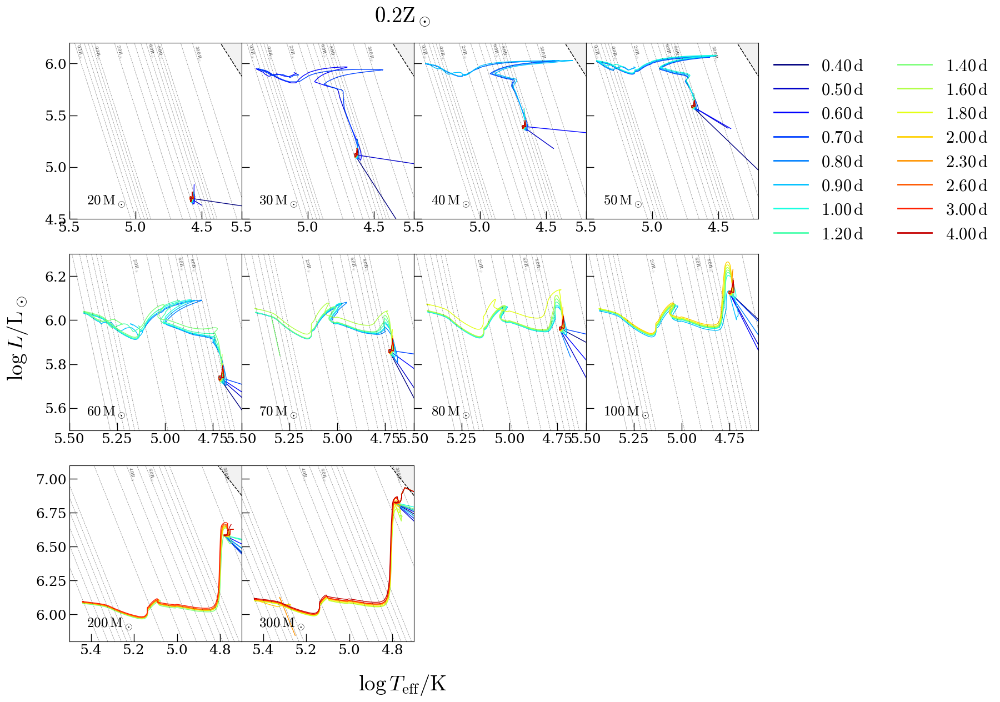

In [ ]:
fig, axes = plt.subplots(3, 4, figsize=(16, 14))
fig.subplots_adjust(wspace=0)

model_dicts = model_dicts_02zsun

mass_label_x = 0.1
mass_label_y = 0.1
mass_label_fontsize = 18

xlim = (5.5, 4.2)
ylim = (4.5, 6.2)

# PLOT M=20
ax = axes[0, 0]
models_to_plot = [0]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$20\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=30
ax = axes[0, 1]
models_to_plot = [1]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$30\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=40
ax = axes[0, 2]
models_to_plot = [2]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$40\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=50
ax = axes[0, 3]
models_to_plot = [3]
model_style_list = ['-']
legend = True
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$50\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

xlim = (5.5, 4.6)
ylim = (5.5, 6.3)

# PLOT M=60
ax = axes[1, 0]
models_to_plot = [4]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$60\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)



# PLOT M=70
ax = axes[1, 1]
models_to_plot = [5]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$70\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=80
ax = axes[1, 2]
models_to_plot = [6]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$80\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=100
ax = axes[1, 3]
models_to_plot = [7]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$100\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)


xlim = (5.5, 4.7)
ylim = (5.8, 7.1)

# PLOT M=200
ax = axes[2, 0]
models_to_plot = [8]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$200\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=300
ax = axes[2, 1]
models_to_plot = [9]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$300\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

axes[2, 2].axis('off')
axes[2, 3].axis('off')


#######################################

fig.text(0.5, 0.07, '$\\log T_\\mathrm{eff}/\\mathrm{K}$', va='top', ha='center')
fig.text(0.08, 0.5, '$\\log L/\\mathrm{L}_\\odot$', rotation=90, va='center', ha='right')
fig.text(0.5, 0.9, '$0.2\\mathrm{Z}_\\odot$', va='bottom', ha='center')

savefig(fig, 'hr_allp_mass_comparison_02Zsun')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


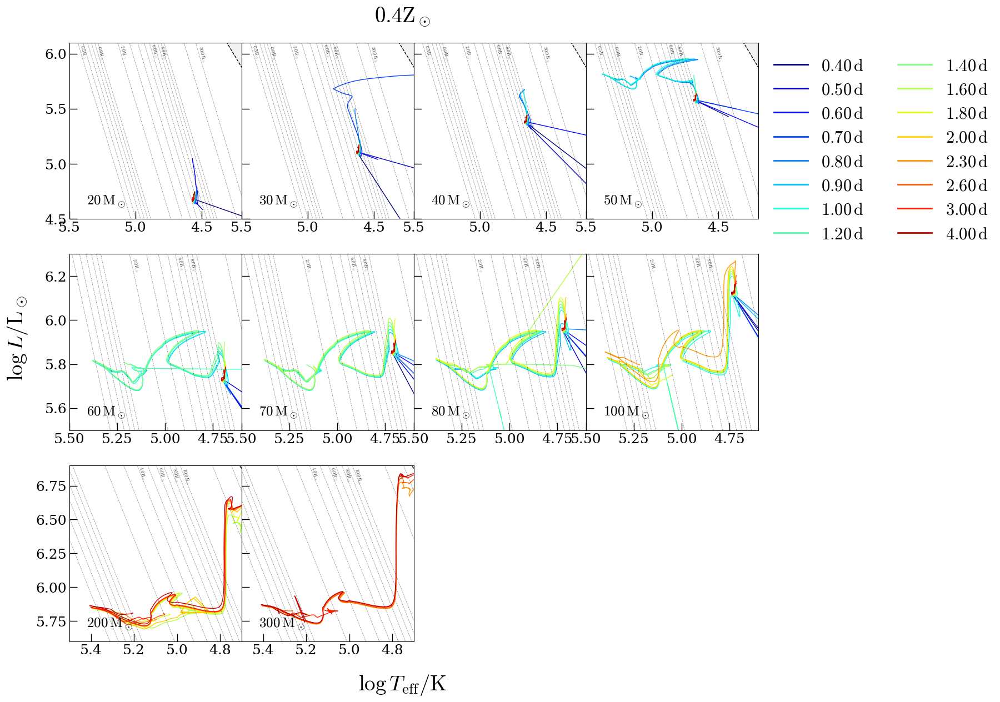

In [ ]:
fig, axes = plt.subplots(3, 4, figsize=(16, 14))
fig.subplots_adjust(wspace=0)

model_dicts = model_dicts_04zsun

mass_label_x = 0.1
mass_label_y = 0.1
mass_label_fontsize = 18

xlim = (5.5, 4.2)
ylim = (4.5, 6.1)

# PLOT M=20
ax = axes[0, 0]
models_to_plot = [0]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$20\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=30
ax = axes[0, 1]
models_to_plot = [1]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$30\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=40
ax = axes[0, 2]
models_to_plot = [2]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$40\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=50
ax = axes[0, 3]
models_to_plot = [3]
model_style_list = ['-']
legend = True
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$50\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

xlim = (5.5, 4.6)
ylim = (5.5, 6.3)

# PLOT M=60
ax = axes[1, 0]
models_to_plot = [4]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$60\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)



# PLOT M=70
ax = axes[1, 1]
models_to_plot = [5]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$70\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=80
ax = axes[1, 2]
models_to_plot = [6]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$80\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=100
ax = axes[1, 3]
models_to_plot = [7]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$100\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)


xlim = (5.5, 4.7)
ylim = (5.6, 6.9)

# PLOT M=200
ax = axes[2, 0]
models_to_plot = [8]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$200\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=300
ax = axes[2, 1]
models_to_plot = [9]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$300\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

axes[2, 2].axis('off')
axes[2, 3].axis('off')


#######################################

fig.text(0.5, 0.07, '$\\log T_\\mathrm{eff}/\\mathrm{K}$', va='top', ha='center')
fig.text(0.08, 0.5, '$\\log L/\\mathrm{L}_\\odot$', rotation=90, va='center', ha='right')
fig.text(0.5, 0.9, '$0.4\\mathrm{Z}_\\odot$', va='bottom', ha='center')

savefig(fig, 'hr_allp_mass_comparison_04zsun')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


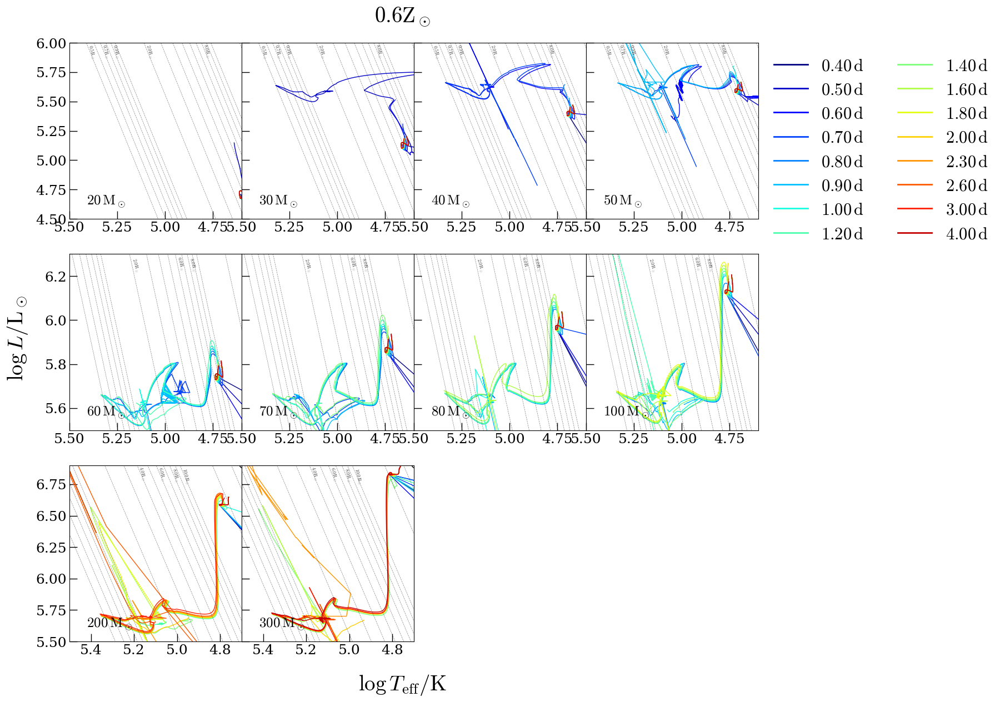

In [ ]:
fig, axes = plt.subplots(3, 4, figsize=(16, 14))
fig.subplots_adjust(wspace=0)

model_dicts = model_dicts_06zsun

mass_label_x = 0.1
mass_label_y = 0.1
mass_label_fontsize = 18

xlim = (5.5, 4.6)
ylim = (4.5, 6.0)

# PLOT M=20
ax = axes[0, 0]
models_to_plot = [0]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$20\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=30
ax = axes[0, 1]
models_to_plot = [1]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$30\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=40
ax = axes[0, 2]
models_to_plot = [2]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$40\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=50
ax = axes[0, 3]
models_to_plot = [3]
model_style_list = ['-']
legend = True
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$50\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

xlim = (5.5, 4.6)
ylim = (5.5, 6.3)

# PLOT M=60
ax = axes[1, 0]
models_to_plot = [4]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$60\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)



# PLOT M=70
ax = axes[1, 1]
models_to_plot = [5]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$70\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=80
ax = axes[1, 2]
models_to_plot = [6]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$80\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=100
ax = axes[1, 3]
models_to_plot = [7]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$100\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)


xlim = (5.5, 4.7)
ylim = (5.5, 6.9)

# PLOT M=200
ax = axes[2, 0]
models_to_plot = [8]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$200\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=300
ax = axes[2, 1]
models_to_plot = [9]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$300\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

axes[2, 2].axis('off')
axes[2, 3].axis('off')


#######################################

fig.text(0.5, 0.07, '$\\log T_\\mathrm{eff}/\\mathrm{K}$', va='top', ha='center')
fig.text(0.08, 0.5, '$\\log L/\\mathrm{L}_\\odot$', rotation=90, va='center', ha='right')
fig.text(0.5, 0.9, '$0.6\\mathrm{Z}_\\odot$', va='bottom', ha='center')

savefig(fig, 'hr_allp_mass_comparison_06zsun')

Model /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/004_md1_m50_zsundiv10_04y0_03dy/m5.000d+01_p7.000d-01_w1.039d-04 failed to load.
Model /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/008_md1_m100_zsundiv10_04y0_03dy/m1.000d+02_p1.000d+00_w7.272d-05 failed to load.


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


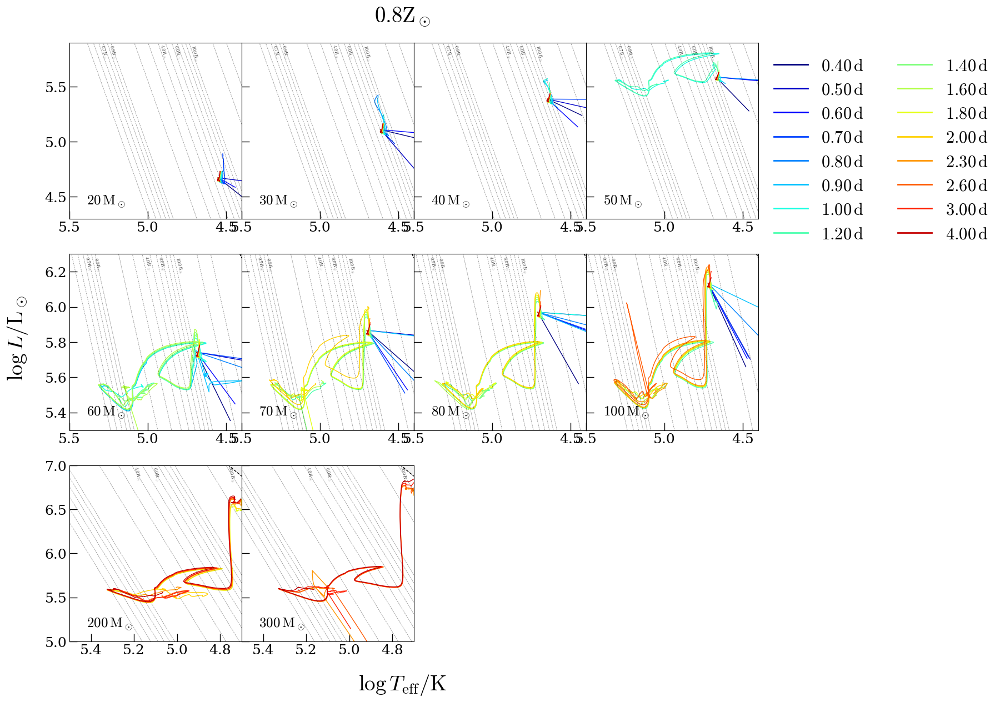

In [ ]:
fig, axes = plt.subplots(3, 4, figsize=(16, 14))
fig.subplots_adjust(wspace=0)

model_dicts = model_dicts_08zsun

mass_label_x = 0.1
mass_label_y = 0.1
mass_label_fontsize = 18

xlim = (5.5, 4.4)
ylim = (4.3, 5.9)

# PLOT M=20
ax = axes[0, 0]
models_to_plot = [0]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$20\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=30
ax = axes[0, 1]
models_to_plot = [1]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$30\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=40
ax = axes[0, 2]
models_to_plot = [2]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$40\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=50
ax = axes[0, 3]
models_to_plot = [3]
model_style_list = ['-']
legend = True
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$50\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

xlim = (5.5, 4.4)
ylim = (5.3, 6.3)

# PLOT M=60
ax = axes[1, 0]
models_to_plot = [4]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$60\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)



# PLOT M=70
ax = axes[1, 1]
models_to_plot = [5]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$70\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=80
ax = axes[1, 2]
models_to_plot = [6]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$80\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=100
ax = axes[1, 3]
models_to_plot = [7]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$100\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)


xlim = (5.5, 4.7)
ylim = (5, 7.0)

# PLOT M=200
ax = axes[2, 0]
models_to_plot = [8]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$200\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=300
ax = axes[2, 1]
models_to_plot = [9]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$300\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

axes[2, 2].axis('off')
axes[2, 3].axis('off')


#######################################

fig.text(0.5, 0.07, '$\\log T_\\mathrm{eff}/\\mathrm{K}$', va='top', ha='center')
fig.text(0.08, 0.5, '$\\log L/\\mathrm{L}_\\odot$', rotation=90, va='center', ha='right')
fig.text(0.5, 0.9, '$0.8\\mathrm{Z}_\\odot$', va='bottom', ha='center')

savefig(fig, 'hr_allp_mass_comparison_08zsun')

Model /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/05_ZdivZsun_1d0/002_md1_m30_zsundiv10_04y0_03dy/m3.000d+01_p6.000d-01_w1.212d-04 failed to load.
Model /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/05_ZdivZsun_1d0/003_md1_m40_zsundiv10_04y0_03dy/m4.000d+01_p4.000d-01_w1.818d-04 failed to load.
Model /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/05_ZdivZsun_1d0/004_md1_m50_zsundiv10_04y0_03dy/m5.000d+01_p6.000d-01_w1.212d-04 failed to load.
Model /mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/05_ZdivZsun_1d0/008_md1_m100_zsundiv10_04y0_03dy/m1.000d+02_p5.000d-01_w1.454d-04 failed to load.


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


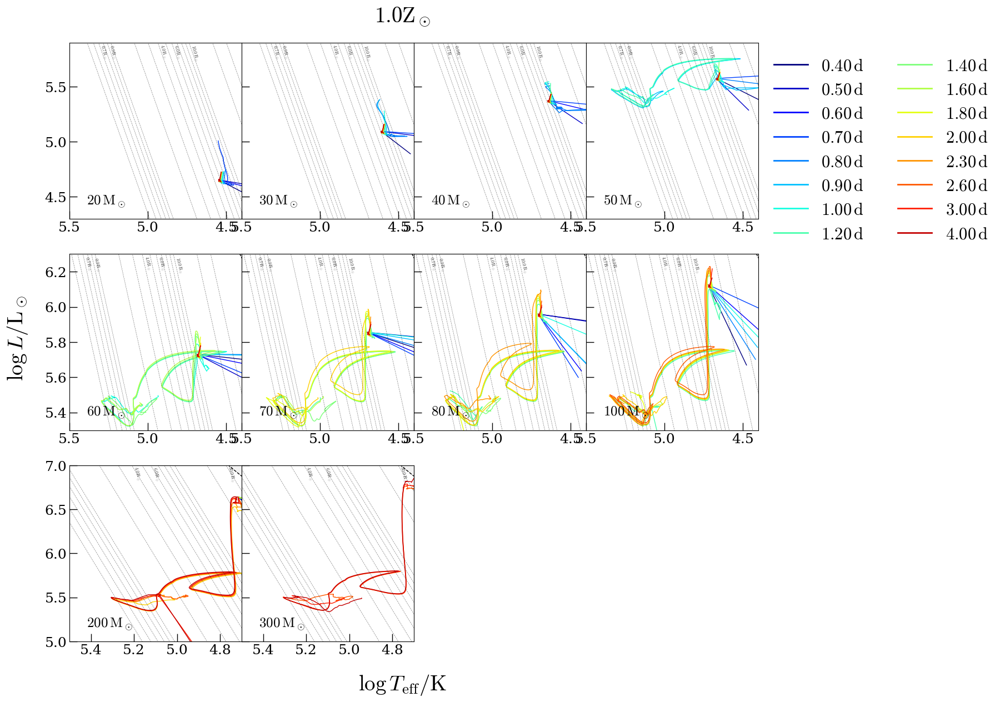

In [ ]:
fig, axes = plt.subplots(3, 4, figsize=(16, 14))
fig.subplots_adjust(wspace=0)

model_dicts = model_dicts_10zsun

mass_label_x = 0.1
mass_label_y = 0.1
mass_label_fontsize = 18

xlim = (5.5, 4.4)
ylim = (4.3, 5.9)

# PLOT M=20
ax = axes[0, 0]
models_to_plot = [0]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$20\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=30
ax = axes[0, 1]
models_to_plot = [1]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$30\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=40
ax = axes[0, 2]
models_to_plot = [2]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$40\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=50
ax = axes[0, 3]
models_to_plot = [3]
model_style_list = ['-']
legend = True
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$50\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

xlim = (5.5, 4.4)
ylim = (5.3, 6.3)

# PLOT M=60
ax = axes[1, 0]
models_to_plot = [4]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$60\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)



# PLOT M=70
ax = axes[1, 1]
models_to_plot = [5]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$70\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=80
ax = axes[1, 2]
models_to_plot = [6]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$80\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=100
ax = axes[1, 3]
models_to_plot = [7]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$100\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)


xlim = (5.5, 4.7)
ylim = (5, 7.0)

# PLOT M=200
ax = axes[2, 0]
models_to_plot = [8]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.text(mass_label_x, mass_label_y, '$200\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

# PLOT M=300
ax = axes[2, 1]
models_to_plot = [9]
model_style_list = ['-']
legend = False
labelx = False
labely = False

ax, handles = hr_diagram_tracks(
    ax=ax,
    models_to_plot=models_to_plot,
    model_style_list=model_style_list,
    xlim=xlim,
    ylim=ylim,
    legend=legend,
    labelx=labelx,
    labely=labely
    )

ax.tick_params(direction='in')
ax.set_yticklabels([])
ax.text(mass_label_x, mass_label_y, '$300\\,\\mathrm{M}_\\odot$', va='center', ha='left', transform=ax.transAxes, fontsize=mass_label_fontsize)

axes[2, 2].axis('off')
axes[2, 3].axis('off')


#######################################

fig.text(0.5, 0.07, '$\\log T_\\mathrm{eff}/\\mathrm{K}$', va='top', ha='center')
fig.text(0.08, 0.5, '$\\log L/\\mathrm{L}_\\odot$', rotation=90, va='center', ha='right')
fig.text(0.5, 0.9, '$1.0\\mathrm{Z}_\\odot$', va='bottom', ha='center')

savefig(fig, 'hr_allp_mass_comparison_10zsun')

# Models that don't get to C depl

In [ ]:
test_z = '0.1'
test_m = '80.0'
test_p = '1.00'

TypeError: plot.plotKip3() got an unexpected keyword argument 'minx'

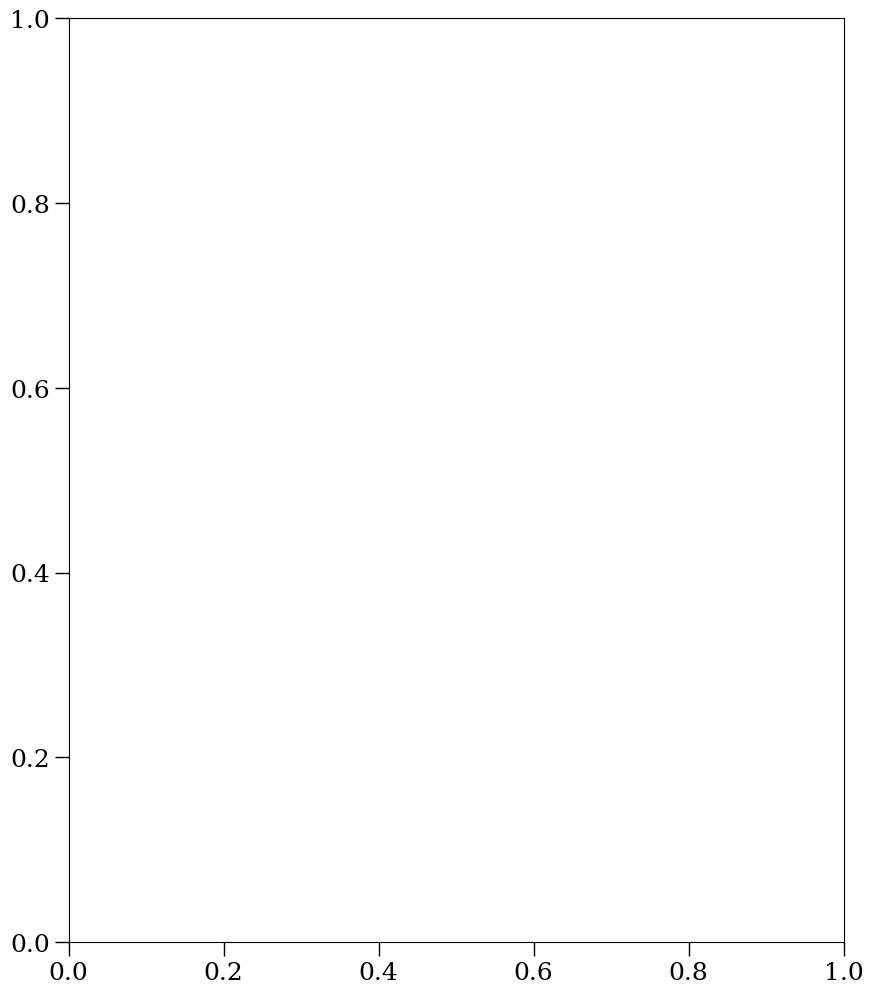

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
#ax.set_ylim(1e-1, 60)

model_dicts = all_model_dicts[test_z]
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[test_m][test_p]/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax)



Text(0.5, 1.0, '$0.02\\mathrm{Z}_\\odot$, $80.0\\,\\mathrm{M}_\\odot$, $0.80\\,\\mathrm{d}$, $4.66\\,\\mathrm{Myr}$ @stop')

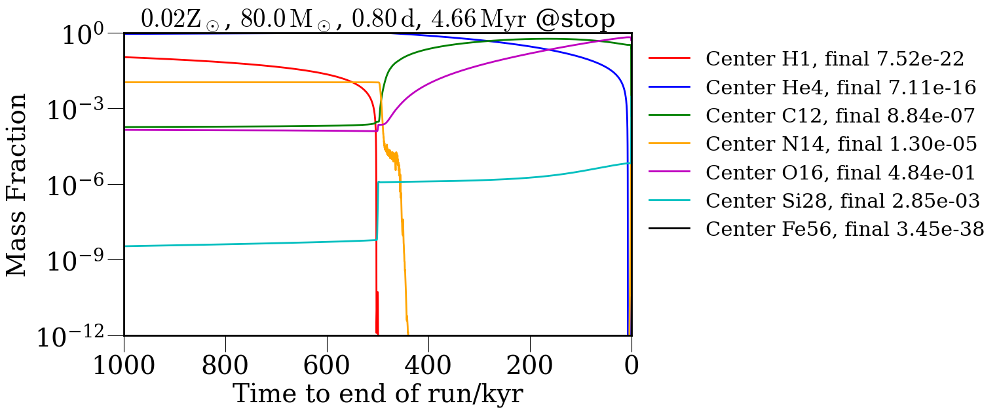

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
h = pop3_h
x = (h.star_age[-1] - h.star_age)/1e3
ax.plot(x, h.center_h1, label=f'Center H1, final {h.center_h1[-1]:.2e}', c='r')
ax.plot(x, h.center_he4, label=f'Center He4, final {h.center_he4[-1]:.2e}', c='b')
ax.plot(x, h.center_c12, label=f'Center C12, final {h.center_c12[-1]:.2e}', c='g')
ax.plot(x, h.center_n14, label=f'Center N14, final {h.center_n14[-1]:.2e}', c='orange')
ax.plot(x, h.center_o16, label=f'Center O16, final {h.center_o16[-1]:.2e}', c='m')
ax.plot(x, h.center_si28, label=f'Center Si28, final {h.center_si28[-1]:.2e}', c='c')
ax.plot(x, h.center_fe56, label=f'Center Fe56, final {h.center_fe56[-1]:.2e}', c='k')
ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.set_xlabel('Time to end of run/kyr')
ax.set_ylabel('Mass Fraction')
ax.set_yscale('log')
ax.invert_xaxis()
ax.set_xlim(1000, 0)
ax.set_ylim(1e-12, 1)
ax.set_title(f'${test_z}\\mathrm{{Z}}_\\odot$, ${test_m}\\,\\mathrm{{M}}_\\odot$, ${test_p}\,\\mathrm{{d}}$, ${h.star_age[-1]/1e6:.2f}\\,\\mathrm{{Myr}}$ @stop')

# Structure of very-low-metallicity stars (pop III like)

Let us look first at a well-behaved CHE case from a metallicity that has not shown issues.

In [ ]:
test_z = '1.0'
test_m = '80.0'
test_p = '1.60'

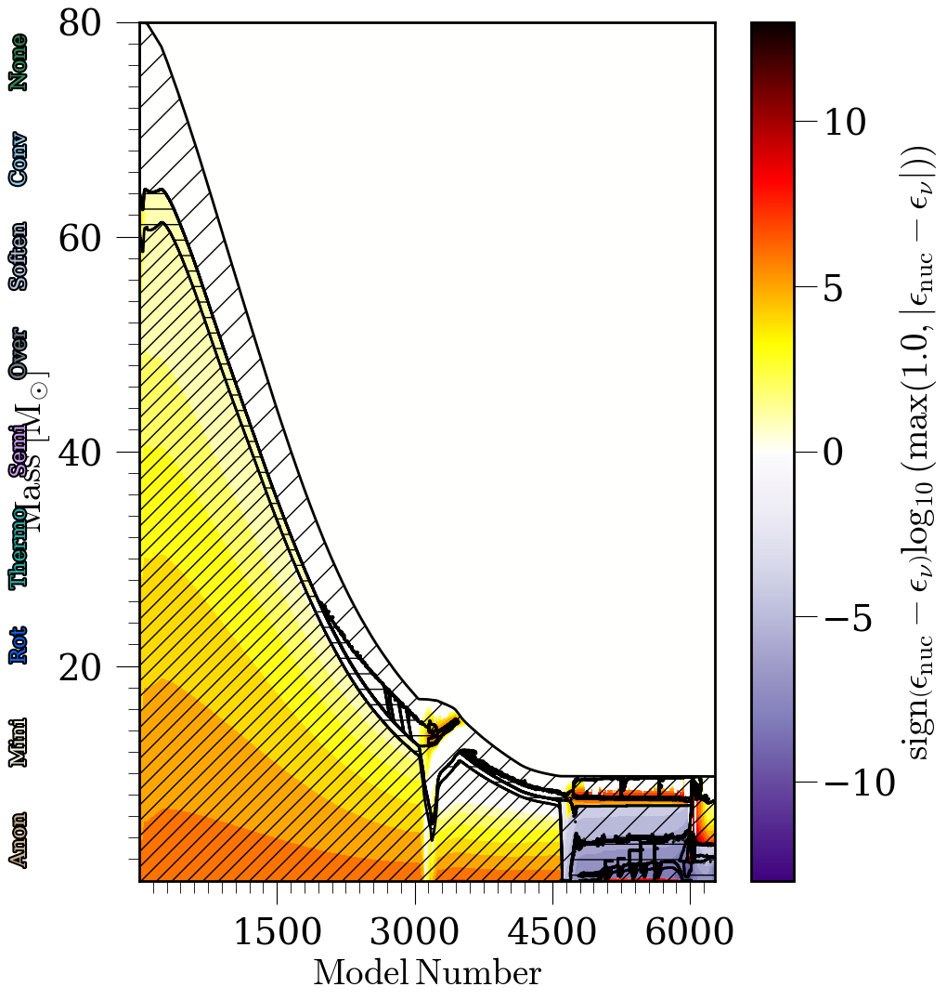

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
#ax.set_ylim(1e-1, 60)

model_dicts = all_model_dicts[test_z]
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[test_m][test_p]/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax)


In [ ]:
pop3_h = mr.MesaData(str(model_dicts[test_m][test_p]/'LOGS/history.data'))
logs = mr.MesaLogDir(str(model_dicts[test_m][test_p]/'LOGS'))

(310.0, 300.0)

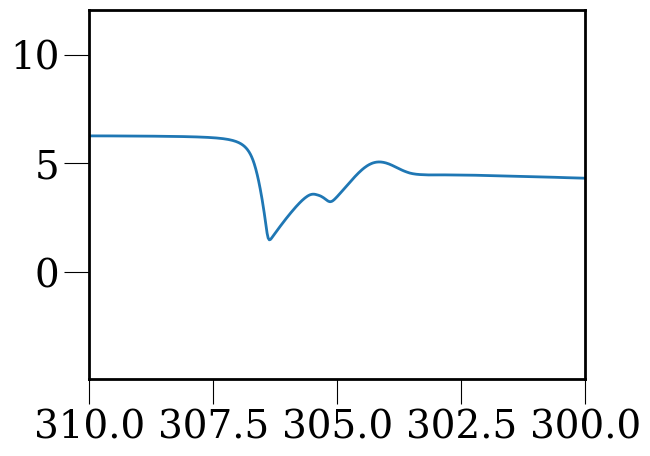

In [ ]:
plt.plot(x, h.cno)
plt.xlim(310, 300)

(400.0, 0.0)

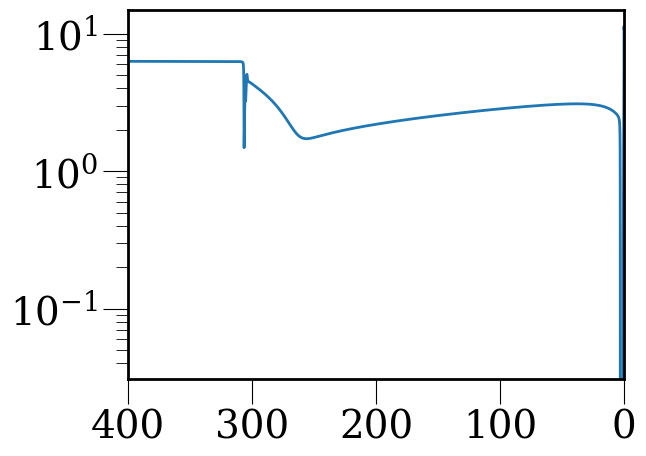

In [ ]:
plt.plot(x, h.cno)
plt.yscale('log')
plt.xlim(400, 0)

Text(0.5, 1.0, '$1.0\\mathrm{Z}_\\odot$, $80.0\\,\\mathrm{M}_\\odot$, $1.60\\,\\mathrm{d}$, $4.66\\,\\mathrm{Myr}$ @stop')

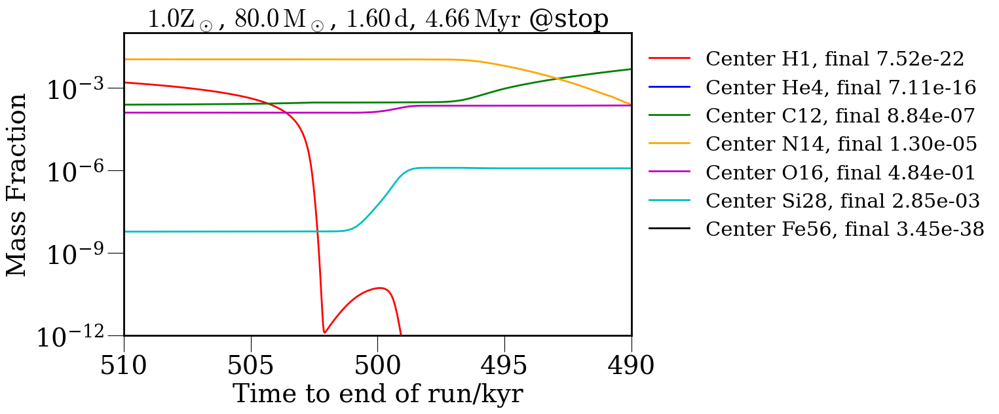

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
h = pop3_h
x = (h.star_age[-1] - h.star_age)/1e3
ax.plot(x, h.center_h1, label=f'Center H1, final {h.center_h1[-1]:.2e}', c='r')
ax.plot(x, h.center_he4, label=f'Center He4, final {h.center_he4[-1]:.2e}', c='b')
ax.plot(x, h.center_c12, label=f'Center C12, final {h.center_c12[-1]:.2e}', c='g')
ax.plot(x, h.center_n14, label=f'Center N14, final {h.center_n14[-1]:.2e}', c='orange')
ax.plot(x, h.center_o16, label=f'Center O16, final {h.center_o16[-1]:.2e}', c='m')
ax.plot(x, h.center_si28, label=f'Center Si28, final {h.center_si28[-1]:.2e}', c='c')
ax.plot(x, h.center_fe56, label=f'Center Fe56, final {h.center_fe56[-1]:.2e}', c='k')
ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.set_xlabel('Time to end of run/kyr')
ax.set_ylabel('Mass Fraction')
ax.set_yscale('log')
ax.invert_xaxis()
ax.set_xlim(510, 490)
ax.set_ylim(1e-12, 1e-1)
ax.set_title(f'${test_z}\\mathrm{{Z}}_\\odot$, ${test_m}\\,\\mathrm{{M}}_\\odot$, ${test_p}\,\\mathrm{{d}}$, ${h.star_age[-1]/1e6:.2f}\\,\\mathrm{{Myr}}$ @stop')

Text(0.5, 1.0, '$1.0\\mathrm{Z}_\\odot$, $80.0\\,\\mathrm{M}_\\odot$, $1.60\\,\\mathrm{d}$, $4.66\\,\\mathrm{Myr}$ @stop')

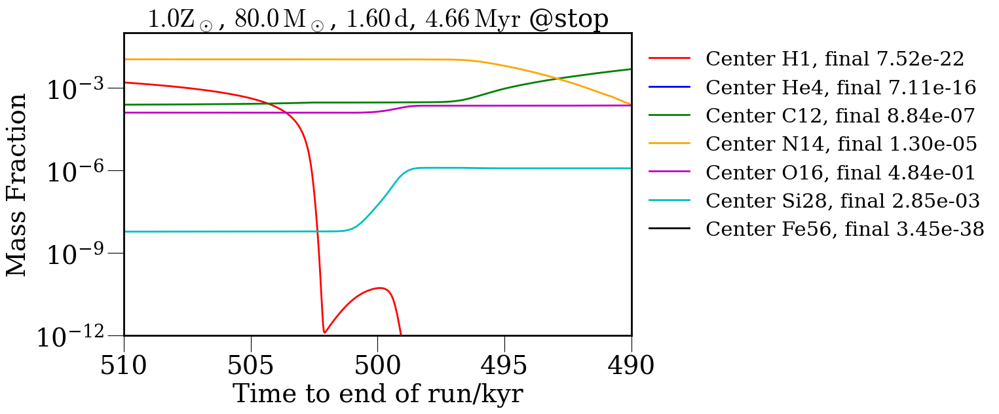

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
h = pop3_h
x = (h.star_age[-1] - h.star_age)/1e3
ax.plot(x, h.center_h1, label=f'Center H1, final {h.center_h1[-1]:.2e}', c='r')
ax.plot(x, h.center_he4, label=f'Center He4, final {h.center_he4[-1]:.2e}', c='b')
ax.plot(x, h.center_c12, label=f'Center C12, final {h.center_c12[-1]:.2e}', c='g')
ax.plot(x, h.center_n14, label=f'Center N14, final {h.center_n14[-1]:.2e}', c='orange')
ax.plot(x, h.center_o16, label=f'Center O16, final {h.center_o16[-1]:.2e}', c='m')
ax.plot(x, h.center_si28, label=f'Center Si28, final {h.center_si28[-1]:.2e}', c='c')
ax.plot(x, h.center_fe56, label=f'Center Fe56, final {h.center_fe56[-1]:.2e}', c='k')
ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.set_xlabel('Time to end of run/kyr')
ax.set_ylabel('Mass Fraction')
ax.set_yscale('log')
ax.invert_xaxis()
ax.set_xlim(510, 490)
ax.set_ylim(1e-12, 1e-1)
ax.set_title(f'${test_z}\\mathrm{{Z}}_\\odot$, ${test_m}\\,\\mathrm{{M}}_\\odot$, ${test_p}\,\\mathrm{{d}}$, ${h.star_age[-1]/1e6:.2f}\\,\\mathrm{{Myr}}$ @stop')

In [ ]:
prof.bulk_names

('zone',
 'mass',
 'logR',
 'logT',
 'logRho',
 'logP',
 'x_mass_fraction_H',
 'y_mass_fraction_He',
 'z_mass_fraction_metals',
 'dm',
 'logdq',
 'log_g',
 'radius',
 'velocity',
 'scale_height',
 'pressure_scale_height',
 'dq',
 'energy',
 'entropy',
 'prad',
 'pgas',
 'pgas_div_ptotal',
 'eta',
 'mu',
 'grada',
 'dE_dRho',
 'cp',
 'gamma1',
 'csound',
 'v_div_cs',
 'net_nuclear_energy',
 'net_energy',
 'eps_nuc',
 'non_nuc_neu',
 'pp',
 'cno',
 'tri_alpha',
 'c_alpha',
 'n_alpha',
 'o_alpha',
 'ne_alpha',
 'na_alpha',
 'mg_alpha',
 'si_alpha',
 's_alpha',
 'ar_alpha',
 'ca_alpha',
 'ti_alpha',
 'cr_alpha',
 'fe_co_ni',
 'c12_c12',
 'c12_o16',
 'o16_o16',
 'pnhe4',
 'photo',
 'ni56_co56',
 'co56_fe56',
 'other',
 'abar',
 'zbar',
 'z2bar',
 'ye',
 'neut',
 'h1',
 'h2',
 'he3',
 'he4',
 'li7',
 'be7',
 'be9',
 'be10',
 'b8',
 'c12',
 'c13',
 'n13',
 'n14',
 'n15',
 'o14',
 'o15',
 'o16',
 'o17',
 'o18',
 'f17',
 'f18',
 'f19',
 'ne18',
 'ne19',
 'ne20',
 'ne21',
 'ne22',
 'na21',
 'na2

(1e-22, 1e-15)

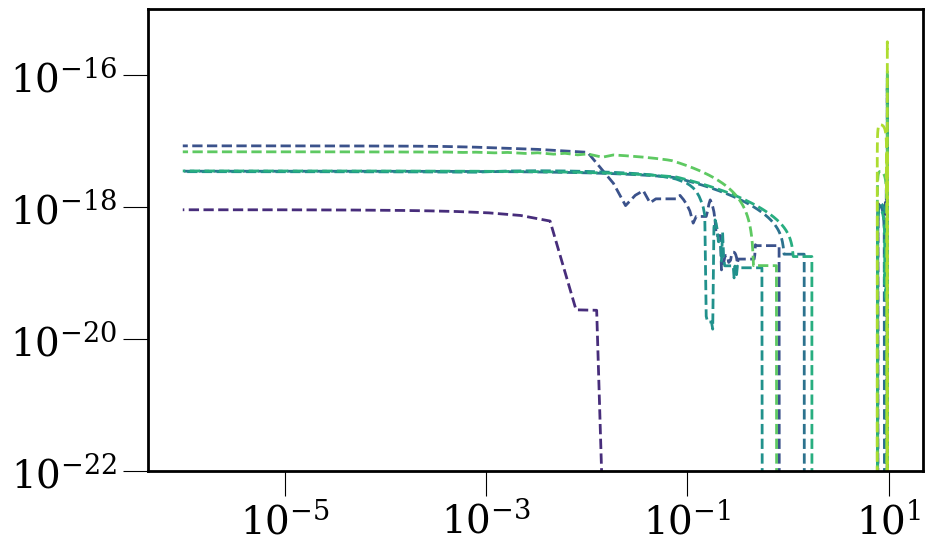

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

i = 0
ns_to_plot = np.arange(48, 64, 2)
for n in ns_to_plot:
    c = cm.viridis(i/len(ns_to_plot))
    prof = logs.profile_data(profile_number=n)
    ax.plot(prof.mass, 10**prof.log_D_mix/10**prof.log_D_mix.max()*prof.h1.max(),c=c, ls='--', lw=2)
    #ax.plot(prof.mass, prof.h1,c=c, lw=2)
    #ax.plot(prof.mass, prof.cno/max(prof.cno)*max(prof.h1), c=c, ls='--', lw=1)
    i += 1
ax.set_yscale('log')
ax.set_xscale('log')
#ax.set_xlim(1e0, 15)
ax.set_ylim(1e-22, 1e-15)

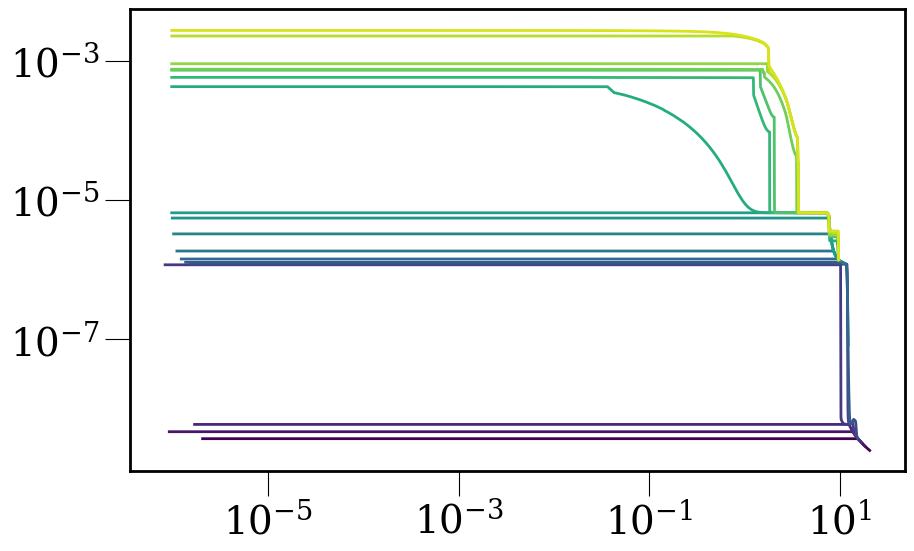

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

i = 0
ns_to_plot = np.arange(28, 64, 2)
for n in ns_to_plot:
    c = cm.viridis(i/len(ns_to_plot))
    prof = logs.profile_data(profile_number=n)
    #ax.plot(prof.mass, 10**prof.log_D_mix/10**prof.log_D_mix.max()*prof.h1.max(),c=c, ls='--', lw=2)
    ax.plot(prof.mass, prof.si28,c=c, lw=2)
    #ax.plot(prof.mass, prof.cno/max(prof.cno)*max(prof.h1), c=c, ls='--', lw=1)
    i += 1
ax.set_yscale('log')
ax.set_xscale('log')
#ax.set_xlim(1e0, 15)
#ax.set_ylim(1e-22, 1e-15)

In [ ]:
test_z = '1.0'
test_m = '300.0'
test_p = '2.60'

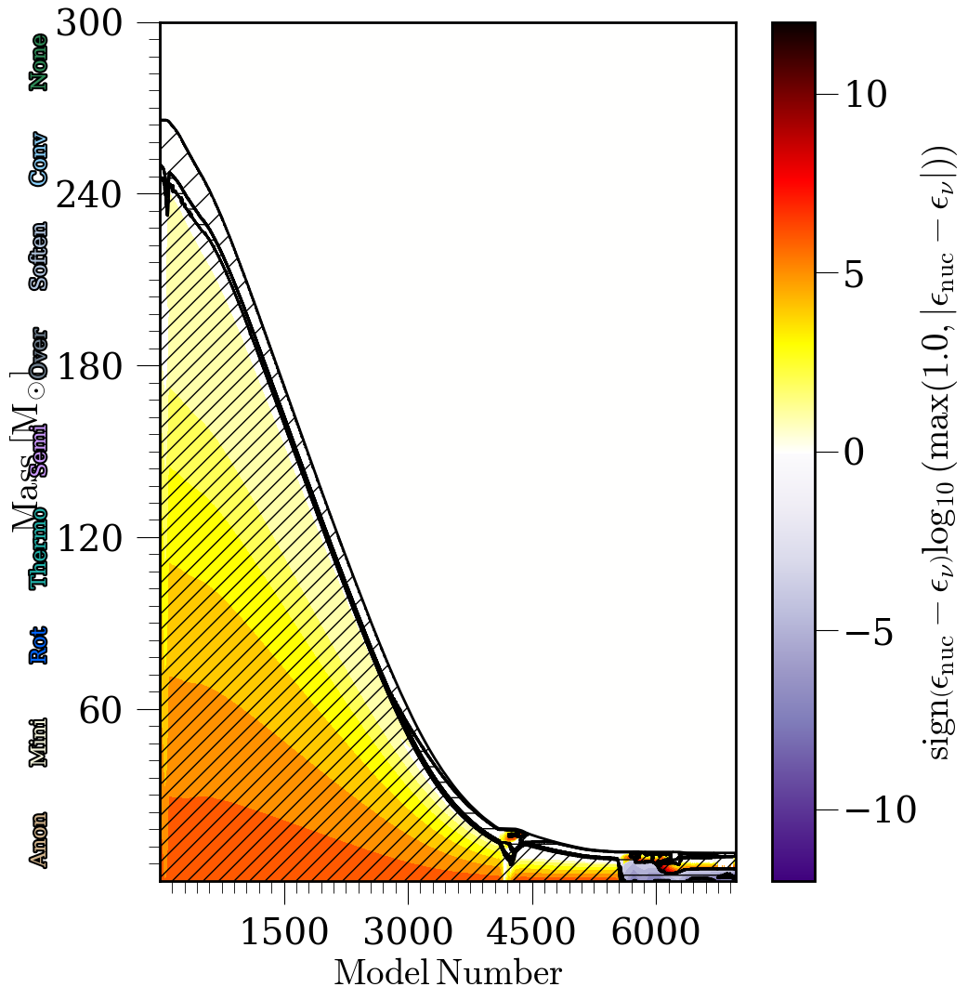

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
#ax.set_ylim(1e-1, 60)

model_dicts = all_model_dicts[test_z]
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[test_m][test_p]/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax)


In [ ]:
pop3_h = mr.MesaData(str(model_dicts[test_m][test_p]/'LOGS/history.data'))

In [ ]:
h.bulk_names

('model_number',
 'num_zones',
 'star_age',
 'star_age_sec',
 'log_dt',
 'star_mass',
 'log_xmstar',
 'star_mdot',
 'log_abs_mdot',
 'mass_conv_core',
 'mix_type_1',
 'mix_qtop_1',
 'mix_type_2',
 'mix_qtop_2',
 'mix_type_3',
 'mix_qtop_3',
 'mix_type_4',
 'mix_qtop_4',
 'mix_type_5',
 'mix_qtop_5',
 'mix_type_6',
 'mix_qtop_6',
 'mix_type_7',
 'mix_qtop_7',
 'mix_type_8',
 'mix_qtop_8',
 'mix_type_9',
 'mix_qtop_9',
 'mix_type_10',
 'mix_qtop_10',
 'mix_type_11',
 'mix_qtop_11',
 'mix_type_12',
 'mix_qtop_12',
 'mix_type_13',
 'mix_qtop_13',
 'mix_type_14',
 'mix_qtop_14',
 'mix_type_15',
 'mix_qtop_15',
 'mix_type_16',
 'mix_qtop_16',
 'mix_type_17',
 'mix_qtop_17',
 'mix_type_18',
 'mix_qtop_18',
 'mix_type_19',
 'mix_qtop_19',
 'mix_type_20',
 'mix_qtop_20',
 'burn_type_1',
 'burn_qtop_1',
 'burn_type_2',
 'burn_qtop_2',
 'burn_type_3',
 'burn_qtop_3',
 'burn_type_4',
 'burn_qtop_4',
 'burn_type_5',
 'burn_qtop_5',
 'burn_type_6',
 'burn_qtop_6',
 'burn_type_7',
 'burn_qtop_7',
 'b

(310.0, 300.0)

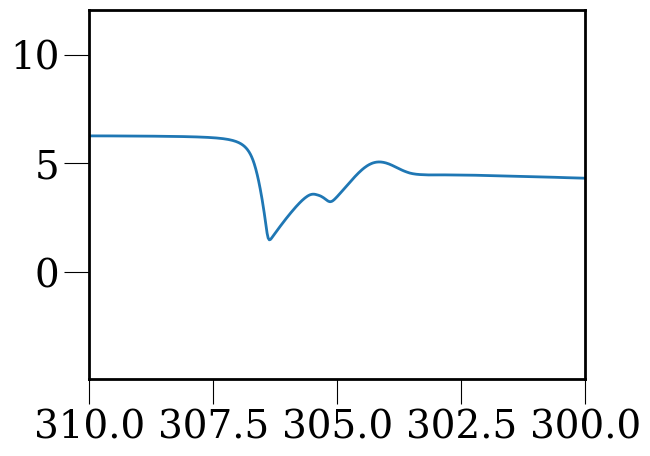

In [ ]:
plt.plot(x, h.cno)
plt.xlim(310, 300)

(400.0, 0.0)

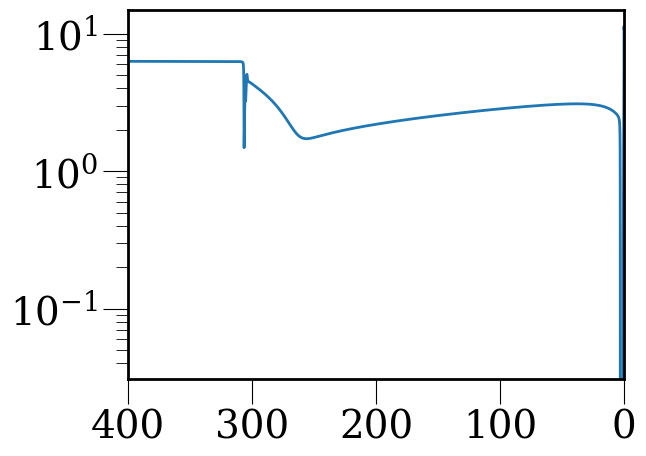

In [ ]:
plt.plot(x, h.cno)
plt.yscale('log')
plt.xlim(400, 0)

Text(0.5, 1.0, '$0.1\\mathrm{Z}_\\odot$, $300.0\\,\\mathrm{M}_\\odot$, $2.60\\,\\mathrm{d}$, $2.71\\,\\mathrm{Myr}$ @stop')

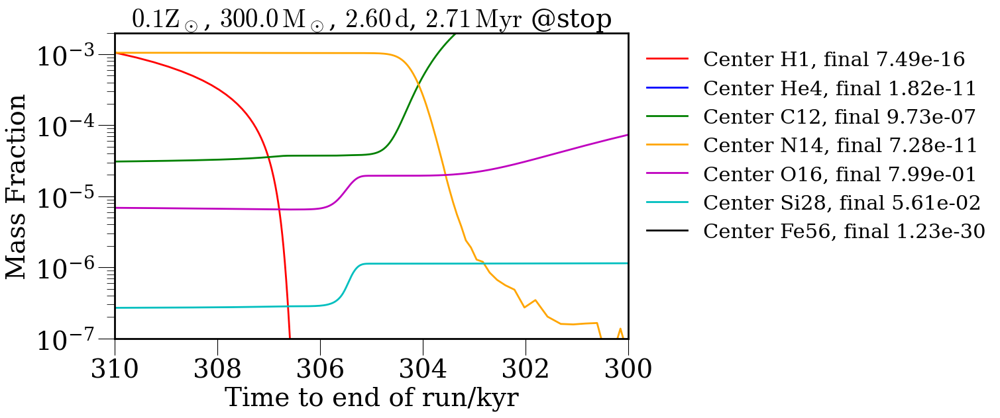

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
h = pop3_h
x = (h.star_age[-1] - h.star_age)/1e3
ax.plot(x, h.center_h1, label=f'Center H1, final {h.center_h1[-1]:.2e}', c='r')
ax.plot(x, h.center_he4, label=f'Center He4, final {h.center_he4[-1]:.2e}', c='b')
ax.plot(x, h.center_c12, label=f'Center C12, final {h.center_c12[-1]:.2e}', c='g')
ax.plot(x, h.center_n14, label=f'Center N14, final {h.center_n14[-1]:.2e}', c='orange')
ax.plot(x, h.center_o16, label=f'Center O16, final {h.center_o16[-1]:.2e}', c='m')
ax.plot(x, h.center_si28, label=f'Center Si28, final {h.center_si28[-1]:.2e}', c='c')
ax.plot(x, h.center_fe56, label=f'Center Fe56, final {h.center_fe56[-1]:.2e}', c='k')
ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.set_xlabel('Time to end of run/kyr')
ax.set_ylabel('Mass Fraction')
ax.set_yscale('log')
ax.invert_xaxis()
ax.set_xlim(310, 300)
ax.set_ylim(1e-7, 2e-3)
ax.set_title(f'${test_z}\\mathrm{{Z}}_\\odot$, ${test_m}\\,\\mathrm{{M}}_\\odot$, ${test_p}\,\\mathrm{{d}}$, ${h.star_age[-1]/1e6:.2f}\\,\\mathrm{{Myr}}$ @stop')

In [ ]:
test_z = '0.1'
test_m = '300.0'
test_p = '2.60'

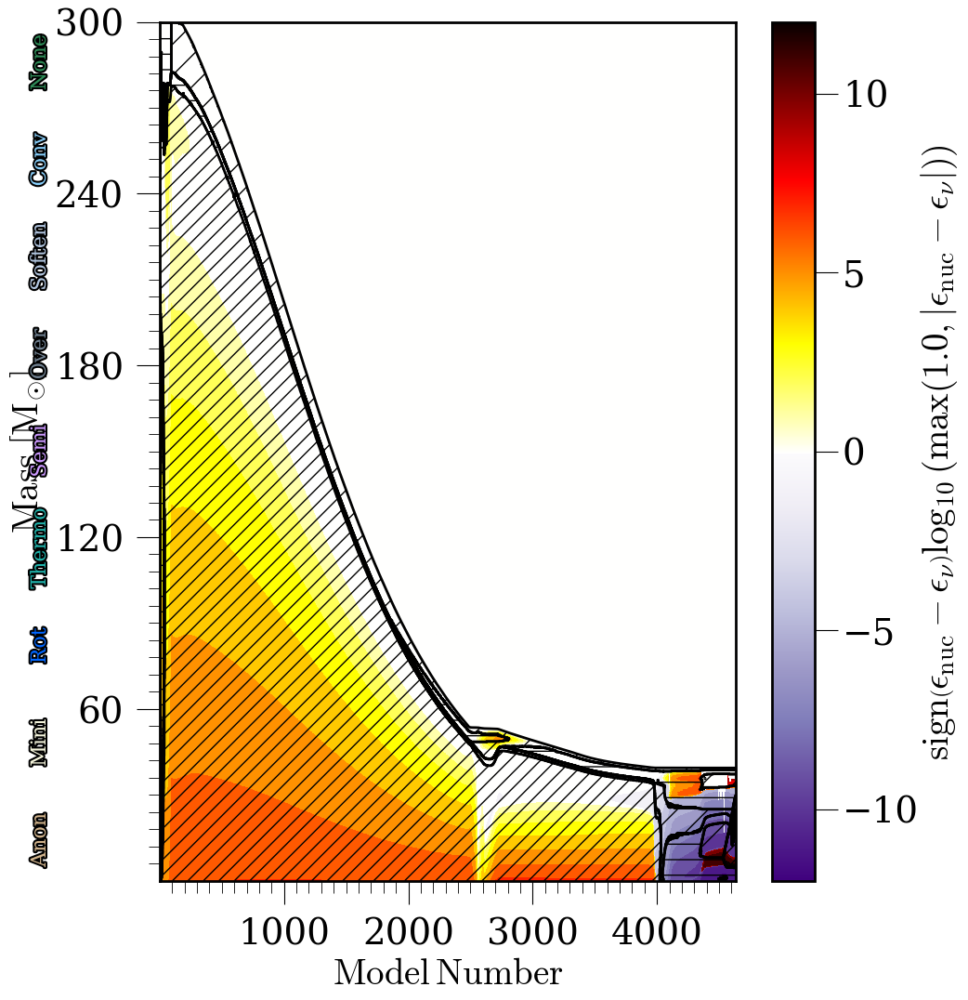

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
#ax.set_ylim(1e-1, 60)

model_dicts = all_model_dicts[test_z]
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[test_m][test_p]/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax)


In [ ]:
pop3_h = mr.MesaData(str(model_dicts[test_m][test_p]/'LOGS/history.data'))

Text(0.5, 1.0, '$0.1\\mathrm{Z}_\\odot$, $300.0\\,\\mathrm{M}_\\odot$, $2.60\\,\\mathrm{d}$, $2.71\\,\\mathrm{Myr}$ @stop')

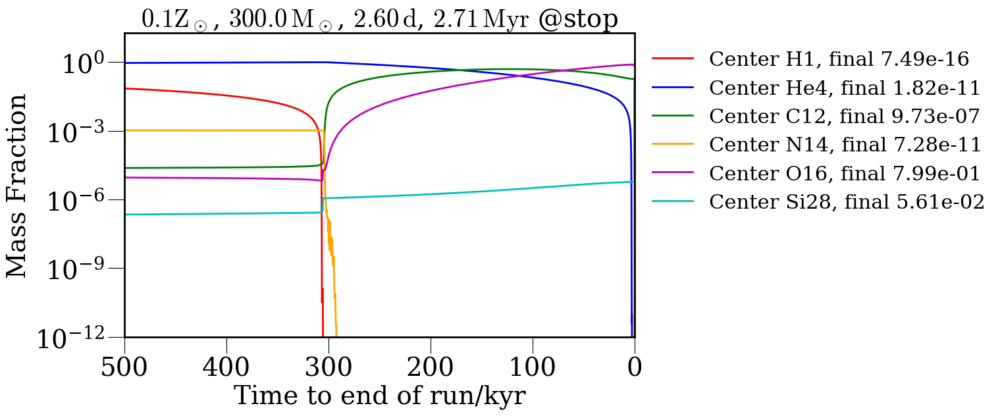

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
h = pop3_h
x = (h.star_age[-1] - h.star_age)/1e3
ax.plot(x, h.center_h1, label=f'Center H1, final {h.center_h1[-1]:.2e}', c='r')
ax.plot(x, h.center_he4, label=f'Center He4, final {h.center_he4[-1]:.2e}', c='b')
ax.plot(x, h.center_c12, label=f'Center C12, final {h.center_c12[-1]:.2e}', c='g')
ax.plot(x, h.center_n14, label=f'Center N14, final {h.center_n14[-1]:.2e}', c='orange')
ax.plot(x, h.center_o16, label=f'Center O16, final {h.center_o16[-1]:.2e}', c='m')
ax.plot(x, h.center_si28, label=f'Center Si28, final {h.center_si28[-1]:.2e}', c='c')
ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.set_xlabel('Time to end of run/kyr')
ax.set_ylabel('Mass Fraction')
ax.set_yscale('log')
ax.invert_xaxis()
ax.set_xlim(500, -0.01)
ax.set_ylim(1e-12)
ax.set_title(f'${test_z}\\mathrm{{Z}}_\\odot$, ${test_m}\\,\\mathrm{{M}}_\\odot$, ${test_p}\,\\mathrm{{d}}$, ${h.star_age[-1]/1e6:.2f}\\,\\mathrm{{Myr}}$ @stop')

In [ ]:
test_z = '0.0005'
test_m = '300.0'
test_p = '2.60'

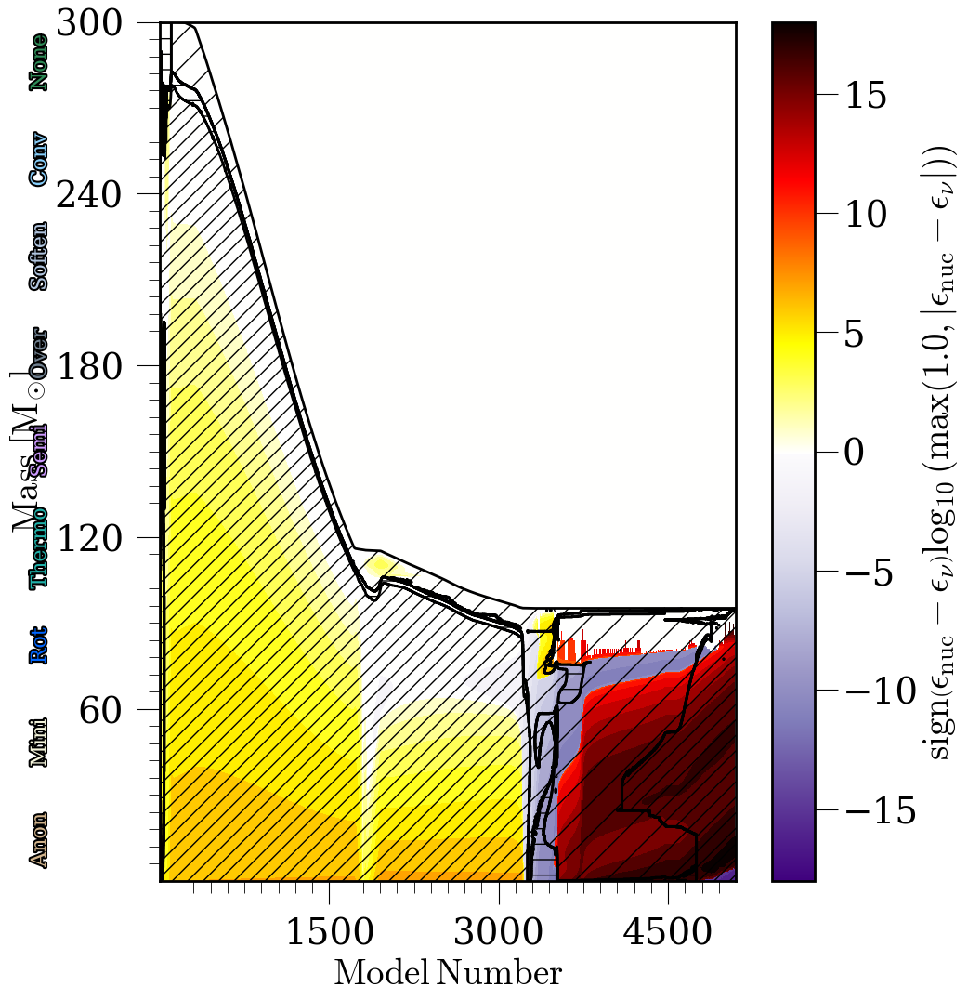

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
#ax.set_ylim(1e-1, 60)

model_dicts = all_model_dicts[test_z]
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[test_m][test_p]/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax)


In [ ]:
pop3_h = mr.MesaData(str(model_dicts[test_m][test_p]/'LOGS/history.data'))

Text(0.5, 1.0, '$0.0005\\mathrm{Z}_\\odot$ $300.0\\,\\mathrm{M}_\\odot$ $2.60\\,\\mathrm{d}$')

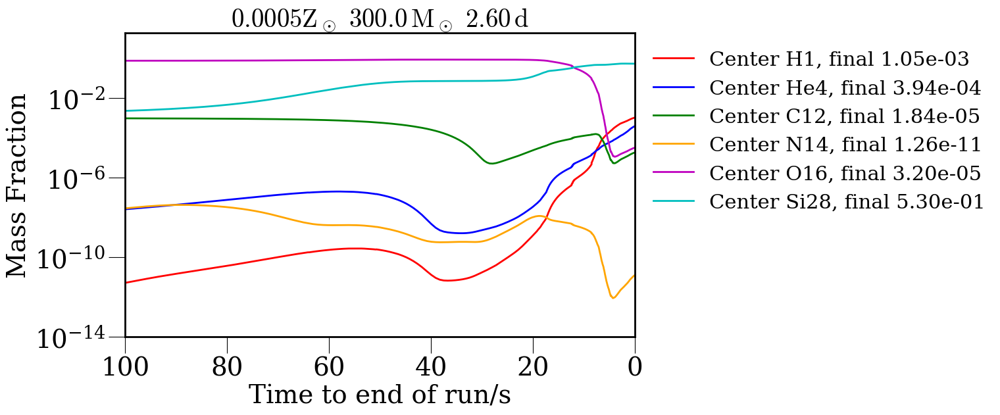

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
h = pop3_h
x = (h.star_age[-1] - h.star_age)*u.yr.to(u.s)
ax.plot(x, h.center_h1, label=f'Center H1, final {h.center_h1[-1]:.2e}', c='r')
ax.plot(x, h.center_he4, label=f'Center He4, final {h.center_he4[-1]:.2e}', c='b')
ax.plot(x, h.center_c12, label=f'Center C12, final {h.center_c12[-1]:.2e}', c='g')
ax.plot(x, h.center_n14, label=f'Center N14, final {h.center_n14[-1]:.2e}', c='orange')
ax.plot(x, h.center_o16, label=f'Center O16, final {h.center_o16[-1]:.2e}', c='m')
ax.plot(x, h.center_si28, label=f'Center Si28, final {h.center_si28[-1]:.2e}', c='c')
ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.set_xlabel('Time to end of run/s')
ax.set_ylabel('Mass Fraction')
ax.set_yscale('log')
#ax.invert_xaxis()
ax.set_xlim(100, -0.001)
ax.set_ylim(1e-14)
ax.set_title(f'${test_z}\\mathrm{{Z}}_\\odot$ ${test_m}\\,\\mathrm{{M}}_\\odot$ ${test_p}\,\\mathrm{{d}}$')

Text(0.5, 1.0, '$0.0005\\mathrm{Z}_\\odot$ $300.0\\,\\mathrm{M}_\\odot$ $2.60\\,\\mathrm{d}$')

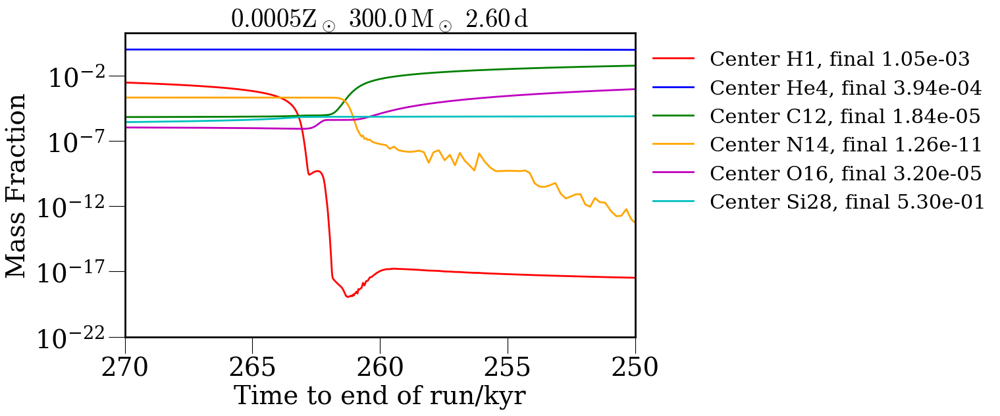

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
h = pop3_h
x = (h.star_age[-1] - h.star_age)/1e3
ax.plot(x, h.center_h1, label=f'Center H1, final {h.center_h1[-1]:.2e}', c='r')
ax.plot(x, h.center_he4, label=f'Center He4, final {h.center_he4[-1]:.2e}', c='b')
ax.plot(x, h.center_c12, label=f'Center C12, final {h.center_c12[-1]:.2e}', c='g')
ax.plot(x, h.center_n14, label=f'Center N14, final {h.center_n14[-1]:.2e}', c='orange')
ax.plot(x, h.center_o16, label=f'Center O16, final {h.center_o16[-1]:.2e}', c='m')
ax.plot(x, h.center_si28, label=f'Center Si28, final {h.center_si28[-1]:.2e}', c='c')
ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.set_xlabel('Time to end of run/kyr')
ax.set_ylabel('Mass Fraction')
ax.set_yscale('log')
#ax.invert_xaxis()
ax.set_xlim(270, 250)
ax.set_ylim(1e-22)
ax.set_title(f'${test_z}\\mathrm{{Z}}_\\odot$ ${test_m}\\,\\mathrm{{M}}_\\odot$ ${test_p}\,\\mathrm{{d}}$')

Text(0.5, 1.0, '$0.0005\\mathrm{Z}_\\odot$ $300.0\\,\\mathrm{M}_\\odot$ $2.60\\,\\mathrm{d}$')

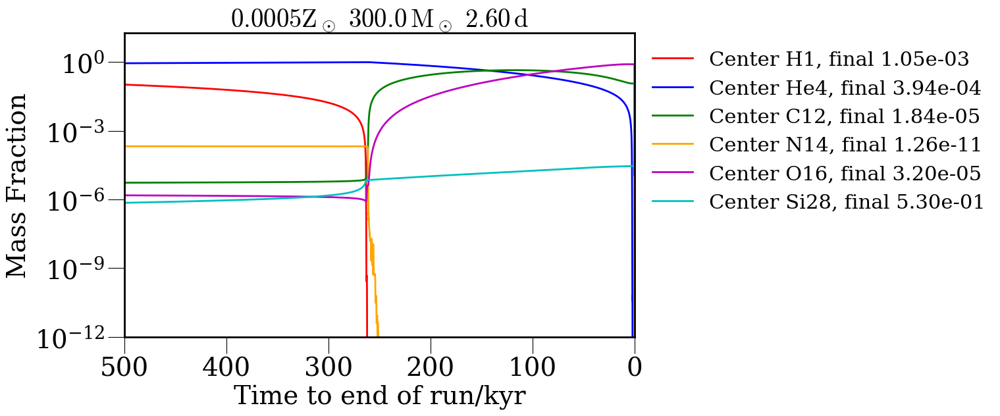

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
h = pop3_h
x = (h.star_age[-1] - h.star_age)/1e3
ax.plot(x, h.center_h1, label=f'Center H1, final {h.center_h1[-1]:.2e}', c='r')
ax.plot(x, h.center_he4, label=f'Center He4, final {h.center_he4[-1]:.2e}', c='b')
ax.plot(x, h.center_c12, label=f'Center C12, final {h.center_c12[-1]:.2e}', c='g')
ax.plot(x, h.center_n14, label=f'Center N14, final {h.center_n14[-1]:.2e}', c='orange')
ax.plot(x, h.center_o16, label=f'Center O16, final {h.center_o16[-1]:.2e}', c='m')
ax.plot(x, h.center_si28, label=f'Center Si28, final {h.center_si28[-1]:.2e}', c='c')
ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.set_xlabel('Time to end of run/kyr')
ax.set_ylabel('Mass Fraction')
ax.set_yscale('log')
ax.invert_xaxis()
ax.set_xlim(500, -0.01)
ax.set_ylim(1e-12)
ax.set_title(f'${test_z}\\mathrm{{Z}}_\\odot$ ${test_m}\\,\\mathrm{{M}}_\\odot$ ${test_p}\,\\mathrm{{d}}$')

# Kippenhahn diagrams

KeyError: -1

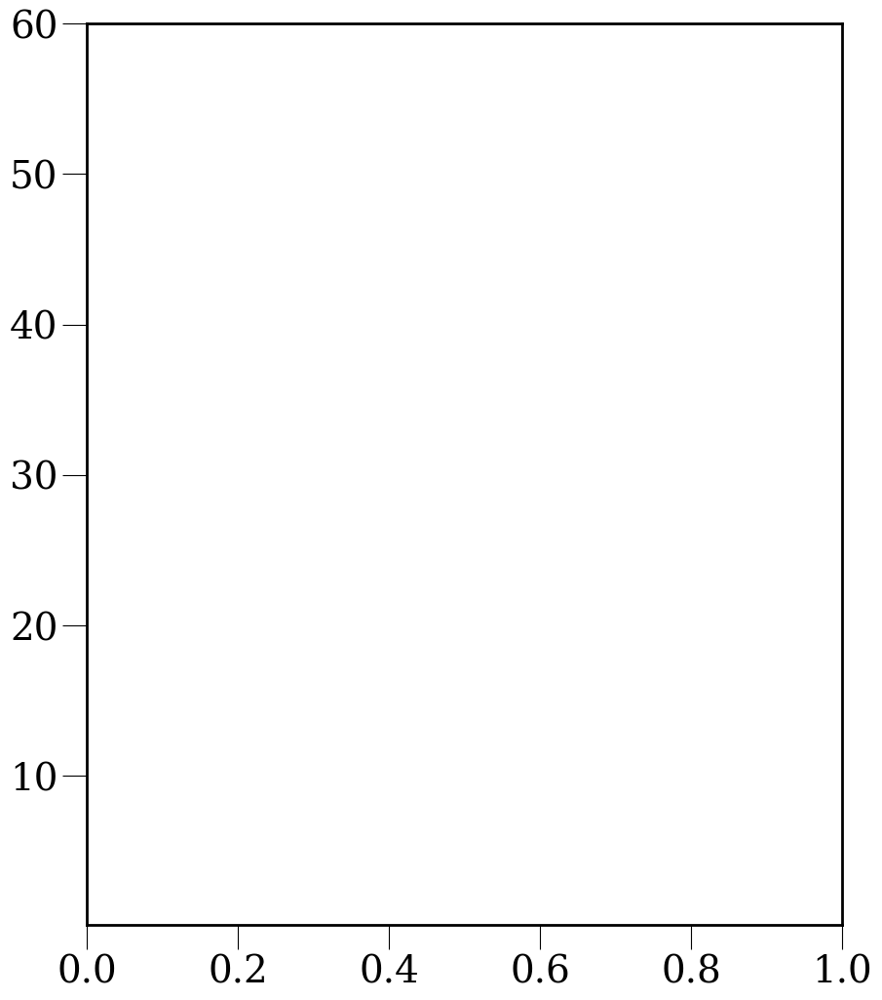

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
ax.set_ylim(1e-1, 60)

model_dicts = model_dicts_06zsun
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[-1]['300.0']['3.00']/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=False, y1log=False, ax=ax)


In [ ]:
45/60

0.75

2385.0


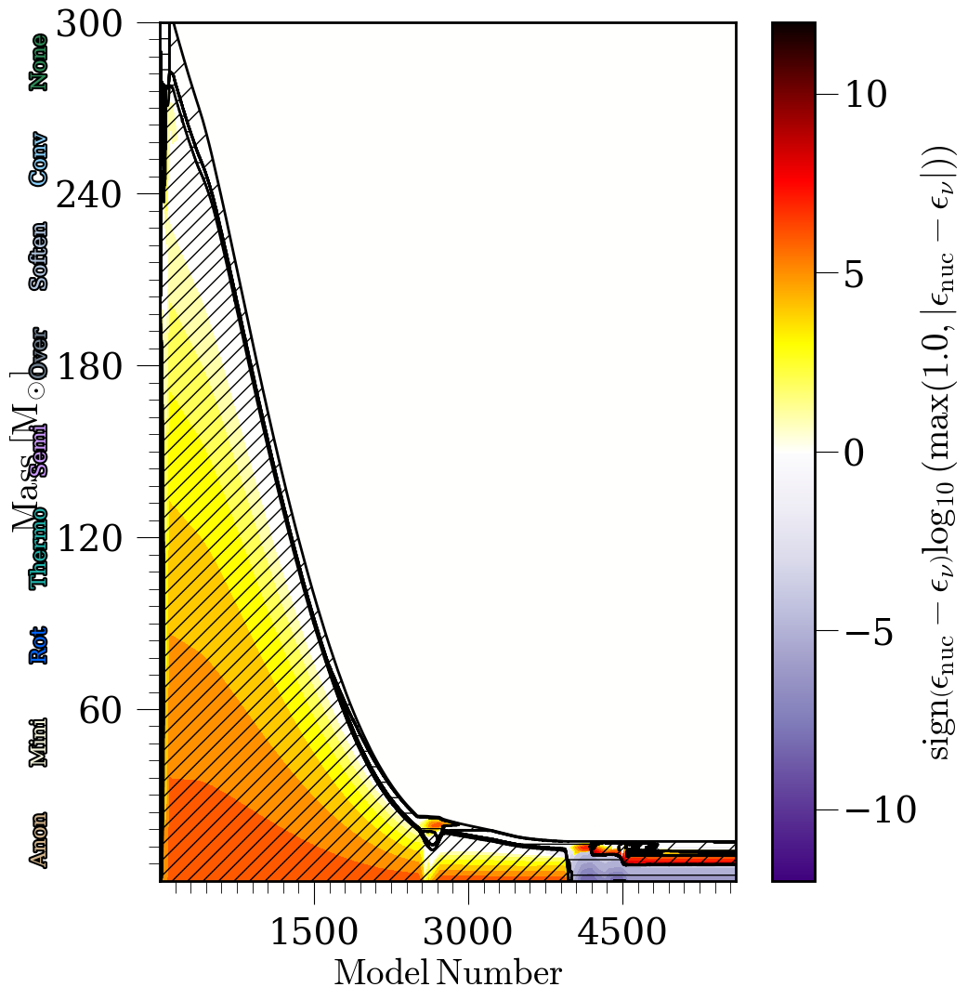

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
ax.set_ylim(1e-1, 300)

model_dicts = model_dicts_06zsun
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[-1]['300.0']['3.00']/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax)


In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
ax.set_ylim(1e-1, 60)

model_dicts = model_dicts_06zsun
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[-1]['300.0']['3.00']/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax)


NameError: name 'plt' is not defined

2352.0


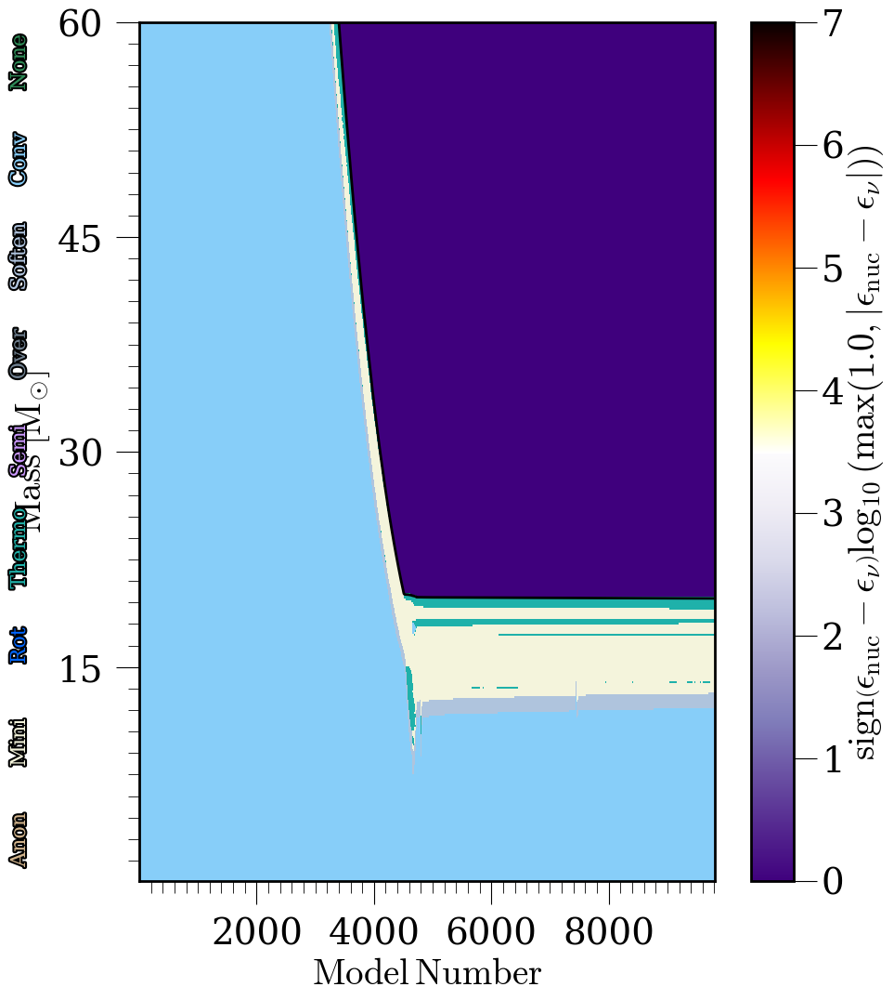

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
ax.set_ylim(1e-1, 60)

model_dicts = model_dicts_08zsun
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[-1]['300.0']['3.00']/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=False, y1log=False, ax=ax)


2352.0


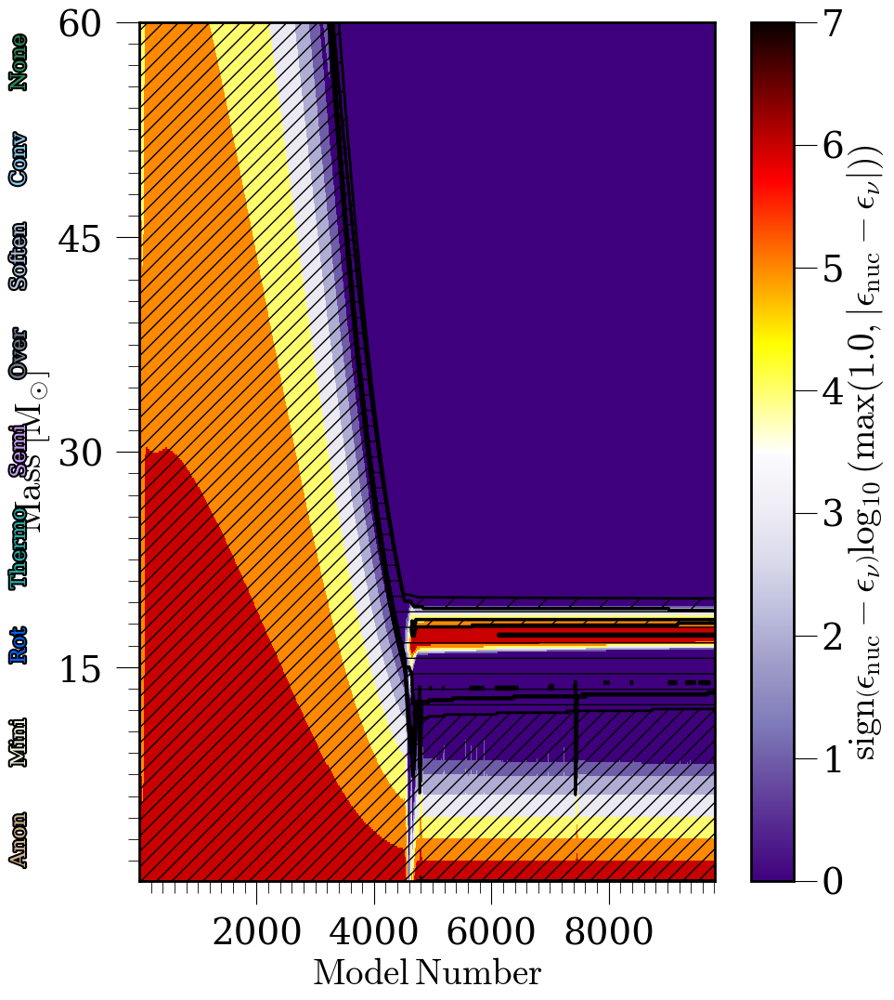

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
ax.set_ylim(1e-1, 60)

model_dicts = model_dicts_08zsun
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[-1]['300.0']['3.00']/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax)


In [ ]:
model_dicts_08zsun

array([{'20.0': {'2.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.600d+00_w2.797d-05'), '4.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d+00_w1.818d-05'), '0.40': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d-01_w1.818d-04'), '2.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.000d+00_w3.636d-05'), '0.70': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p7.000d-01_w1.039d-04'), '1.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/001_md1_m20_z

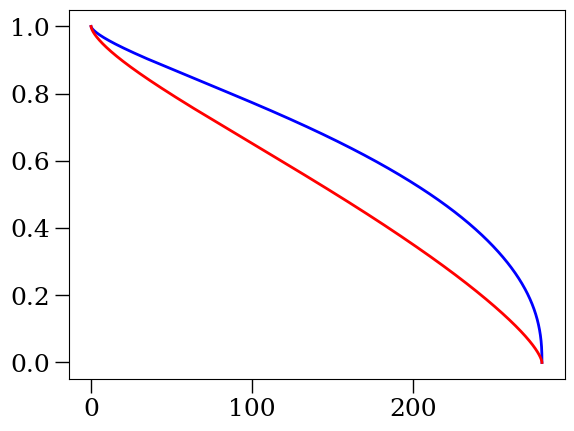

In [ ]:
plt.plot(prof.mass, (np.sin(np.pi*prof.radius/prof.radius[0])/(np.pi*prof.radius/prof.radius[0]))**3, c='b')
plt.plot(prof.mass, (np.sin(np.pi*prof.radius/prof.radius[0])/(np.pi*prof.radius/prof.radius[0]))**5, c='r')

In [ ]:
test_case = model_dicts_08zsun[0]['20.0']['1.00']
h = mr.MesaData(str(test_case/'LOGS/history.data'))
logs  = mr.MesaLogDir(str(test_case/'LOGS'))
profile_numbers = logs.profile_numbers

Text(0, 0.5, '$R/\\mathrm{R}_\\odot$')

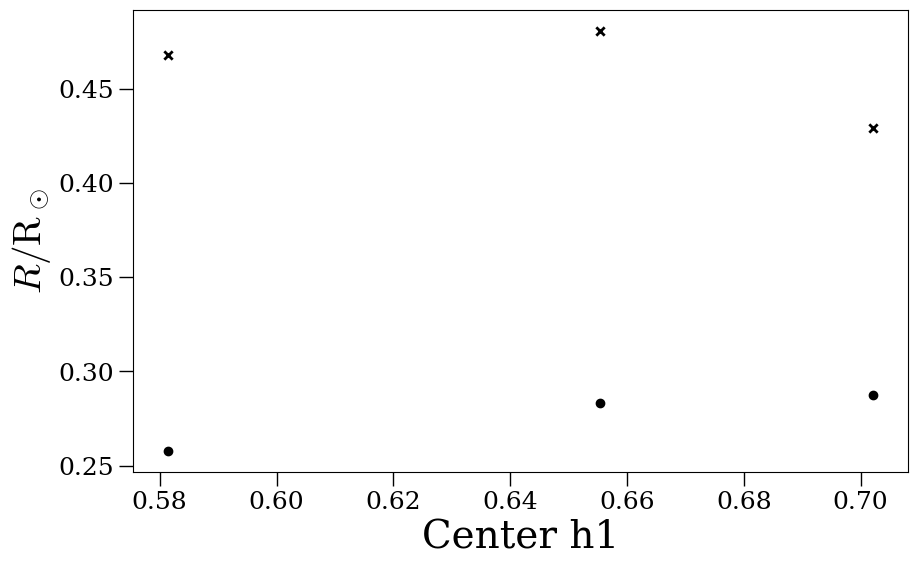

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

for n in profile_numbers:
    prof = logs.profile_data(profile_number=n)
    convprof = prof.mixing_type[::-1]
    convprof = convprof[convprof == 1]
    convrad = prof.radius[::-1][len(convprof)]
    convmass = prof.mass[::-1][len(convprof)]
    rad = prof.radius[0]
    mass = prof.mass[0]
    ax.scatter(prof.center_h1, convrad/rad, 'k', marker='o')
    ax.scatter(prof.center_h1, convmass/mass, 'k', marker='x')
ax.set_xlabel('Center h1')
ax.set_ylabel('$R/\\mathrm{R}_\\odot$')
#ax.set_ylim(15, 20)
#ax.set_xlim(0, 50)
    

Text(0, 0.5, '$\\log \\rho/(\\mathrm{g}\\,\\mathrm{cm}^{-3})$')

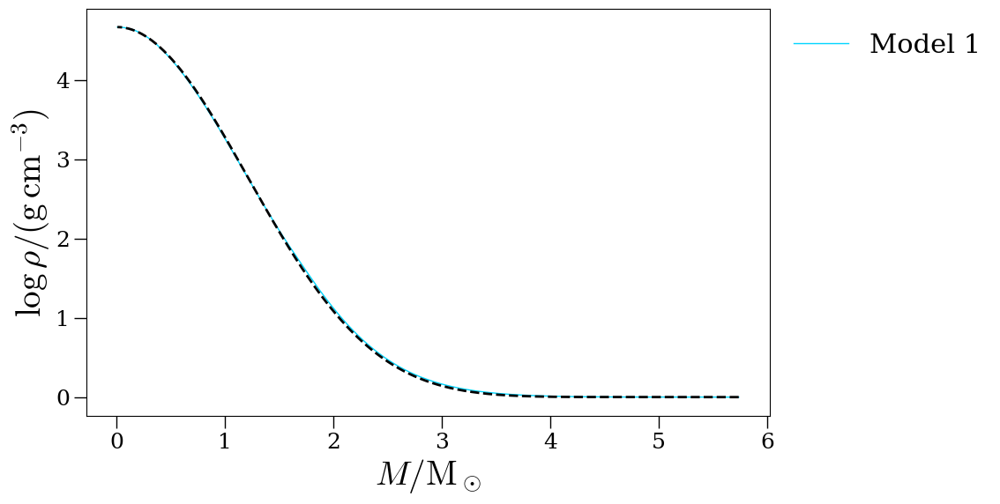

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

for n in profile_numbers[:1:]:
    c = cm.jet(n/len(profile_numbers))
    prof = logs.profile_data(profile_number=n)
    ax.plot(prof.radius, 10.**prof.logRho, c=c, label=f'Model {prof.model_number}', lw=1)
    ax.plot(prof.radius, 10.**prof.logRho[-1]*(np.sin(np.pi*prof.radius/prof.radius[0])/(np.pi*prof.radius/prof.radius[0]))**7, 'k--')
ax.legend(loc='upper left', bbox_to_anchor=(1,1), frameon=False, ncol=3)
ax.set_xlabel('$M/\\mathrm{M}_\\odot$')
ax.set_ylabel('$\\log \\rho/(\\mathrm{g}\\,\\mathrm{cm}^{-3})$')
#ax.set_ylim(15, 20)
#ax.set_xlim(0, 50)
    

Text(0, 0.5, '$\\log \\rho/(\\mathrm{g}\\,\\mathrm{cm}^{-3})$')

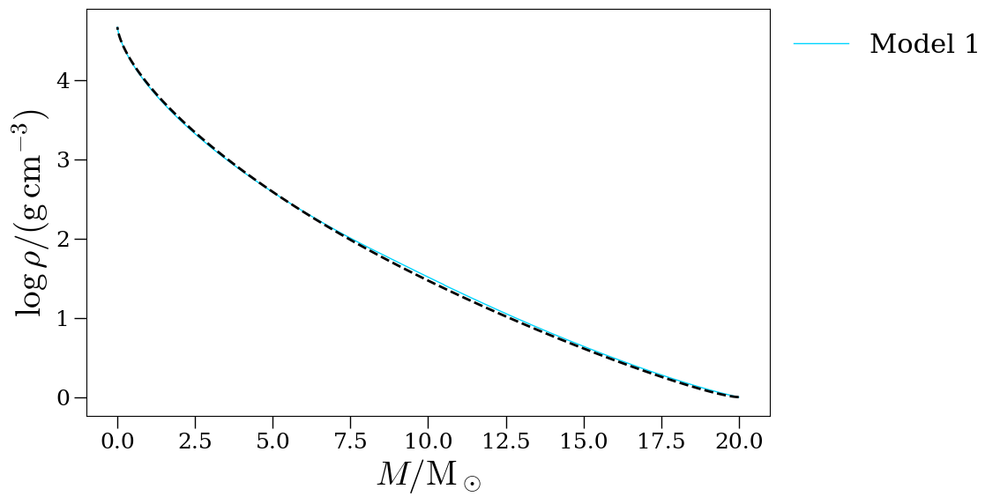

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

for n in profile_numbers[:1:]:
    c = cm.jet(n/len(profile_numbers))
    prof = logs.profile_data(profile_number=n)
    ax.plot(prof.mass, 10.**prof.logRho, c=c, label=f'Model {prof.model_number}', lw=1)
    ax.plot(prof.mass, 10.**prof.logRho[-1]*(np.sin(np.pi*prof.radius/prof.radius[0])/(np.pi*prof.radius/prof.radius[0]))**7, 'k--')
ax.legend(loc='upper left', bbox_to_anchor=(1,1), frameon=False, ncol=3)
ax.set_xlabel('$M/\\mathrm{M}_\\odot$')
ax.set_ylabel('$\\log \\rho/(\\mathrm{g}\\,\\mathrm{cm}^{-3})$')
#ax.set_ylim(15, 20)
#ax.set_xlim(0, 50)
    

In [ ]:
test_case = model_dicts_08zsun[-1]['300.0']['3.00']
h = mr.MesaData(str(test_case/'LOGS/history.data'))
logs  = mr.MesaLogDir(str(test_case/'LOGS'))
profile_numbers = logs.profile_numbers

Text(0, 0.5, '$R/\\mathrm{R}_\\odot$')

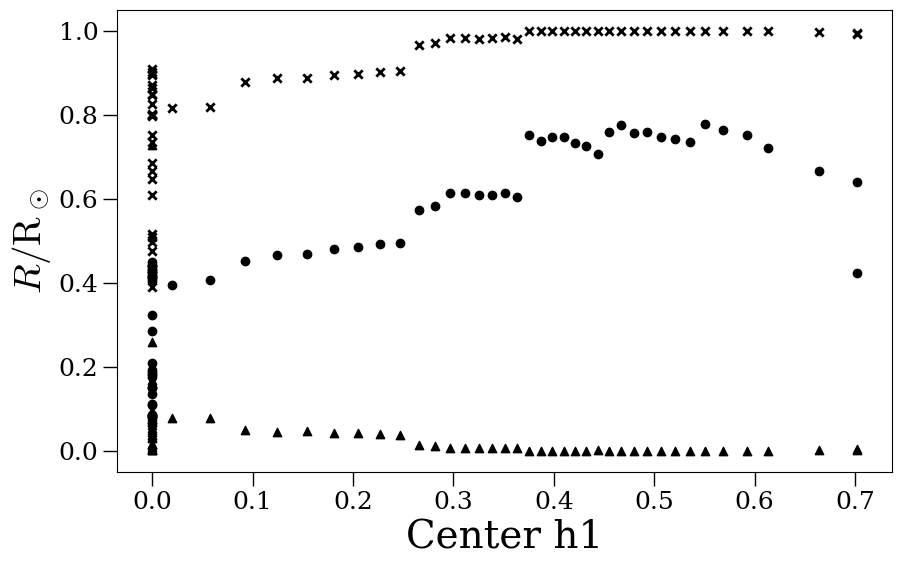

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

for n in profile_numbers:
    prof = logs.profile_data(profile_number=n)
    convprof = prof.mixing_type[::-1]
    convprof = convprof[convprof == 1]
    convrad = prof.radius[::-1][len(convprof)]
    convmass = prof.mass[::-1][len(convprof)]
    convrho = 10.**prof.logRho[::-1][len(convprof)]
    rad = prof.radius[0]
    mass = prof.mass[0]
    rho = 10.**prof.logRho[-1]
    ax.scatter(prof.center_h1, convrad/rad, c='k', marker='o')
    ax.scatter(prof.center_h1, convmass/mass, c='k', marker='x')
    ax.scatter(prof.center_h1, convrho/rho, c='k', marker='^')
ax.set_xlabel('Center h1')
ax.set_ylabel('$R/\\mathrm{R}_\\odot$')
#ax.set_ylim(15, 20)
#ax.set_xlim(0, 50)
    

Text(0, 0.5, '$R/\\mathrm{R}_\\odot$')

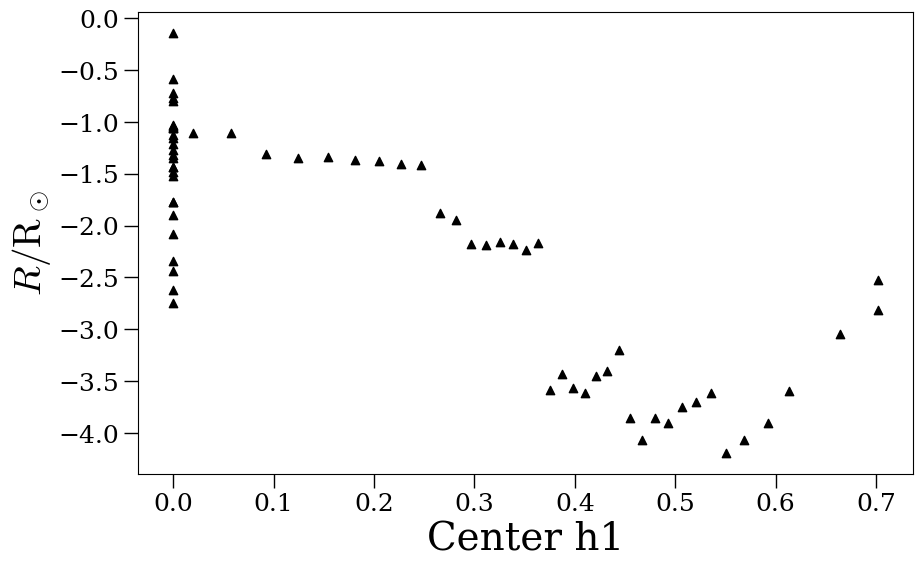

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

for n in profile_numbers:
    prof = logs.profile_data(profile_number=n)
    convprof = prof.mixing_type[::-1]
    convprof = convprof[convprof == 1]
    convrad = prof.radius[::-1][len(convprof)]
    convmass = prof.mass[::-1][len(convprof)]
    convrho = 10.**prof.logRho[::-1][len(convprof)]
    rad = prof.radius[0]
    mass = prof.mass[0]
    rho = 10.**prof.logRho[-1]
    ax.scatter(prof.center_h1, np.log10(convrho/rho), c='k', marker='^')
ax.set_xlabel('Center h1')
ax.set_ylabel('$R/\\mathrm{R}_\\odot$')
#ax.set_ylim(15, 20)
#ax.set_xlim(0, 50)
    

Text(0, 0.5, '$\\log \\rho/(\\mathrm{g}\\,\\mathrm{cm}^{-3})$')

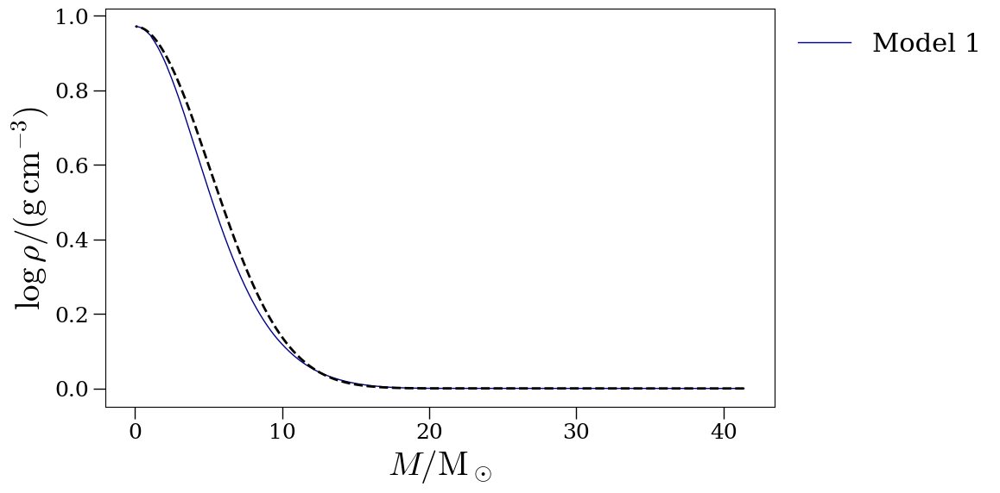

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

for n in profile_numbers[:1:]:
    c = cm.jet(n/len(profile_numbers))
    prof = logs.profile_data(profile_number=n)
    ax.plot(prof.radius, 10.**prof.logRho, c=c, label=f'Model {prof.model_number}', lw=1)
    ax.plot(prof.radius, 10.**prof.logRho[-1]*(np.sin(np.pi*prof.radius/prof.radius[0])/(np.pi*prof.radius/prof.radius[0]))**20, 'k--')
ax.legend(loc='upper left', bbox_to_anchor=(1,1), frameon=False, ncol=3)
ax.set_xlabel('$M/\\mathrm{M}_\\odot$')
ax.set_ylabel('$\\log \\rho/(\\mathrm{g}\\,\\mathrm{cm}^{-3})$')
#ax.set_ylim(15, 20)
#ax.set_xlim(0, 50)
    

Text(0, 0.5, '$\\log \\rho/(\\mathrm{g}\\,\\mathrm{cm}^{-3})$')

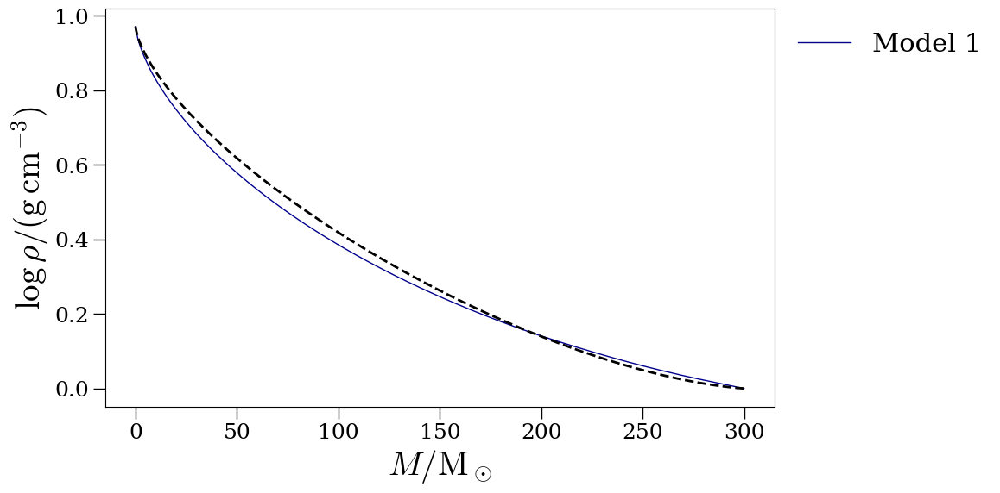

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

for n in profile_numbers[:1:]:
    c = cm.jet(n/len(profile_numbers))
    prof = logs.profile_data(profile_number=n)
    ax.plot(prof.mass, 10.**prof.logRho, c=c, label=f'Model {prof.model_number}', lw=1)
    ax.plot(prof.mass, 10.**prof.logRho[-1]*(np.sin(np.pi*prof.radius/prof.radius[0])/(np.pi*prof.radius/prof.radius[0]))**22, 'k--')
ax.legend(loc='upper left', bbox_to_anchor=(1,1), frameon=False, ncol=3)
ax.set_xlabel('$M/\\mathrm{M}_\\odot$')
ax.set_ylabel('$\\log \\rho/(\\mathrm{g}\\,\\mathrm{cm}^{-3})$')
#ax.set_ylim(15, 20)
#ax.set_xlim(0, 50)
    

In [ ]:
model_dicts_04zsun

array([{'20.0': {'2.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.600d+00_w2.797d-05'), '4.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d+00_w1.818d-05'), '0.40': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d-01_w1.818d-04'), '2.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.000d+00_w3.636d-05'), '0.70': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p7.000d-01_w1.039d-04'), '1.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1/001_md1_m20_z

In [ ]:
test_case = model_dicts_04zsun[6]['80.0']['1.00']
h = mr.MesaData(str(test_case/'LOGS/history.data'))
logs  = mr.MesaLogDir(str(test_case/'LOGS'))
profile_numbers = logs.profile_numbers

Text(0, 0.5, '$R/\\mathrm{R}_\\odot$')

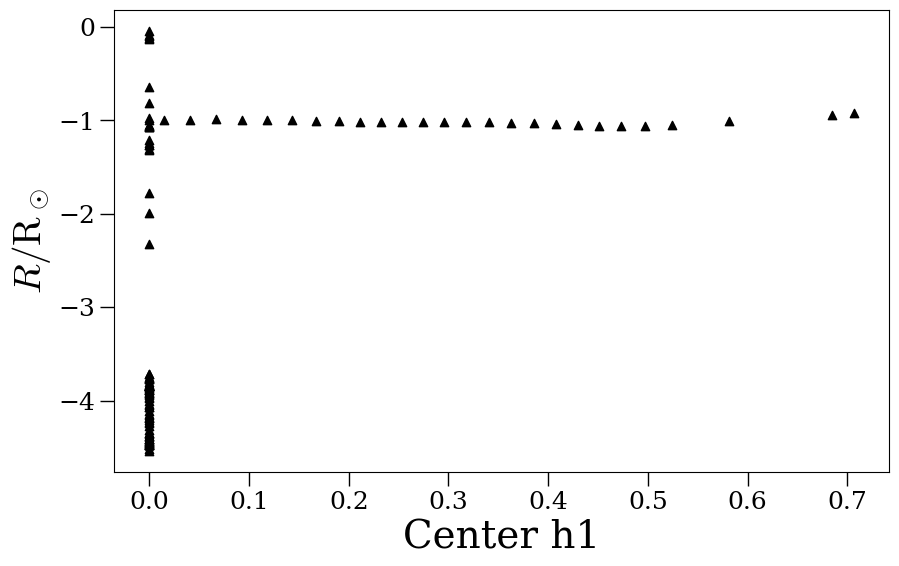

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

for n in profile_numbers:
    prof = logs.profile_data(profile_number=n)
    convprof = prof.mixing_type[::-1]
    convprof = convprof[convprof == 1]
    convrad = prof.radius[::-1][len(convprof)]
    convmass = prof.mass[::-1][len(convprof)]
    convrho = 10.**prof.logRho[::-1][len(convprof)]
    rad = prof.radius[0]
    mass = prof.mass[0]
    rho = 10.**prof.logRho[-1]
    ax.scatter(prof.center_h1, np.log10(convrho/rho), c='k', marker='^')
ax.set_xlabel('Center h1')
ax.set_ylabel('$R/\\mathrm{R}_\\odot$')
#ax.set_ylim(15, 20)
#ax.set_xlim(0, 50)
    

(0.0, 90.0)

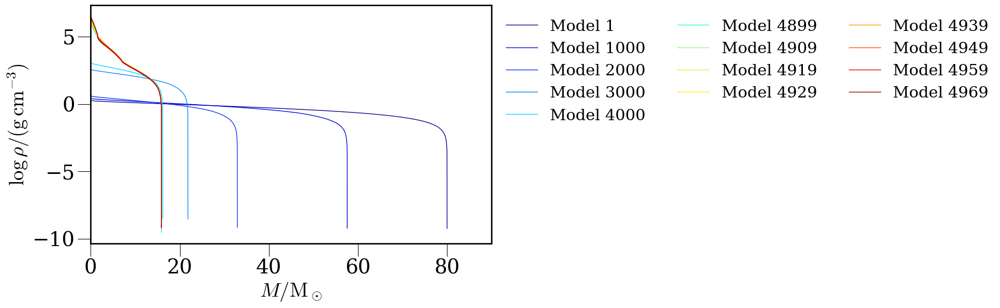

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

for n in profile_numbers[::10]:
    c = cm.jet(n/len(profile_numbers))
    prof = logs.profile_data(profile_number=n)
    ax.plot(prof.mass, prof.logRho, c=c, label=f'Model {prof.model_number}', lw=1)
ax.legend(loc='upper left', bbox_to_anchor=(1,1), frameon=False, ncol=3)
ax.set_xlabel('$M/\\mathrm{M}_\\odot$')
ax.set_ylabel('$\\log \\rho/(\\mathrm{g}\\,\\mathrm{cm}^{-3})$')
#ax.set_ylim(15, 20)
ax.set_xlim(0, 90)
    

2319.0


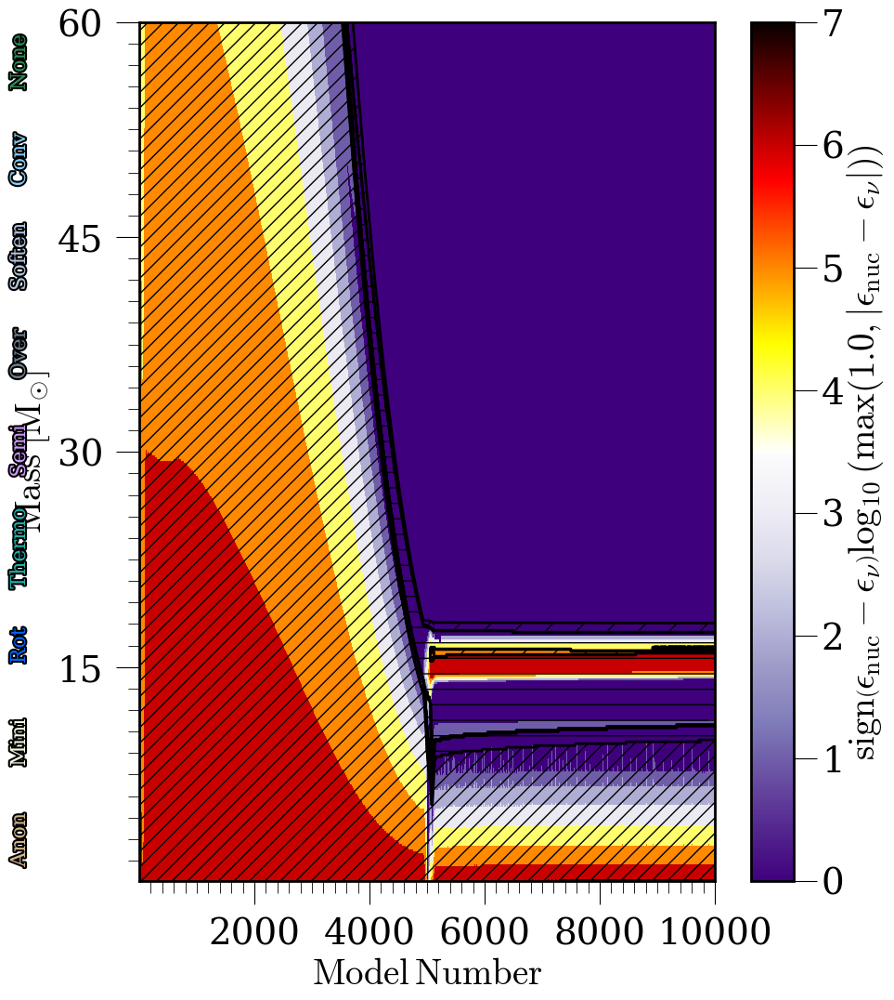

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
ax.set_ylim(1e-1, 60)

model_dicts = model_dicts_10zsun
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[-1]['300.0']['3.00']/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax)


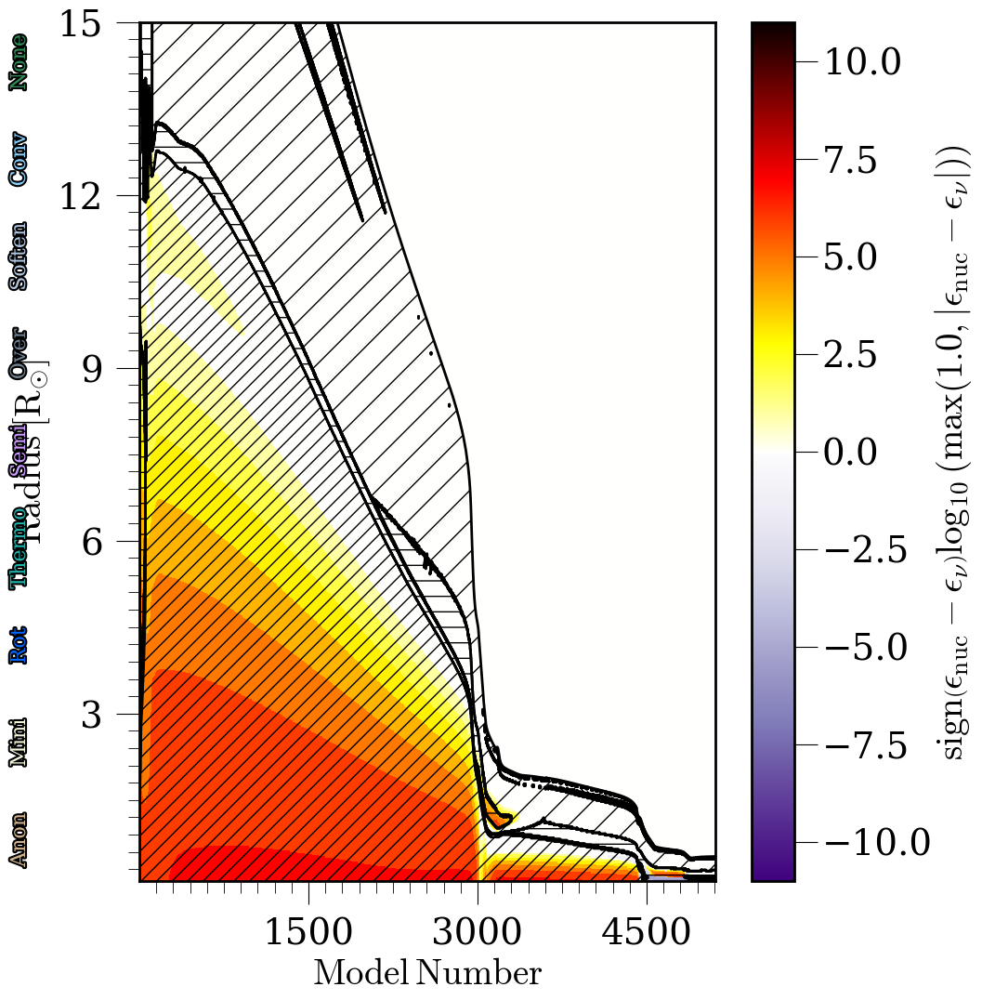

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
ax.set_ylim(1e-1, 15)

model_dicts = model_dicts_02zsun
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[-1]['300.0']['3.00']/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax, yaxis='radius')


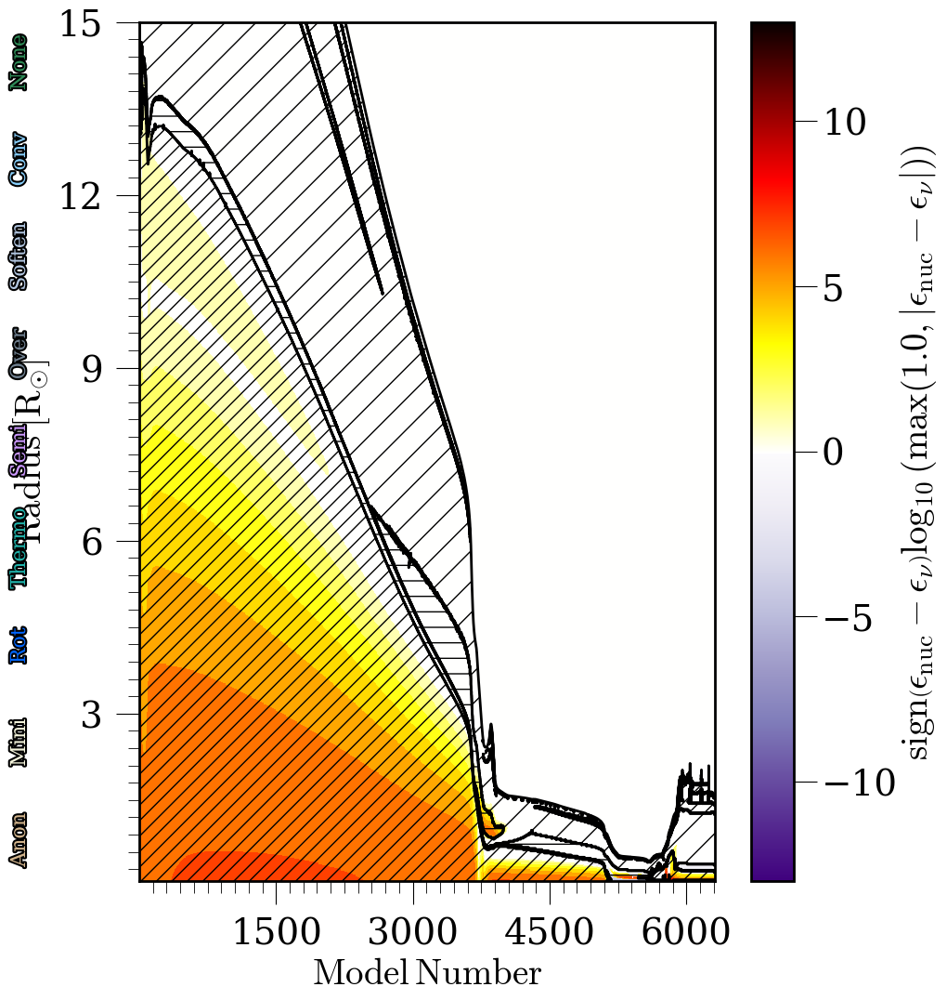

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
ax.set_ylim(1e-1, 15)

model_dicts = model_dicts_04zsun
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[-1]['300.0']['3.00']/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax, yaxis='radius')


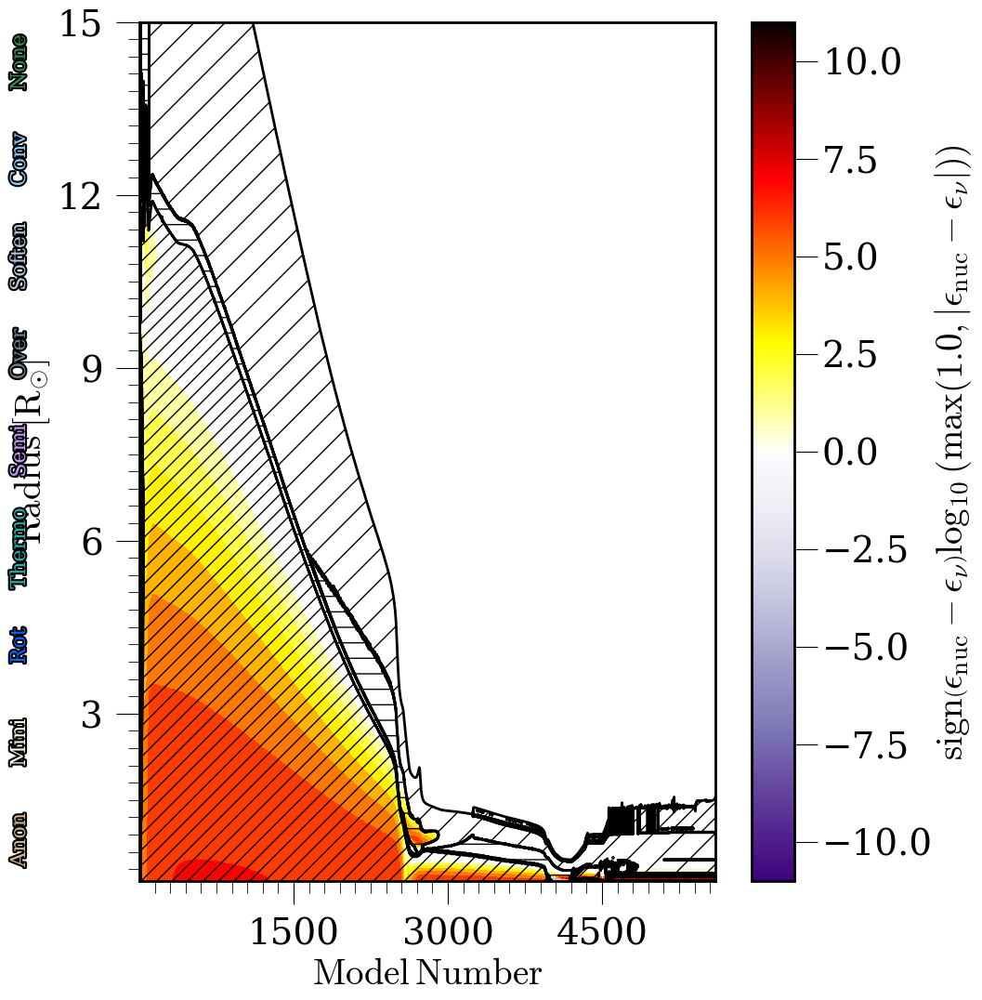

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
ax.set_ylim(1e-1, 15)

model_dicts = model_dicts_06zsun
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[-1]['300.0']['3.00']/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax, yaxis='radius')


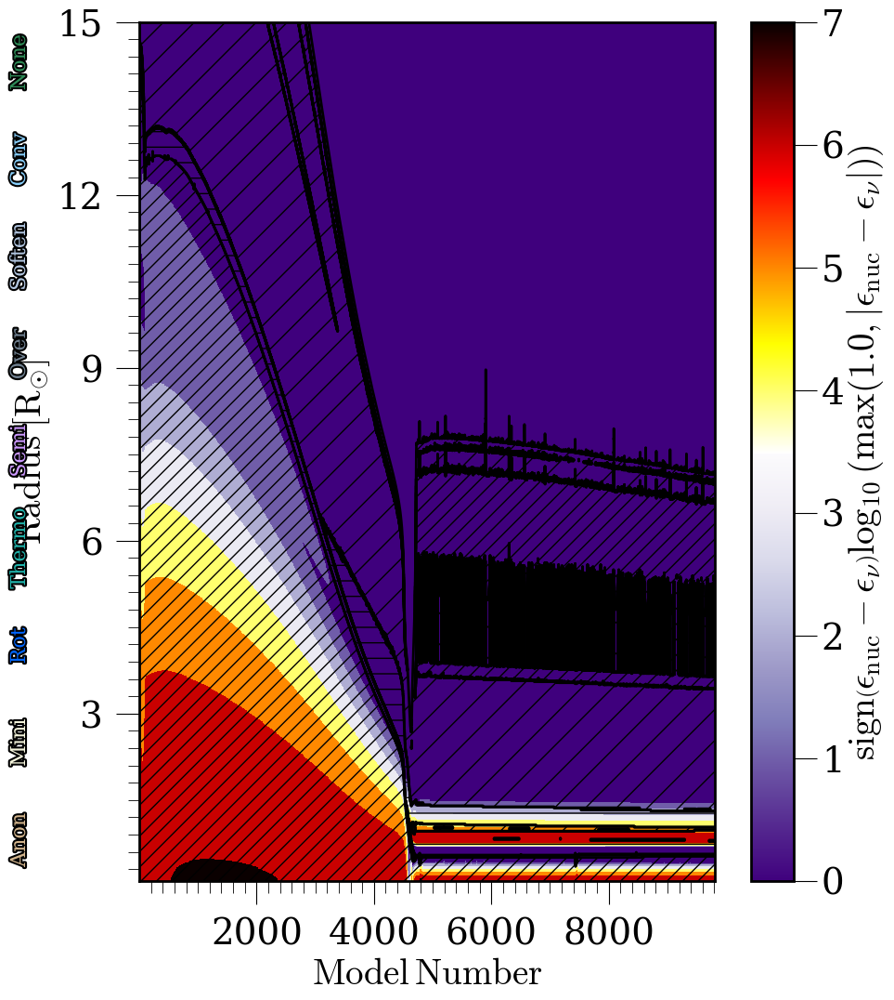

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
ax.set_ylim(1e-1, 15)

model_dicts = model_dicts_08zsun
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[-1]['300.0']['3.00']/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax, yaxis='radius')


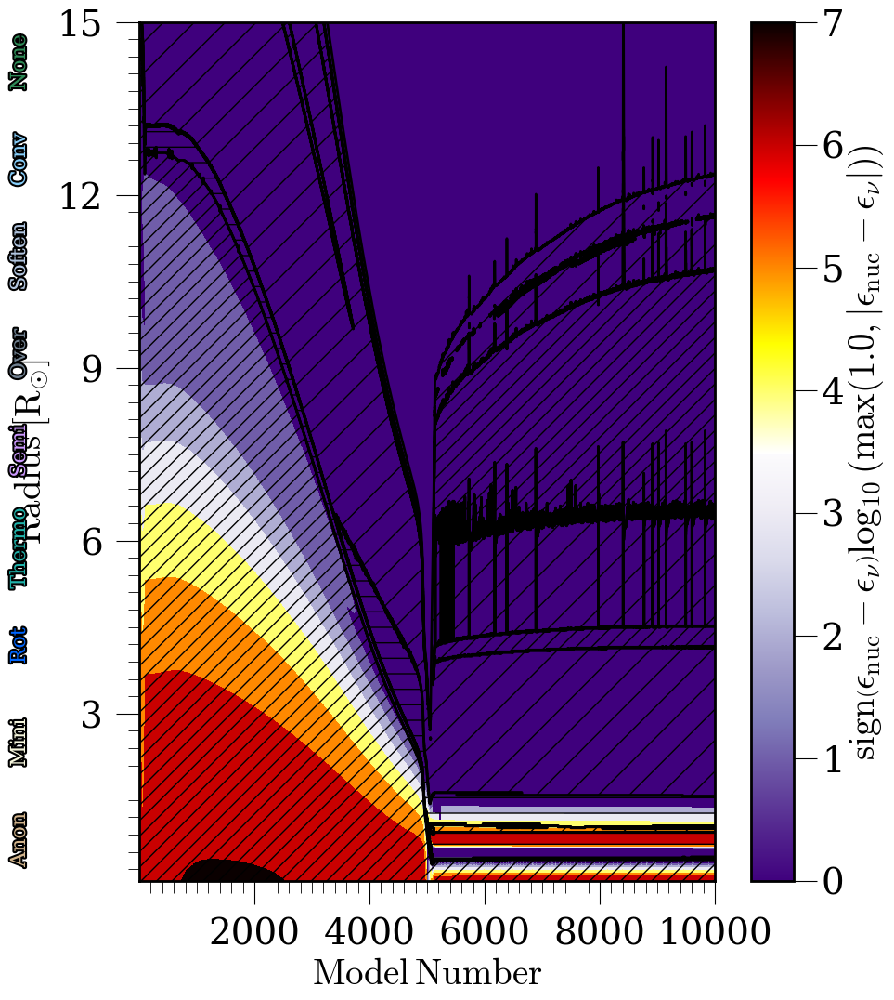

In [ ]:
fig,ax  = plt.subplots(figsize=(10,12))
ax.set_ylim(1e-1, 15)

model_dicts = model_dicts_10zsun
mm = mp.MESA()
mm.loadHistory(f=str(model_dicts[-1]['300.0']['3.00']/'LOGS'))
p = mp.plot()
p.plotKip3(mm, fig=fig, show_mix=True, mix_hatch=True, y1log=False, ax=ax, yaxis='radius')


## Interpolation

In [ ]:
def mzams_p0_mcore_of_plot(ax, of_when, of_kind, min_mcore=20, max_mcore=50):    
    of_when_i = stage_index[of_when]
    handles = []
    for i, m_key in enumerate(mass_guide_str):
        c = cm.jet(i/len(mass_guide_str))
        handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))
        m_zams = float(m_key)
        
        #che_mask = np.array(final_mass_array[:,i,9], bool)
        pp = period_guide_float#[che_mask]
        mm = final_mass_array[:,i,0]#[che_mask]
        rr = final_mass_array[:,i,of_when_i]#[che_mask]
        is_che = np.array(final_mass_array[:,i,9], bool)
        is_crit = np.array(final_mass_array[:,i,8], bool)
        
        for p, r, m_core, ische, iscrit in zip(pp, rr, mm, is_che, is_crit):
            if iscrit:
                marker = 'x'
                color = 'k'
            elif not ische:
                marker = '+'
                color = 'k'
            else:
                marker = 'o'
                color = cm.jet_r((np.log10(m_core)-np.log10(min_mcore))/(np.log10(max_mcore)-np.log10(min_mcore)))
            isof = is_of(r, m_zams, p, 1, kind=of_kind)
            if isof:
                alpha = 0.3
            else:
                alpha = 1.0
            ax.scatter(m_zams, p, marker=marker, color=color, zorder=1, s=30, alpha=alpha)
    return ax, handles

In [ ]:
def p0_mcore_mzams_of_plot(ax, of_when, of_kind):
    of_when_i = stage_index[of_when]
    handles = []
    for i, m_key in enumerate(mass_guide_str):
        c = cm.jet(i/len(mass_guide_str))
        handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))
        m_zams = float(m_key)
        
        che_mask = np.array(final_mass_array[:,i,9], bool)
        pp = period_guide_float[che_mask]
        mm = final_mass_array[:,i,3][che_mask]
        rr = final_mass_array[:,i,of_when_i][che_mask]
            
        for p, r, m_core in zip(pp, rr, mm):
            isof = is_of(r, m_zams, p, 1, kind=of_kind)
            if isof:
                ax.scatter(p, m_core, marker='x', color=c, zorder=1, s=30, alpha=0.3)
                pass
            else:
                ax.scatter(p, m_core, marker='o', color=c, zorder=1, s=30)
    return ax, handles

In [ ]:
def is_of(r, m, p, q=1, kind='RL'):
    a = a_from_p(p, m, q)
    if kind == 'merger':
        of_a = a.to(u.Rsun).value
    elif kind == 'RL':
        of_a = eggleton_rl1_radius(a, q).to(u.Rsun).value
    elif kind == 'L2':
        of_a = marchant_l2_radius(a, q).to(u.Rsun).value
    elif kind == 'none':
        of_a = np.inf
    else:
        raise ValueError(f'kind {kind} not recognized')
    if of_a <= r:
        isof = True
    else:
        isof = False

    return isof

/tmp/ipykernel_74884/3389247599.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))


Text(1, 0.5, 'Before ZAMS')

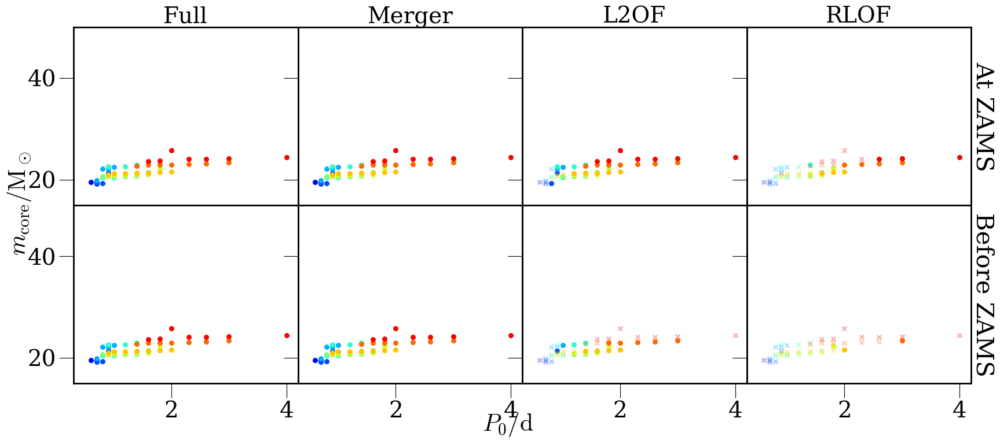

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True)
fig.subplots_adjust(wspace=0, hspace=0)
plot_ps = np.linspace(0, 4, 100)

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)
ax.set_title('Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)
ax.set_title('L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)
ax.set_title('RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)

of_kind = 'RL'
ax = axes[1, 3]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)
           
ax.set_ylim(15, 50)
ax.set_xlim(0.3, 4.2)

fig.text(0.09, 0.5, '$m_\\mathrm{core}/\\mathrm{M}_\\odot$', rotation=90, ha='right', va='center')
fig.text(0.5, 0.05, '$P_0/\\mathrm{d}$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

#ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1, 1), ncol=2, title='$m_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')


#savefig(fig, 'pzams_mcore_data')

/tmp/ipykernel_74884/3389247599.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))


Text(1, 0.5, 'Before ZAMS')

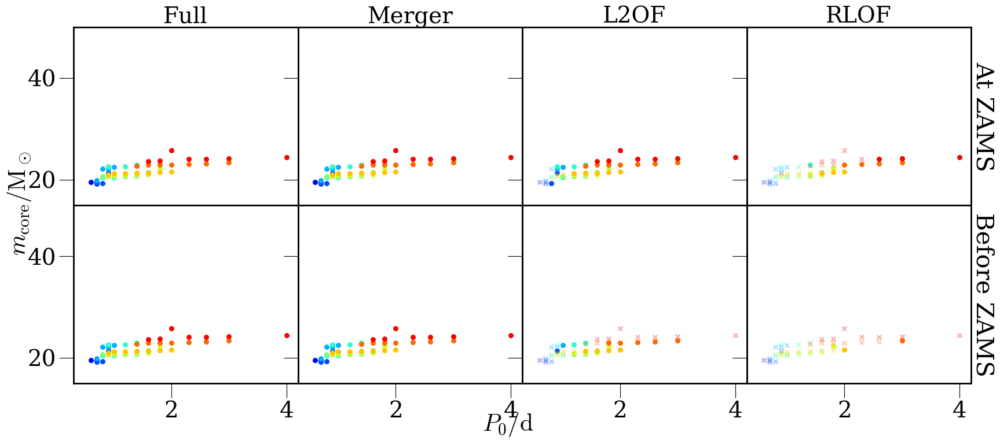

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True)
fig.subplots_adjust(wspace=0, hspace=0)
plot_ps = np.linspace(0, 4, 100)

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)
ax.set_title('Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)
ax.set_title('L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)
ax.set_title('RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)

of_kind = 'RL'
ax = axes[1, 3]
ax, handles = p0_mcore_mzams_of_plot(ax, of_when=of_when, of_kind=of_kind)
           
ax.set_ylim(15, 50)
ax.set_xlim(0.3, 4.2)

fig.text(0.09, 0.5, '$m_\\mathrm{core}/\\mathrm{M}_\\odot$', rotation=90, ha='right', va='center')
fig.text(0.5, 0.05, '$P_0/\\mathrm{d}$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

#ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1, 1), ncol=2, title='$m_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')


#savefig(fig, 'pzams_mcore_data')

/tmp/ipykernel_74884/2509275481.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=0, hspace=0)
/tmp/ipykernel_74884/3646536049.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


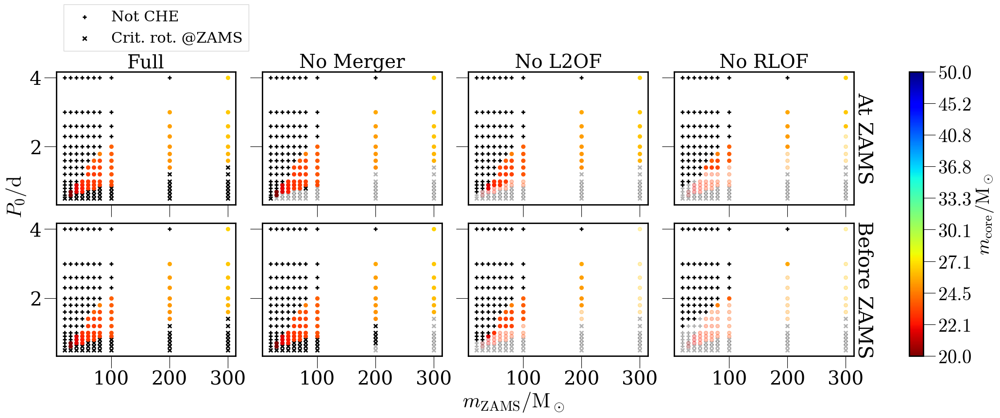

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True, layout='constrained')
fig.subplots_adjust(wspace=0, hspace=0)

plot_ps = np.linspace(0, 4, 100)

min_mcore = 20
max_mcore = 50

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)  

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
             
of_kind = 'RL'
ax = axes[1, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
           
fig.text(0, 0.5, '$P_0/\\mathrm{d}$', rotation=90, ha='right', va='center')
fig.text(0.5, 0, '$m_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

sm = ScalarMappable(Normalize(vmin=np.log10(min_mcore), vmax=np.log10(max_mcore)), cm.jet_r)
cbar = fig.colorbar(sm, ax=axes[:,3], pad=0.2)
cbar.set_label('$m_\\mathrm{core}/\\mathrm{M}_\\odot$')
cbar.set_ticks(np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10))
cbar.set_ticklabels([f'${10**logm:.1f}$' for logm in np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10)])

handles = []
handles.append(ax.scatter([], [], marker='+', color='k', label='Not CHE'))
handles.append(ax.scatter([], [], marker='x', color='k', label='Crit. rot. @ZAMS'))
axes[0,0].legend(handles=handles, fancybox=False, loc='lower left', bbox_to_anchor=(0, 1.1))

savefig(fig, 'che_window')

## Scaled grid plot

In [ ]:
min_mcore = final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)].min()
max_mcore = final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)].max()
mcore_norm = TwoSlopeNorm(vmin=min_mcore, vmax=max_mcore, vcenter=15.)
nonche_c = to_rgba('darkslategrey')
crit_c = to_rgba('slategrey')
cmap = cm.seismic
def mcore_cmap(x): return cmap(mcore_norm(x))

ValueError: vmin, vcenter, and vmax must be in ascending order

In [ ]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
zams_l2of_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = mcore_cmap(mcore_norm(mcore))
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
        else:
            mcore_arr[i_m, i_p, :] = nonche_c

        rzams = final_mass_array[i_p, i_m, 6]
        is_l2of = is_of(r=rzams, m=m1, p=p1, q=1, kind='L2')
        if is_l2of:
            zams_l2of_arr[i_m, i_p, :] = [0, 0, 0, 0]
        else:
            zams_l2of_arr[i_m, i_p, :] = 4*[nan]
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

color_mcore_arr = mcore_arr
color_m_arr = m_arr
color_p_arr = p_arr

In [ ]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_crit_mcore_arr = mcore_arr
hatch_crit_m_arr = m_arr
hatch_crit_p_arr = p_arr

In [ ]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = nonche_c
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_nonche_mcore_arr = mcore_arr
hatch_nonche_m_arr = m_arr
hatch_nonche_p_arr = p_arr

#### Unscaled version

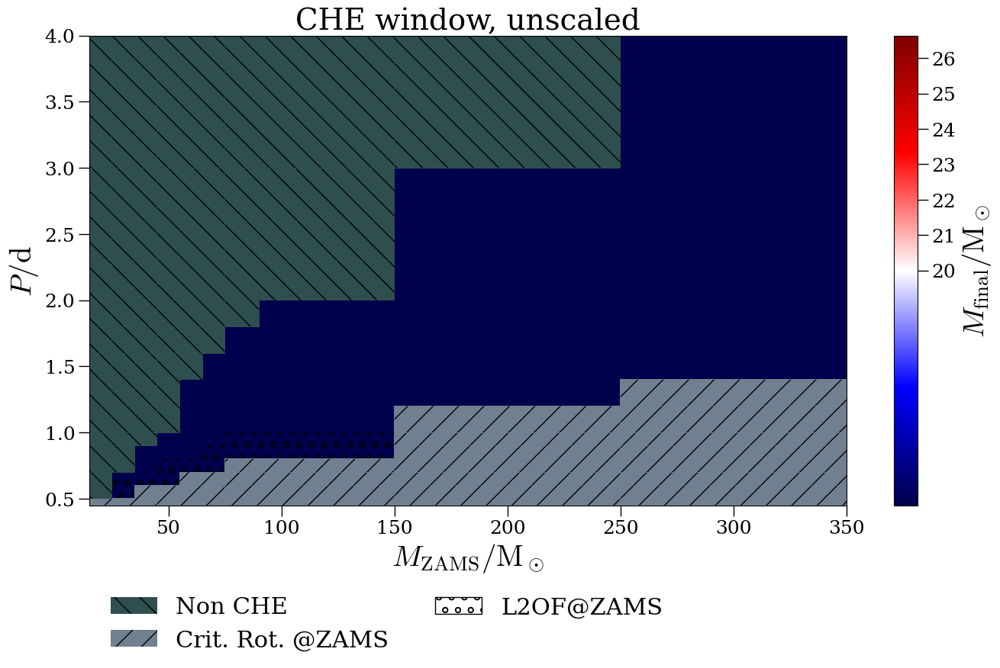

In [ ]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Crit. Rot. @ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_title('CHE window, unscaled')

savefig(fig, 'che_window_unscaled')

#### Scaled version

To get a better grasp on how populated the CHE window, we would like to re-scale the plot axes by appropriate probability distributions. For the mass (x) axis, we use a Salpeter IMF,

In [ ]:
def mass_forward(m):
    return m**-2.35

def mass_inverse(m):
    return m**(-1/2.35)

For the orbital period (y) axis, we assume a log-uniform ditribution,

/tmp/ipykernel_2123654/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_2123654/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


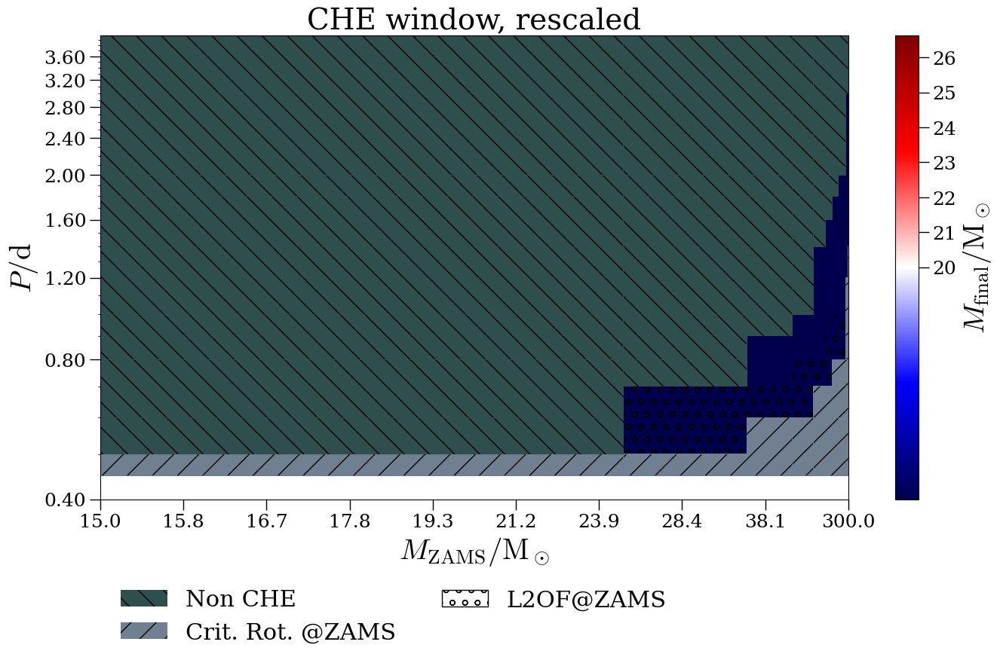

In [ ]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Crit. Rot. @ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(15), mass_forward(300), 10)])

ax.set_xlim(15, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled')

savefig(fig, 'che_window_rescaled')

/tmp/ipykernel_2123654/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_2123654/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


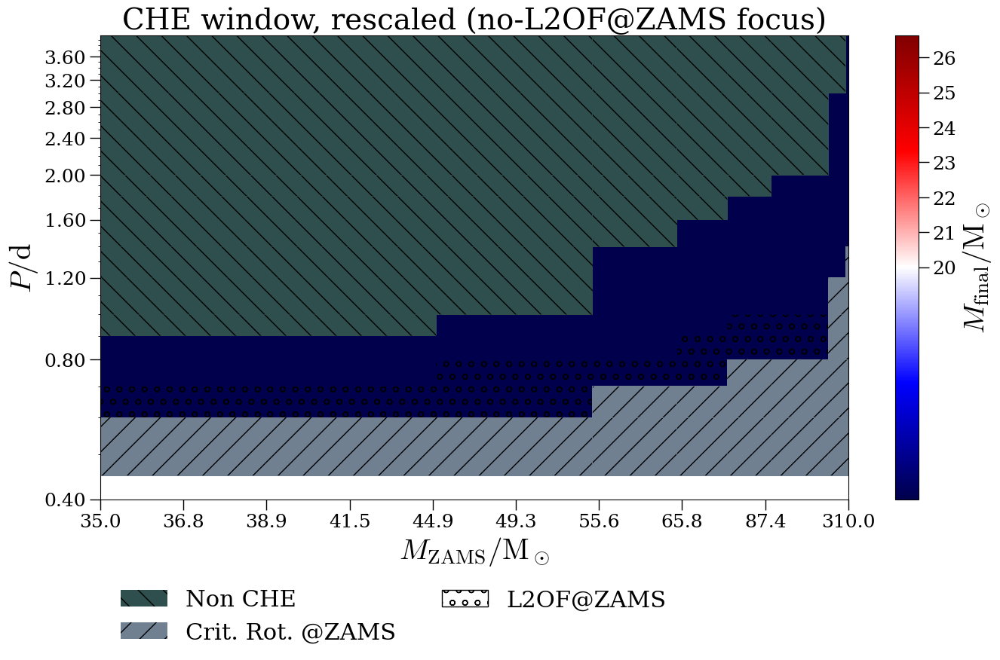

In [ ]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Crit. Rot. @ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(35), mass_forward(310), 10)])

ax.set_xlim(35, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled (no-L2OF@ZAMS focus)')

savefig(fig, 'che_window_rescaled_no_l2of')

The thin strip of $~25

## Interpolators

In [ ]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 0] 
    r_arr = final_mass_array[:, i, 6] 

    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
            
    if m_key in ['50.0']:
        y_arr = y_arr[1:]
        p_arr = p_arr[1:]
        r_arr = r_arr[1:]
        
    if m_key in ['40.0', '220.0']:
        y_arr = y_arr[:-1]
        p_arr = p_arr[:-1]
        r_arr = r_arr[:-1]
        
    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
            
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_mcore_interpolator_dict = interpolator_dict

IndexError: boolean index did not match indexed array along dimension 0; dimension is 15 but corresponding boolean dimension is 35

/tmp/ipykernel_2123654/920947829.py:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(period_guide_float[che_mask], final_mass_array[:,i,0][che_mask], marker='o', c=c, zorder=1, label=m_key, s=20, alpha=0.5)
/tmp/ipykernel_2123654/920947829.py:10: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(period_guide_float[~che_mask], final_mass_array[:,i,3][~che_mask], marker='x', c=c, zorder=2)
The PostScript back

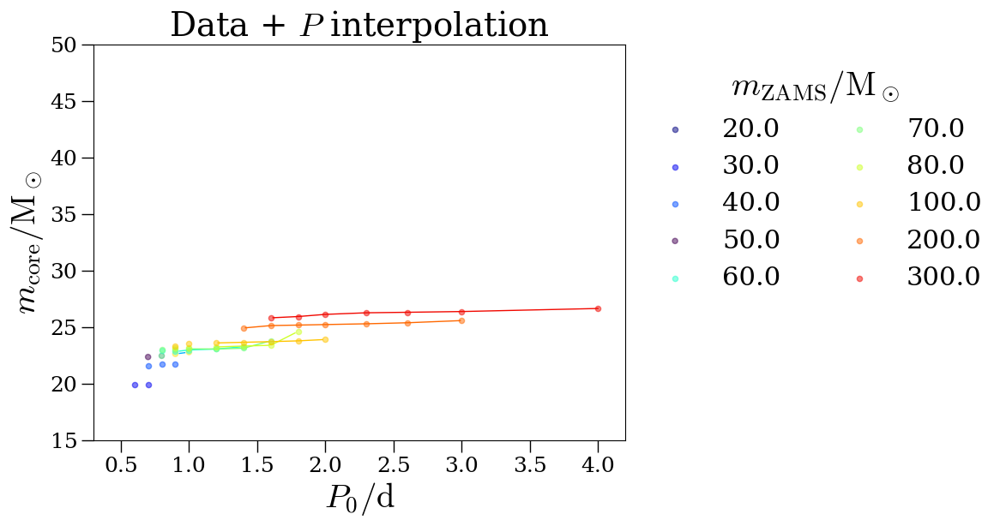

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
interpolator_dict = l2_pzams_mcore_interpolator_dict

for i, m_key in enumerate(mass_guide_str):
    c = cm.jet(i/len(mass_guide_str))
    interpolator = interpolator_dict[m_key]
    plot_ps = np.linspace(0, 4, 100)
    che_mask = np.array(final_mass_array[:,i,9], bool)
    ax.scatter(period_guide_float[che_mask], final_mass_array[:,i,0][che_mask], marker='o', c=c, zorder=1, label=m_key, s=20, alpha=0.5)
    ax.scatter(period_guide_float[~che_mask], final_mass_array[:,i,3][~che_mask], marker='x', c=c, zorder=2)
    ax.plot(plot_ps, interpolator(plot_ps), c=c, zorder=0, lw=1)
    
ax.set_ylim(15, 50)
ax.set_xlim(0.3, 4.2)

ax.set_xlabel('$P_0/\\mathrm{d}$')
ax.set_ylabel('$m_\\mathrm{core}/\\mathrm{M}_\\odot$')

ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1, 1), ncol=2, title='$m_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_title('Data + $P$ interpolation')

savefig(fig, 'pzams_mcore_data')

In [ ]:
def l2_mzams_mcore_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_mcore_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value='extrapolate'
    )
    
    m_core = interpolator(m_zams)
    
    return m_core  

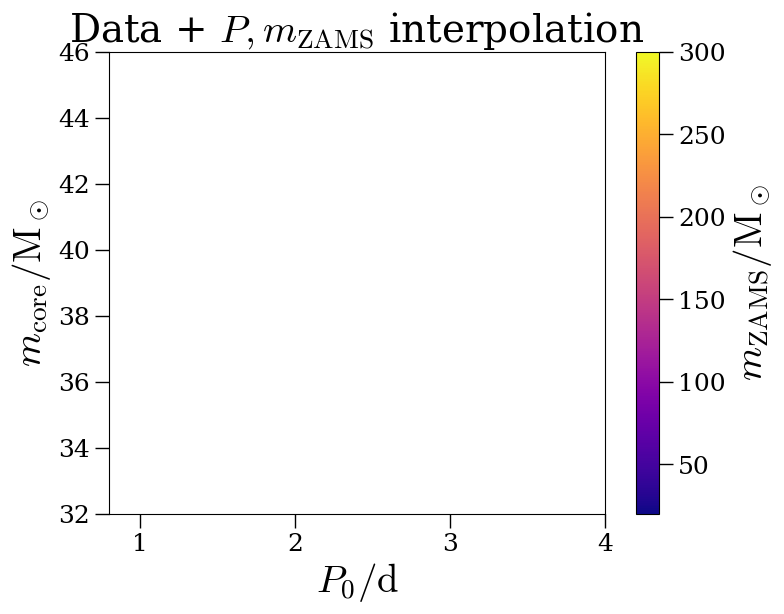

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
interpolator = l2_mzams_mcore_interpolator
cmap = cm.plasma

test_masses = np.linspace(20, 300, 500)
test_periods = np.linspace(0.1, 4)

for i, m in enumerate(test_masses):
    c = cmap(i/len(test_masses))
    m_cores = [interpolator(m, p) for p in test_periods]
    ax.plot(test_periods, m_cores, c=c, lw=2, label=f'${m:.1f}$')
    
ax.set_ylim(32, 46)
ax.set_xlim(0.8, 4)

ax.set_xlabel('$P_0/\\mathrm{d}$')
ax.set_ylabel('$m_\\mathrm{core}/\\mathrm{M}_\\odot$')

#ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1, 1), ncol=1, title='$m_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
sm = ScalarMappable(norm=Normalize(vmin=min(test_masses), vmax=max(test_masses)), cmap=cmap)
cb = fig.colorbar(mappable=sm, ax=ax)
cb.set_label('$m_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')

ax.set_title('Data + $P,m_\\mathrm{ZAMS}$ interpolation')

savefig(fig, 'pzams_mcore_ip')

In [ ]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 6] 
    r_arr = final_mass_array[:, i, 6] 
    
    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]

    if m_key in ['280.0', '220.0', '160.0', '50.0', '80.0']:
        p_arr = p_arr[1:]
        y_arr = y_arr[1:]
        r_arr = r_arr[1:]
 
    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
    
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_rzams_interpolator_dict = interpolator_dict

/tmp/ipykernel_2123654/4193244287.py:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(period_guide_float[che_mask], final_mass_array[:,i,6][che_mask], marker='o', c=c, zorder=1, s=20, alpha=0.5)
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


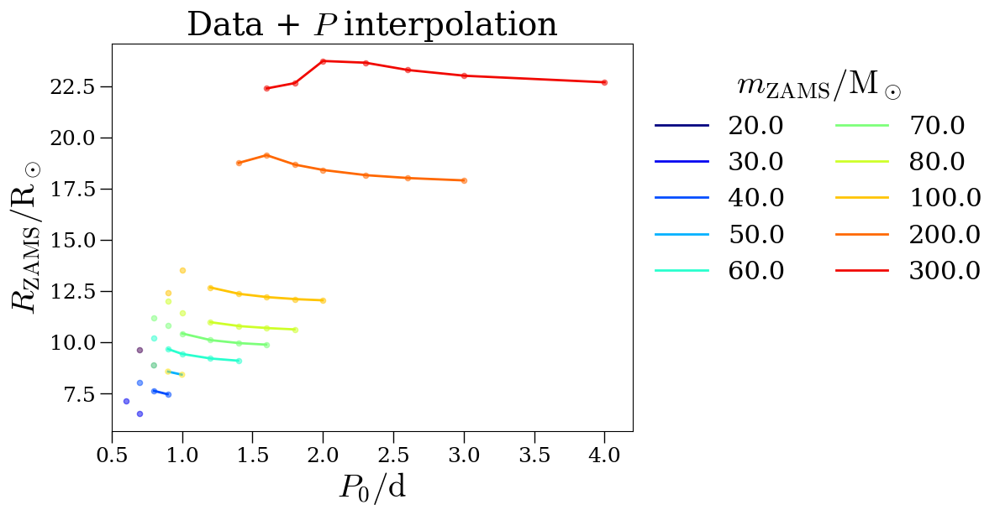

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
interpolator_dict = l2_pzams_rzams_interpolator_dict

for i, m_key in enumerate(mass_guide_str):
    c = cm.jet(i/len(mass_guide_str))
    interpolator = interpolator_dict[m_key]
    plot_ps = np.linspace(0, 4, 1000)
    che_mask = np.array(final_mass_array[:,i,9], bool)
    ax.scatter(period_guide_float[che_mask], final_mass_array[:,i,6][che_mask], marker='o', c=c, zorder=1, s=20, alpha=0.5)
    #ax.scatter(period_guide_float[~che_mask], final_mass_array[:,i,6][~che_mask], marker='x', c=c, zorder=2)
    ax.plot(plot_ps, interpolator(plot_ps), c=c, label=m_key, zorder=0)
    
#ax.set_ylim(20, 40)
ax.set_xlim(0.5, 4.2)

ax.set_xlabel('$P_0/\\mathrm{d}$')
ax.set_ylabel('$R_\\mathrm{ZAMS}/\\mathrm{R}_\\odot$')

ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1, 1), ncol=2, title='$m_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_title('Data + $P$ interpolation')

savefig(fig, 'pzams_rzams_data')

In [ ]:
def l2_mzams_rzams_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_rzams_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value=nan
    )
    
    m_core = interpolator(m_zams)
    
    return m_core      

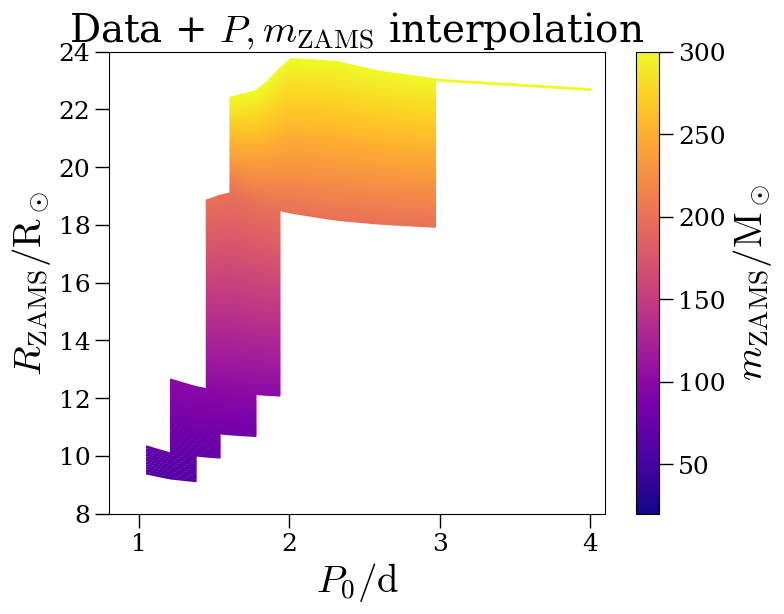

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
interpolator = l2_mzams_rzams_interpolator
cmap = cm.plasma

test_masses = np.linspace(20, 300, 300)
test_periods = np.linspace(0.1, 4)

for i, m in enumerate(test_masses):
    c = cmap(i/len(test_masses))
    m_cores = [interpolator(m, p) for p in test_periods]
    ax.plot(test_periods, m_cores, c=c, lw=2, label=f'${m:.1f}$')
    
ax.set_ylim(8, 24)
ax.set_xlim(0.8, 4.1)

ax.set_xlabel('$P_0/\\mathrm{d}$')
ax.set_ylabel('$R_\\mathrm{ZAMS}/\\mathrm{R}_\\odot$')

#ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1, 1), ncol=1, title='$m_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
sm = ScalarMappable(norm=Normalize(vmin=min(test_masses), vmax=max(test_masses)), cmap=cmap)
cb = fig.colorbar(mappable=sm, ax=ax)
cb.set_label('$m_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')

ax.set_title('Data + $P,m_\\mathrm{ZAMS}$ interpolation')

savefig(fig, 'pzams_rzams_ip')

### Core mass distribution

In [ ]:
res = int(1e8)
min_m = 20
max_m = 300
min_p = 0.1
max_p = 4

sample_masses = np.linspace(min_m, max_m, res)
sample_probs = sample_masses**-2.3/np.sum(sample_masses**-2.3)
sample_masses = np.random.choice(sample_masses, p=sample_probs, size=int(res/100))

sample_periods = np.linspace(np.log10(min_p), np.log10(max_p), res)
sample_probs = np.ones(res)/res
sample_periods = 10.**np.random.choice(sample_periods, p=sample_probs, size=int(res/100))

sample_zams_rs = np.array([l2_mzams_rzams_interpolator(m, p) for m, p in zip(sample_masses, sample_periods)])

sample_mcores = np.zeros(int(res/100))

sample_ = np.array([sample_masses, sample_periods, sample_zams_rs, sample_mcores]).T

In [ ]:
from multiprocessing import Pool
from scipy.stats import mode

In [ ]:
result = draw_mass_sample(res=int(1e8))

NameError: name 'l2_mzams_rzams_interpolator' is not defined

Text(0.98, 0.98, 'Stopping condition: central_c12<=1e-6\nSome models start core Ne burning')

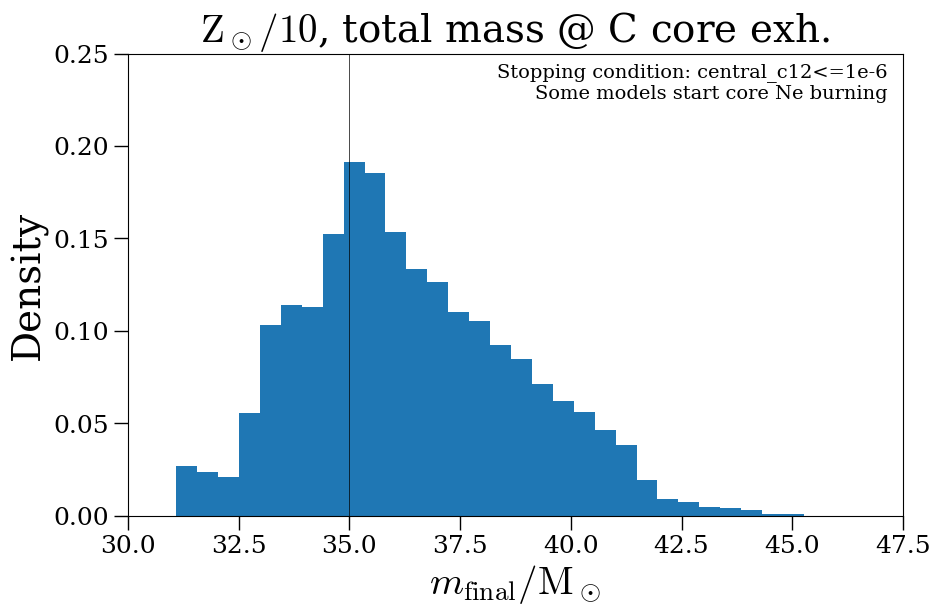

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

ax.hist(result[0][:,3], density=True, bins=30)

ax.vlines(35, 0, 0.3, color='k', lw=0.5)
ax.set_ylim(0, 0.25)
ax.set_xlim(30, 45)
ax.set_xticks(np.arange(30, 50, 2.5))

ax.set_ylabel('Density')
ax.set_xlabel('$m_\\mathrm{final}/\mathrm{M}_\odot$')
ax.set_title('$\\mathrm{Z}_\\odot/10$, total mass @ C core exh.')

#note = '\n'.join(('Stopping condition: central_c12<=1e-6',
                  'Some models start core Ne burning'))
#ax.text(0.98, 
#        0.98, 
#        note,
#        transform=ax.transAxes,
#        ha='right',
#        va='top',
#        fontsize=14
#        )




In [ ]:
import pickle as pkl
np.save('31mcore_sample.npy', sample_)
with open('31mzams_mcore_interpolator.pkl', 'wb') as f:
    pkl.dump(l2_mzams_mcore_interpolator, f)

In [ ]:
result00 = 

## No plots interpolator

In [47]:
nonche_hatch = '\\'
crit_hatch = '/'
l2of_hatch = 'o'

In [48]:
from matplotlib.patches import Patch

In [32]:
def mzams_p0_mcore_of_plot(ax, of_when, of_kind, min_mcore=20, max_mcore=50):    
    of_when_i = stage_index[of_when]
    handles = []
    for i, m_key in enumerate(mass_guide_str):
        c = cm.jet(i/len(mass_guide_str))
        handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))
        m_zams = float(m_key)
        
        #che_mask = np.array(final_mass_array[:,i,9], bool)
        pp = period_guide_float#[che_mask]
        mm = final_mass_array[:,i,0]#[che_mask]
        rr = final_mass_array[:,i,of_when_i]#[che_mask]
        is_che = np.array(final_mass_array[:,i,9], bool)
        is_crit = np.array(final_mass_array[:,i,8], bool)
        
        for p, r, m_core, ische, iscrit in zip(pp, rr, mm, is_che, is_crit):
            if iscrit:
                marker = 'x'
                color = 'k'
            elif not ische:
                marker = '+'
                color = 'k'
            else:
                marker = 'o'
                color = cm.jet_r((np.log10(m_core)-np.log10(min_mcore))/(np.log10(max_mcore)-np.log10(min_mcore)))
            isof = is_of(r, m_zams, p, 1, kind=of_kind)
            if isof:
                alpha = 0.3
            else:
                alpha = 1.0
            ax.scatter(m_zams, p, marker=marker, color=color, zorder=1, s=30, alpha=alpha)
    return ax, handles

In [33]:
def p0_mcore_mzams_of_plot(ax, of_when, of_kind):
    of_when_i = stage_index[of_when]
    handles = []
    for i, m_key in enumerate(mass_guide_str):
        c = cm.jet(i/len(mass_guide_str))
        handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))
        m_zams = float(m_key)
        
        che_mask = np.array(final_mass_array[:,i,9], bool)
        pp = period_guide_float[che_mask]
        mm = final_mass_array[:,i,0][che_mask]
        rr = final_mass_array[:,i,of_when_i][che_mask]
            
        for p, r, m_core in zip(pp, rr, mm):
            isof = is_of(r, m_zams, p, 1, kind=of_kind)
            if isof:
                ax.scatter(p, m_core, marker='x', color=c, zorder=1, s=30, alpha=0.3)
                pass
            else:
                ax.scatter(p, m_core, marker='o', color=c, zorder=1, s=30)
    return ax, handles

In [34]:
def is_of(r, m, p, q=1, kind='RL'):
    a = a_from_p(p, m, q)
    if kind == 'merger':
        of_a = a.to(u.Rsun).value
    elif kind == 'RL':
        of_a = eggleton_rl1_radius(a, q).to(u.Rsun).value
    elif kind == 'L2':
        of_a = marchant_l2_radius(a, q).to(u.Rsun).value
    elif kind == 'none':
        of_a = np.inf
    else:
        raise ValueError(f'kind {kind} not recognized')
    if of_a <= r:
        isof = True
    else:
        isof = False

    return isof

In [35]:
def mass_forward(m):
    return m**-2.35

def mass_inverse(m):
    return m**(-1/2.35)

In [37]:
res = int(1e6)

## $0.1\mathrm{Z}_\odot$

In [688]:
zkey = '0.1'

model_dicts = all_model_dicts[zkey]
final_mass_array = final_core_prop_array_dict[zkey]

# Select models
models_to_plot = np.arange(0, len(model_dicts), 1)
model_dict_list = model_dicts[models_to_plot]
print(f'Loading {model_dict_list}')

# Collect periods
all_periods = []
for dict_ in model_dict_list:
    for k1 in dict_.keys():
        for k2 in dict_[k1].keys():
            all_periods.append(k2)
all_periods = np.unique(all_periods)
all_periods = all_periods[np.argsort([float(p) for p in all_periods])]
print(all_periods)

mass_guide_str = [list(dict_.keys())[0] for dict_ in model_dict_list]
mass_guide_float = np.array([float(m) for m in mass_guide_str])

period_guide_str = all_periods
period_guide_float = np.array([float(p) for p in period_guide_str])

Loading [{'20.0': {'2.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/00_ZdivZsun_1d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.600d+00_w2.797d-05'), '4.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/00_ZdivZsun_1d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d+00_w1.818d-05'), '0.40': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/00_ZdivZsun_1d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d-01_w1.818d-04'), '2.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/00_ZdivZsun_1d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.000d+00_w3.636d-05'), '0.70': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/00_ZdivZsun_1d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p7.000d-01_w1.039d-04'), '1.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/00_ZdivZsun_1d-1/001_md1_m20

/tmp/ipykernel_1635975/3182167842.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=0, hspace=0)
/tmp/ipykernel_1635975/3646536049.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


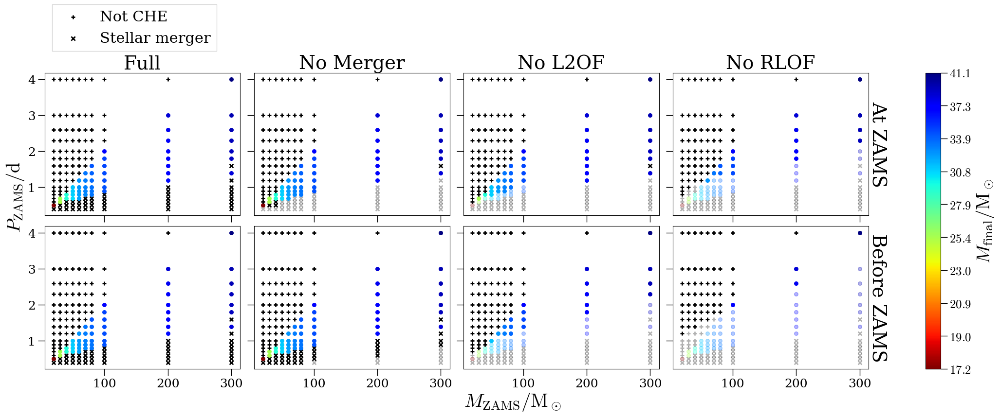

In [689]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True, layout='constrained')
fig.subplots_adjust(wspace=0, hspace=0)

plot_ps = np.linspace(0, 4, 100)

min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)  

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
             
of_kind = 'RL'
ax = axes[1, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
           
fig.text(0, 0.5, '$P_\\mathrm{ZAMS}/\\mathrm{d}$', rotation=90, ha='right', va='center')
fig.text(0.5, 0, '$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

sm = ScalarMappable(Normalize(vmin=np.log10(min_mcore), vmax=np.log10(max_mcore)), cm.jet_r)
cbar = fig.colorbar(sm, ax=axes[:,3], pad=0.2)
cbar.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')
cbar.set_ticks(np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10))
cbar.set_ticklabels([f'${10**logm:.1f}$' for logm in np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10)])

handles = []
handles.append(ax.scatter([], [], marker='+', color='k', label='Not CHE'))
handles.append(ax.scatter([], [], marker='x', color='k', label='Stellar merger'))
axes[0,0].legend(handles=handles, fancybox=False, loc='lower left', bbox_to_anchor=(0, 1.1))

savefig(fig, f'che_window_{zkey}zsun')

In [690]:
min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
mcore_norm = TwoSlopeNorm(vmin=min(30, min_mcore), vmax=max(max_mcore, 40), vcenter=35.)
nonche_c = to_rgba('darkslategrey')
crit_c = to_rgba('slategrey')
cmap = cm.seismic
def mcore_cmap(x): return cmap(mcore_norm(x))

In [691]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
zams_l2of_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = mcore_cmap(mcore)
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
        else:
            mcore_arr[i_m, i_p, :] = nonche_c

        rzams = final_mass_array[i_p, i_m, 6]
        is_l2of = is_of(r=rzams, m=m1, p=p1, q=1, kind='L2')
        if is_l2of:
            zams_l2of_arr[i_m, i_p, :] = [0, 0, 0, 0]
        else:
            zams_l2of_arr[i_m, i_p, :] = 4*[nan]
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

color_mcore_arr = mcore_arr
color_m_arr = m_arr
color_p_arr = p_arr

In [692]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_crit_mcore_arr = mcore_arr
hatch_crit_m_arr = m_arr
hatch_crit_p_arr = p_arr

In [693]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = nonche_c
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_nonche_mcore_arr = mcore_arr
hatch_nonche_m_arr = m_arr
hatch_nonche_p_arr = p_arr

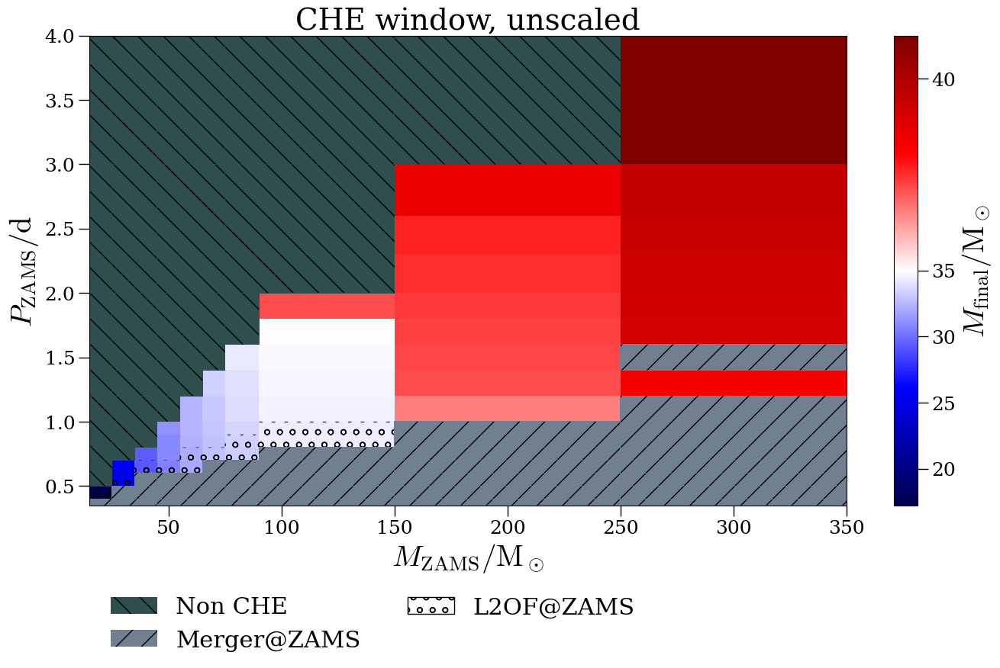

In [694]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_title('CHE window, unscaled')

savefig(fig,f'che_window_unscaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


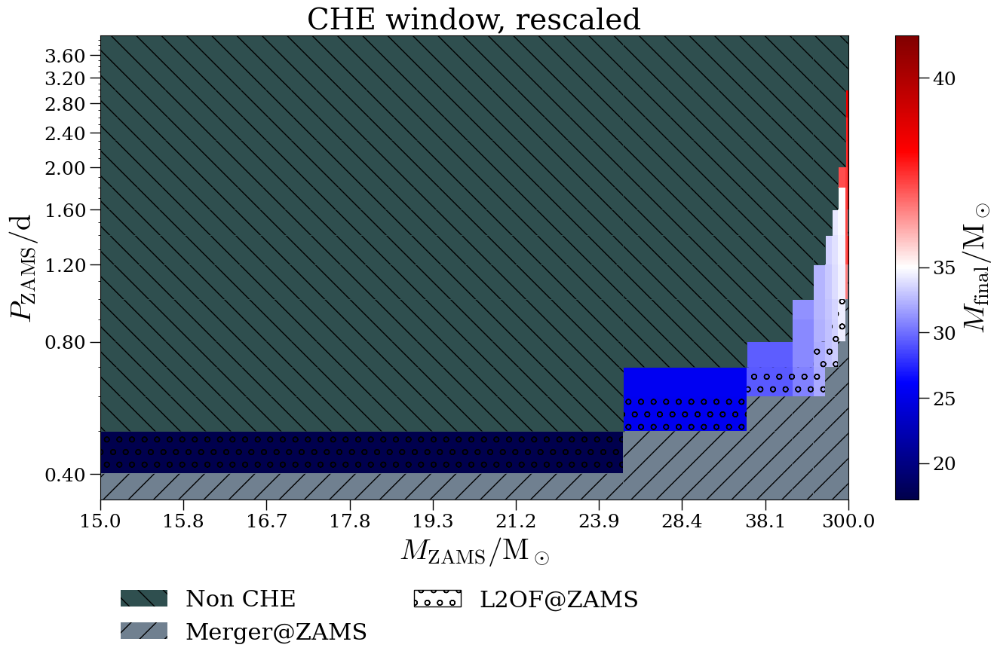

In [695]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(15), mass_forward(300), 10)])

ax.set_xlim(15, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled')

savefig(fig, f'che_window_rescaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


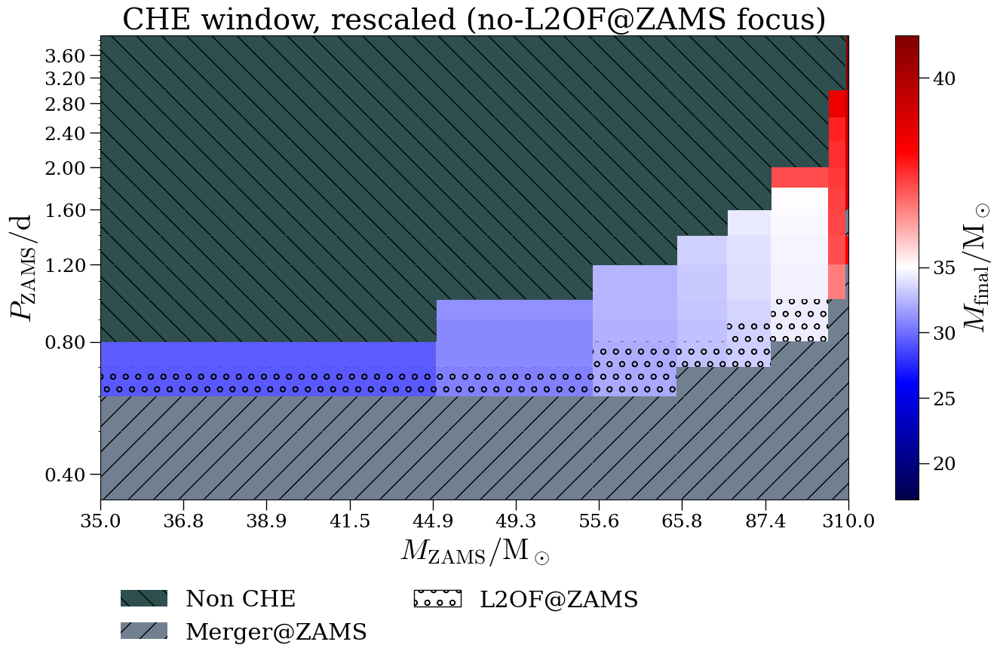

In [696]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(35), mass_forward(310), 10)])

ax.set_xlim(35, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled (no-L2OF@ZAMS focus)')

savefig(fig, f'che_window_rescaled_no_l2of_{zkey}zsun')

In [697]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 0] 
    r_arr = final_mass_array[:, i, 6] 

    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
        
    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
            
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_mcore_interpolator_dict = interpolator_dict

In [698]:
def l2_mzams_mcore_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_mcore_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value='extrapolate'
    )
    
    m_core = interpolator(m_zams)
    
    return m_core  

In [699]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 6] 
    r_arr = final_mass_array[:, i, 6] 
    
    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]

    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
    
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_rzams_interpolator_dict = interpolator_dict

In [700]:
def l2_mzams_rzams_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_rzams_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value=nan
    )
    
    m_core = interpolator(m_zams)
    
    return m_core      

In [701]:
def draw_mass_sample(
    res=int(1e7),
    min_m=20,
    max_m=300,
    min_p=0.1,
    max_p=4,
    min_mfinal=20,
    max_mfinal=50,
    mfinal_bin_width=0.2
):
    sample_masses = np.linspace(min_m, max_m, res)
    sample_probs = sample_masses**-2.3/np.sum(sample_masses**-2.3)
    sample_masses = np.random.choice(sample_masses, p=sample_probs, size=int(res/100))

    sample_periods = np.linspace(np.log10(min_p), np.log10(max_p), res)
    sample_probs = np.ones(res)/res
    sample_periods = 10.**np.random.choice(sample_periods, p=sample_probs, size=int(res/100))

    sample_zams_rs = np.array([l2_mzams_rzams_interpolator(m, p) for m, p in zip(sample_masses, sample_periods)])

    sample_mcores = np.zeros(int(res/100))

    sample_ = np.array([sample_masses, sample_periods, sample_zams_rs, sample_mcores]).T
    zams_l2of_sample = set_mcores(sample_).copy()
    
    mass_draw = zams_l2of_sample[:, 3]
    mass_draw = mass_draw[~np.isnan(mass_draw)]

    bins = np.arange(min_mfinal, max_mfinal+mfinal_bin_width, mfinal_bin_width)
    hist, bins = np.histogram(mass_draw, density=True, bins=bins)
    centers = np.array([(bin0+bin1)/2 for bin0, bin1 in zip(bins[:-1], bins[1:])])
    mode = centers[np.argmax(hist)]
    
    return zams_l2of_sample, mode

In [702]:
result01 = draw_mass_sample(res=res)

In [703]:
result = result01

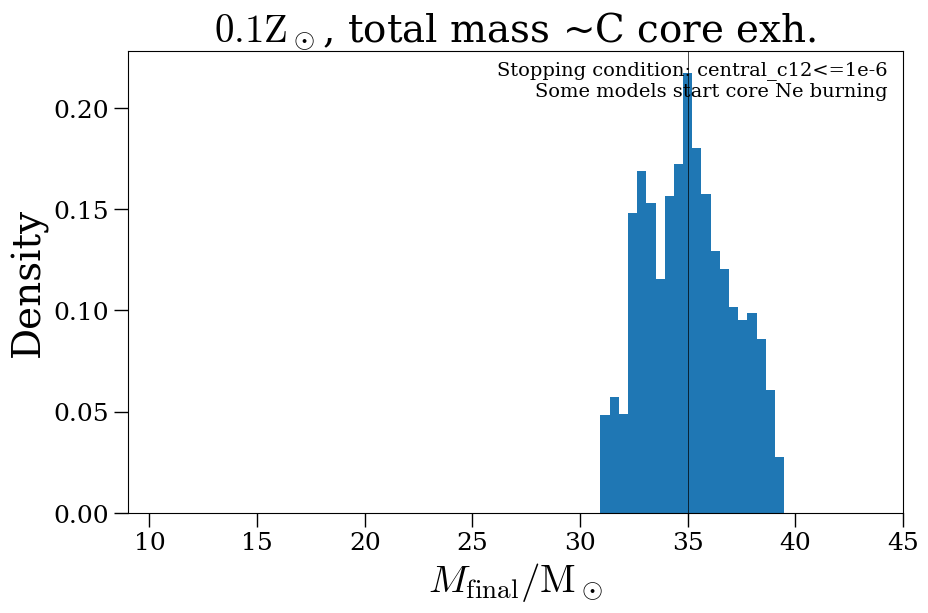

In [704]:
fig, ax = plt.subplots(figsize=(10,6))

h, bins, patches = ax.hist(result[0][:,3], density=True, bins=20)

ax.vlines(35, 0, max(h)*1.05, color='k', lw=0.5)
ax.set_ylim(0, max(h)*1.05)
ax.set_xlim(9, 45)
#ax.set_xticks(np.arange(30, 50, 2.5))

ax.set_ylabel('Density')
ax.set_xlabel('$M_\\mathrm{final}/\mathrm{M}_\odot$')
ax.set_title(f'${zkey}\\mathrm{{Z}}_\\odot$, total mass ~C core exh.')

note = '\n'.join(('Stopping condition: central_c12<=1e-6',
                  'Some models start core Ne burning'))
ax.text(0.98, 
        0.98, 
        note,
        transform=ax.transAxes,
        ha='right',
        va='top',
        fontsize=14
        )

savefig(fig, f'mfinal_distr_{zkey}zsun')


## $0.2\mathrm{Z}_\odot$

In [705]:
zkey = '0.2'

model_dicts = all_model_dicts[zkey]
final_mass_array = final_core_prop_array_dict[zkey]

# Select models
models_to_plot = np.arange(0, len(model_dicts), 1)
model_dict_list = model_dicts[models_to_plot]
print(f'Loading {model_dict_list}')

# Collect periods
all_periods = []
for dict_ in model_dict_list:
    for k1 in dict_.keys():
        for k2 in dict_[k1].keys():
            all_periods.append(k2)
all_periods = np.unique(all_periods)
all_periods = all_periods[np.argsort([float(p) for p in all_periods])]
print(all_periods)

mass_guide_str = [list(dict_.keys())[0] for dict_ in model_dict_list]
mass_guide_float = np.array([float(m) for m in mass_guide_str])

period_guide_str = all_periods
period_guide_float = np.array([float(p) for p in period_guide_str])

Loading [{'20.0': {'2.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/01_ZdivZsun_2d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.600d+00_w2.797d-05'), '4.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/01_ZdivZsun_2d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d+00_w1.818d-05'), '0.40': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/01_ZdivZsun_2d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d-01_w1.818d-04'), '2.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/01_ZdivZsun_2d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.000d+00_w3.636d-05'), '0.70': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/01_ZdivZsun_2d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p7.000d-01_w1.039d-04'), '1.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/01_ZdivZsun_2d-1/001_md1_m20

/tmp/ipykernel_1635975/3182167842.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=0, hspace=0)
/tmp/ipykernel_1635975/3646536049.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


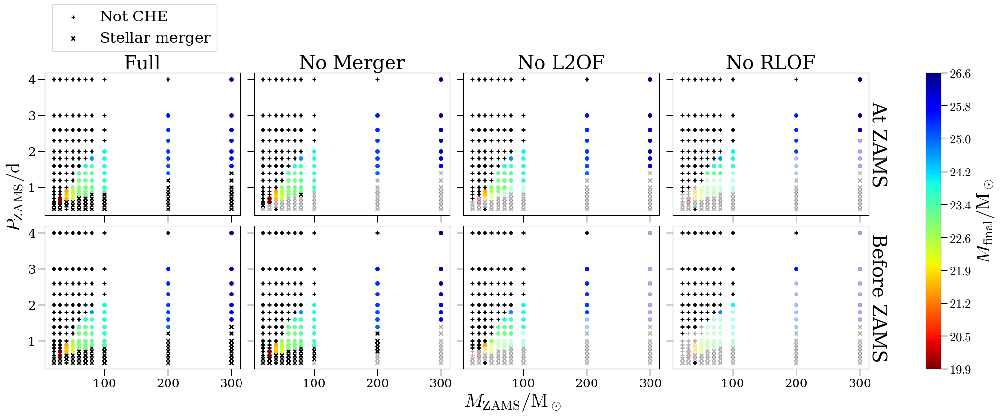

In [706]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True, layout='constrained')
fig.subplots_adjust(wspace=0, hspace=0)

plot_ps = np.linspace(0, 4, 100)

min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)  

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
             
of_kind = 'RL'
ax = axes[1, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
           
fig.text(0, 0.5, '$P_\\mathrm{ZAMS}/\\mathrm{d}$', rotation=90, ha='right', va='center')
fig.text(0.5, 0, '$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

sm = ScalarMappable(Normalize(vmin=np.log10(min_mcore), vmax=np.log10(max_mcore)), cm.jet_r)
cbar = fig.colorbar(sm, ax=axes[:,3], pad=0.2)
cbar.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')
cbar.set_ticks(np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10))
cbar.set_ticklabels([f'${10**logm:.1f}$' for logm in np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10)])

handles = []
handles.append(ax.scatter([], [], marker='+', color='k', label='Not CHE'))
handles.append(ax.scatter([], [], marker='x', color='k', label='Stellar merger'))
axes[0,0].legend(handles=handles, fancybox=False, loc='lower left', bbox_to_anchor=(0, 1.1))

savefig(fig, f'che_window_{zkey}zsun')

In [ ]:
min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
mcore_norm = TwoSlopeNorm(vmin=min(30, min_mcore), vmax=max(max_mcore, 40), vcenter=35.)
nonche_c = to_rgba('darkslategrey')
crit_c = to_rgba('slategrey')
cmap = cm.seismic
def mcore_cmap(x): return cmap(mcore_norm(x))

In [708]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
zams_l2of_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = mcore_cmap(mcore)
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
        else:
            mcore_arr[i_m, i_p, :] = nonche_c

        rzams = final_mass_array[i_p, i_m, 6]
        is_l2of = is_of(r=rzams, m=m1, p=p1, q=1, kind='L2')
        if is_l2of:
            zams_l2of_arr[i_m, i_p, :] = [0, 0, 0, 0]
        else:
            zams_l2of_arr[i_m, i_p, :] = 4*[nan]
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

color_mcore_arr = mcore_arr
color_m_arr = m_arr
color_p_arr = p_arr

In [709]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_crit_mcore_arr = mcore_arr
hatch_crit_m_arr = m_arr
hatch_crit_p_arr = p_arr

In [710]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = nonche_c
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_nonche_mcore_arr = mcore_arr
hatch_nonche_m_arr = m_arr
hatch_nonche_p_arr = p_arr

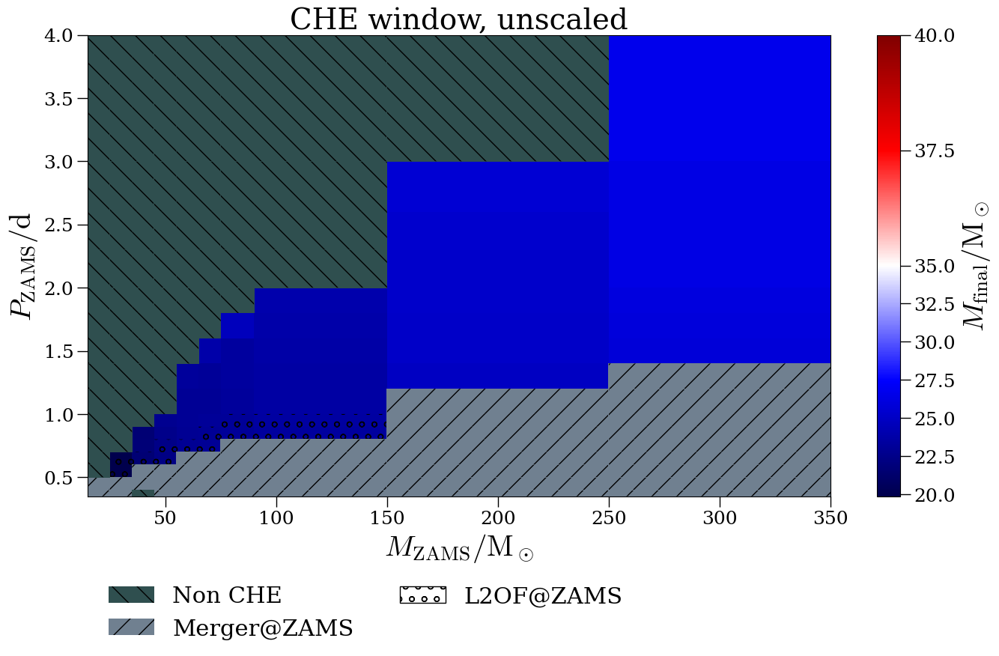

In [711]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_title('CHE window, unscaled')

savefig(fig,f'che_window_unscaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


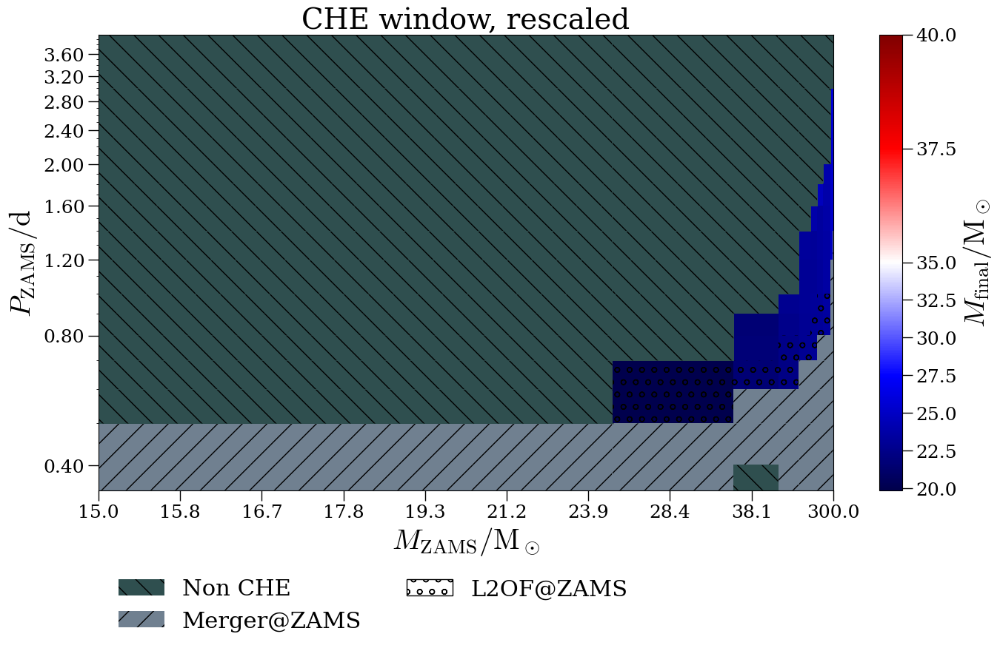

In [712]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(15), mass_forward(300), 10)])

ax.set_xlim(15, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled')

savefig(fig, f'che_window_rescaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


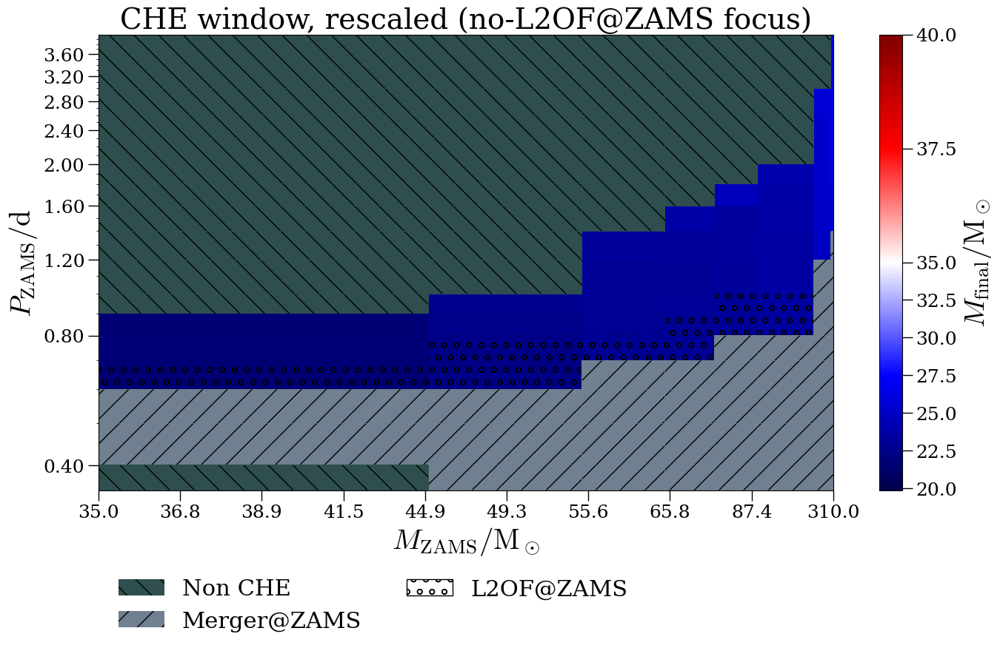

In [713]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(35), mass_forward(310), 10)])

ax.set_xlim(35, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled (no-L2OF@ZAMS focus)')

savefig(fig, f'che_window_rescaled_no_l2of_{zkey}zsun')

In [714]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 0] 
    r_arr = final_mass_array[:, i, 6] 

    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
        
    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
            
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_mcore_interpolator_dict = interpolator_dict

In [715]:
def l2_mzams_mcore_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_mcore_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value='extrapolate'
    )
    
    m_core = interpolator(m_zams)
    
    return m_core  

In [716]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 6] 
    r_arr = final_mass_array[:, i, 6] 
    
    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]

    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
    
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_rzams_interpolator_dict = interpolator_dict

In [717]:
def l2_mzams_rzams_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_rzams_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value=nan
    )
    
    m_core = interpolator(m_zams)
    
    return m_core      

In [718]:
def draw_mass_sample(
    res=int(1e7),
    min_m=20,
    max_m=300,
    min_p=0.1,
    max_p=4,
    min_mfinal=20,
    max_mfinal=50,
    mfinal_bin_width=0.2
):
    sample_masses = np.linspace(min_m, max_m, res)
    sample_probs = sample_masses**-2.3/np.sum(sample_masses**-2.3)
    sample_masses = np.random.choice(sample_masses, p=sample_probs, size=int(res/100))

    sample_periods = np.linspace(np.log10(min_p), np.log10(max_p), res)
    sample_probs = np.ones(res)/res
    sample_periods = 10.**np.random.choice(sample_periods, p=sample_probs, size=int(res/100))

    sample_zams_rs = np.array([l2_mzams_rzams_interpolator(m, p) for m, p in zip(sample_masses, sample_periods)])

    sample_mcores = np.zeros(int(res/100))

    sample_ = np.array([sample_masses, sample_periods, sample_zams_rs, sample_mcores]).T
    zams_l2of_sample = set_mcores(sample_).copy()
    
    mass_draw = zams_l2of_sample[:, 3]
    mass_draw = mass_draw[~np.isnan(mass_draw)]

    bins = np.arange(min_mfinal, max_mfinal+mfinal_bin_width, mfinal_bin_width)
    hist, bins = np.histogram(mass_draw, density=True, bins=bins)
    centers = np.array([(bin0+bin1)/2 for bin0, bin1 in zip(bins[:-1], bins[1:])])
    mode = centers[np.argmax(hist)]
    
    return zams_l2of_sample, mode

In [719]:
result02 = draw_mass_sample(res=res)

In [720]:
result = result02

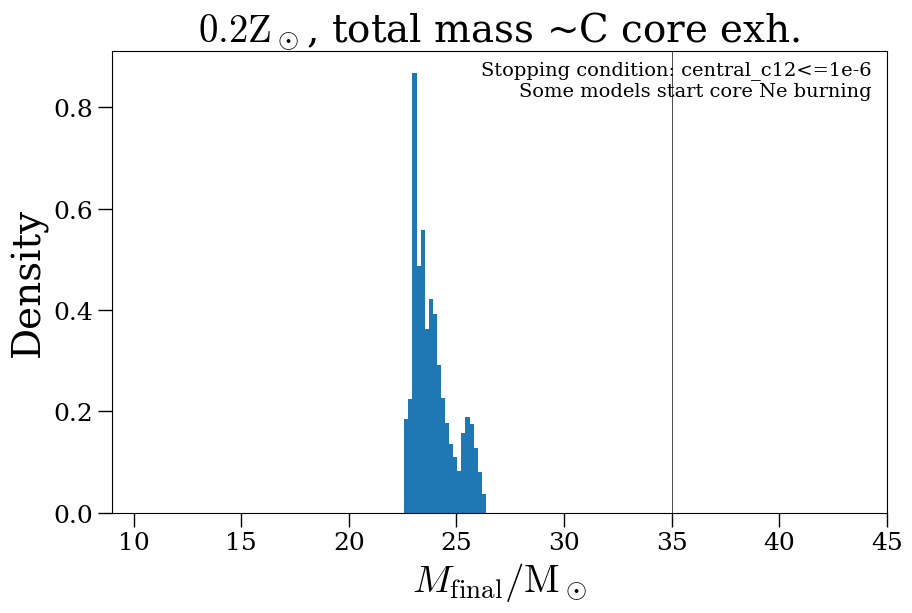

In [721]:
fig, ax = plt.subplots(figsize=(10,6))

h, bins, patches = ax.hist(result[0][:,3], density=True, bins=20)

ax.vlines(35, 0, max(h)*1.05, color='k', lw=0.5)
ax.set_ylim(0, max(h)*1.05)
ax.set_xlim(9, 45)
#ax.set_xticks(np.arange(30, 50, 2.5))

ax.set_ylabel('Density')
ax.set_xlabel('$M_\\mathrm{final}/\mathrm{M}_\odot$')
ax.set_title(f'${zkey}\\mathrm{{Z}}_\\odot$, total mass ~C core exh.')

note = '\n'.join(('Stopping condition: central_c12<=1e-6',
                  'Some models start core Ne burning'))
ax.text(0.98, 
        0.98, 
        note,
        transform=ax.transAxes,
        ha='right',
        va='top',
        fontsize=14
        )

savefig(fig, f'mfinal_distr_{zkey}zsun')


## $0.4\mathrm{Z}_\odot$

In [722]:
zkey = '0.4'

model_dicts = all_model_dicts[zkey]
final_mass_array = final_core_prop_array_dict[zkey]

# Select models
models_to_plot = np.arange(0, len(model_dicts), 1)
model_dict_list = model_dicts[models_to_plot]
print(f'Loading {model_dict_list}')

# Collect periods
all_periods = []
for dict_ in model_dict_list:
    for k1 in dict_.keys():
        for k2 in dict_[k1].keys():
            all_periods.append(k2)
all_periods = np.unique(all_periods)
all_periods = all_periods[np.argsort([float(p) for p in all_periods])]
print(all_periods)

mass_guide_str = [list(dict_.keys())[0] for dict_ in model_dict_list]
mass_guide_float = np.array([float(m) for m in mass_guide_str])

period_guide_str = all_periods
period_guide_float = np.array([float(p) for p in period_guide_str])

Loading [{'20.0': {'2.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.600d+00_w2.797d-05'), '4.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d+00_w1.818d-05'), '0.40': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d-01_w1.818d-04'), '2.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.000d+00_w3.636d-05'), '0.70': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p7.000d-01_w1.039d-04'), '1.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/02_ZdivZsun_4d-1/001_md1_m20

/tmp/ipykernel_1635975/3182167842.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=0, hspace=0)
/tmp/ipykernel_1635975/3646536049.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


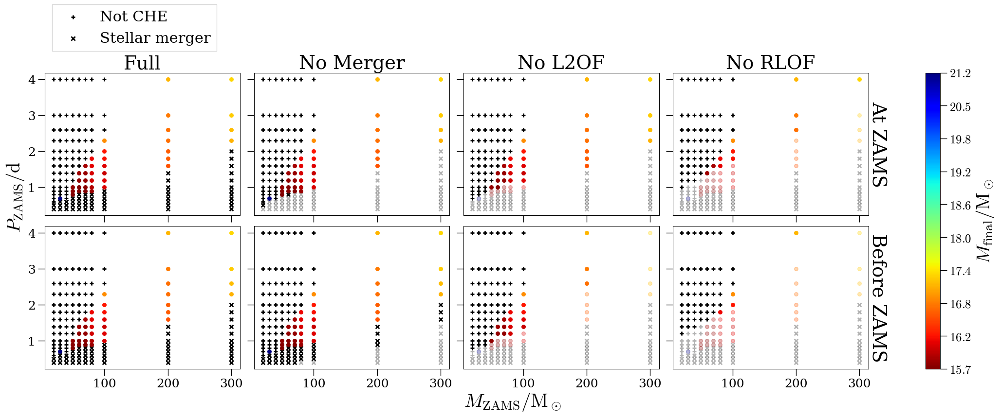

In [723]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True, layout='constrained')
fig.subplots_adjust(wspace=0, hspace=0)

plot_ps = np.linspace(0, 4, 100)

min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)  

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
             
of_kind = 'RL'
ax = axes[1, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
           
fig.text(0, 0.5, '$P_\\mathrm{ZAMS}/\\mathrm{d}$', rotation=90, ha='right', va='center')
fig.text(0.5, 0, '$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

sm = ScalarMappable(Normalize(vmin=np.log10(min_mcore), vmax=np.log10(max_mcore)), cm.jet_r)
cbar = fig.colorbar(sm, ax=axes[:,3], pad=0.2)
cbar.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')
cbar.set_ticks(np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10))
cbar.set_ticklabels([f'${10**logm:.1f}$' for logm in np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10)])

handles = []
handles.append(ax.scatter([], [], marker='+', color='k', label='Not CHE'))
handles.append(ax.scatter([], [], marker='x', color='k', label='Stellar merger'))
axes[0,0].legend(handles=handles, fancybox=False, loc='lower left', bbox_to_anchor=(0, 1.1))

savefig(fig, f'che_window_{zkey}zsun')

In [724]:
min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
mcore_norm = TwoSlopeNorm(vmin=min(30, min_mcore), vmax=max(max_mcore, 40), vcenter=35.)
nonche_c = to_rgba('darkslategrey')
crit_c = to_rgba('slategrey')
cmap = cm.seismic
def mcore_cmap(x): return cmap(mcore_norm(x))

In [725]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
zams_l2of_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = mcore_cmap(mcore)
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
        else:
            mcore_arr[i_m, i_p, :] = nonche_c

        rzams = final_mass_array[i_p, i_m, 6]
        is_l2of = is_of(r=rzams, m=m1, p=p1, q=1, kind='L2')
        if is_l2of:
            zams_l2of_arr[i_m, i_p, :] = [0, 0, 0, 0]
        else:
            zams_l2of_arr[i_m, i_p, :] = 4*[nan]
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

color_mcore_arr = mcore_arr
color_m_arr = m_arr
color_p_arr = p_arr

In [726]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_crit_mcore_arr = mcore_arr
hatch_crit_m_arr = m_arr
hatch_crit_p_arr = p_arr

In [727]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = nonche_c
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_nonche_mcore_arr = mcore_arr
hatch_nonche_m_arr = m_arr
hatch_nonche_p_arr = p_arr

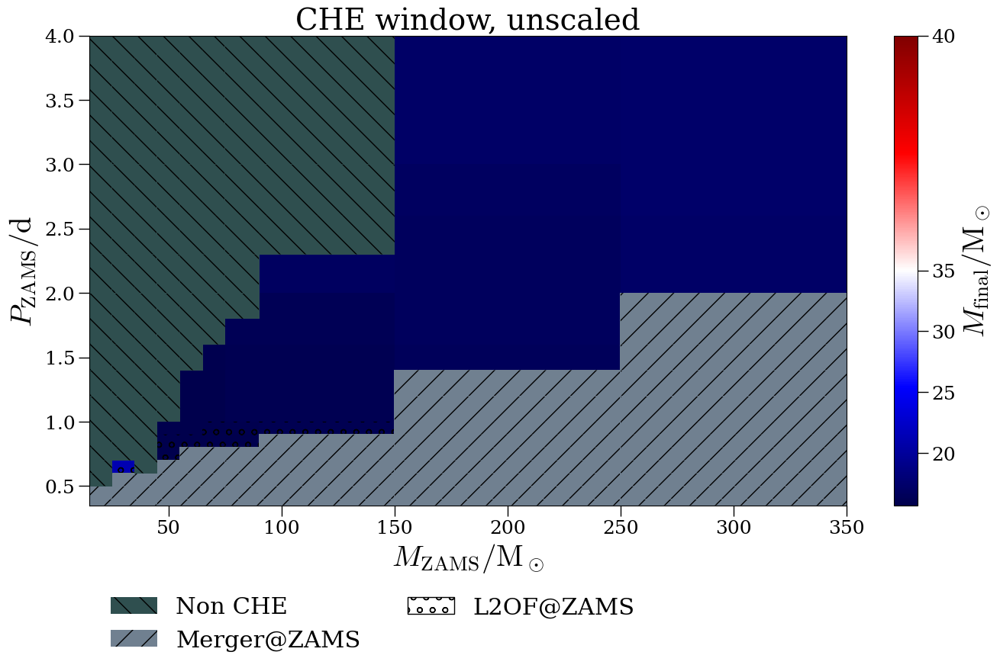

In [728]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_title('CHE window, unscaled')

savefig(fig,f'che_window_unscaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


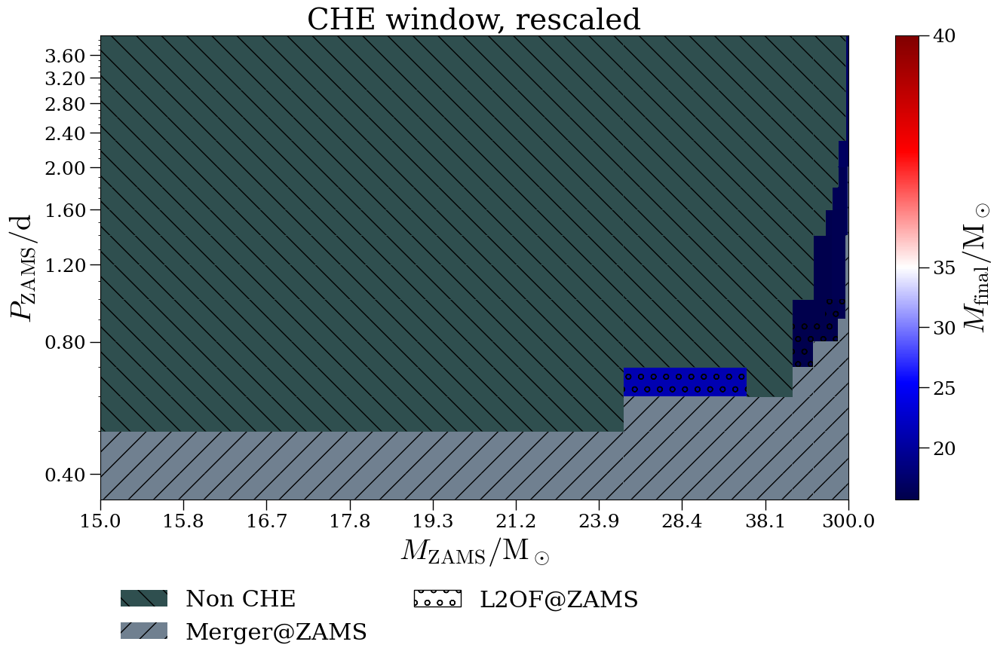

In [729]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(15), mass_forward(300), 10)])

ax.set_xlim(15, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled')

savefig(fig, f'che_window_rescaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


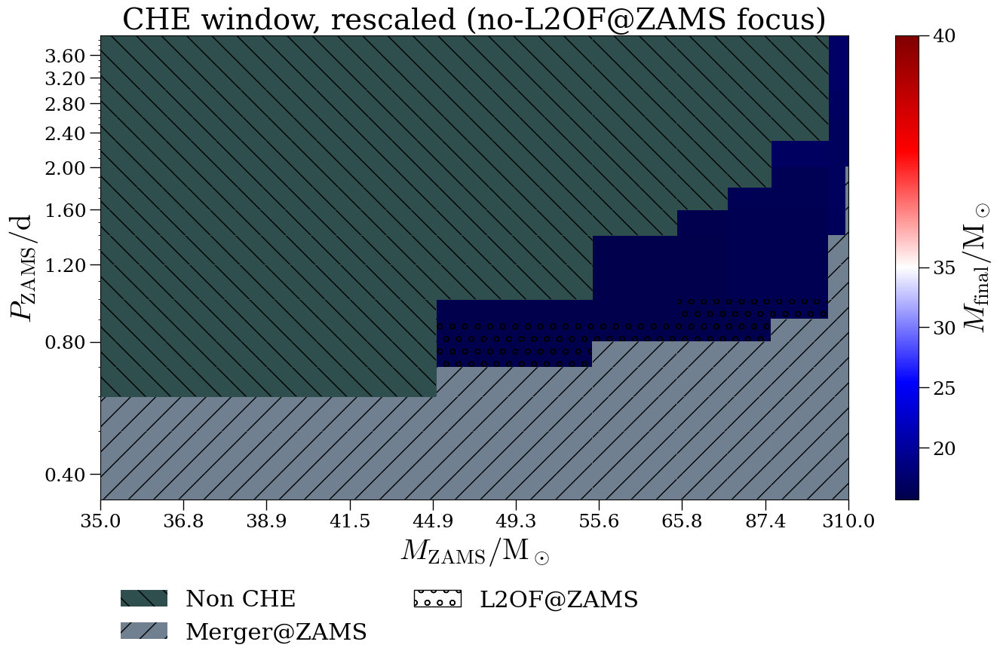

In [730]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(35), mass_forward(310), 10)])

ax.set_xlim(35, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled (no-L2OF@ZAMS focus)')

savefig(fig, f'che_window_rescaled_no_l2of_{zkey}zsun')

In [731]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 0] 
    r_arr = final_mass_array[:, i, 6] 

    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
        
    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
            
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_mcore_interpolator_dict = interpolator_dict

In [732]:
def l2_mzams_mcore_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_mcore_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value='extrapolate'
    )
    
    m_core = interpolator(m_zams)
    
    return m_core  

In [733]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 6] 
    r_arr = final_mass_array[:, i, 6] 
    
    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]

    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
    
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_rzams_interpolator_dict = interpolator_dict

In [734]:
def l2_mzams_rzams_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_rzams_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value=nan
    )
    
    m_core = interpolator(m_zams)
    
    return m_core      

In [735]:
def draw_mass_sample(
    res=int(1e7),
    min_m=20,
    max_m=300,
    min_p=0.1,
    max_p=4,
    min_mfinal=20,
    max_mfinal=50,
    mfinal_bin_width=0.2
):
    sample_masses = np.linspace(min_m, max_m, res)
    sample_probs = sample_masses**-2.3/np.sum(sample_masses**-2.3)
    sample_masses = np.random.choice(sample_masses, p=sample_probs, size=int(res/100))

    sample_periods = np.linspace(np.log10(min_p), np.log10(max_p), res)
    sample_probs = np.ones(res)/res
    sample_periods = 10.**np.random.choice(sample_periods, p=sample_probs, size=int(res/100))

    sample_zams_rs = np.array([l2_mzams_rzams_interpolator(m, p) for m, p in zip(sample_masses, sample_periods)])

    sample_mcores = np.zeros(int(res/100))

    sample_ = np.array([sample_masses, sample_periods, sample_zams_rs, sample_mcores]).T
    zams_l2of_sample = set_mcores(sample_).copy()
    
    mass_draw = zams_l2of_sample[:, 3]
    mass_draw = mass_draw[~np.isnan(mass_draw)]

    bins = np.arange(min_mfinal, max_mfinal+mfinal_bin_width, mfinal_bin_width)
    hist, bins = np.histogram(mass_draw, density=True, bins=bins)
    centers = np.array([(bin0+bin1)/2 for bin0, bin1 in zip(bins[:-1], bins[1:])])
    mode = centers[np.argmax(hist)]
    
    return zams_l2of_sample, mode

In [736]:
result04 = draw_mass_sample(res=res)

/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


In [737]:
result = result04

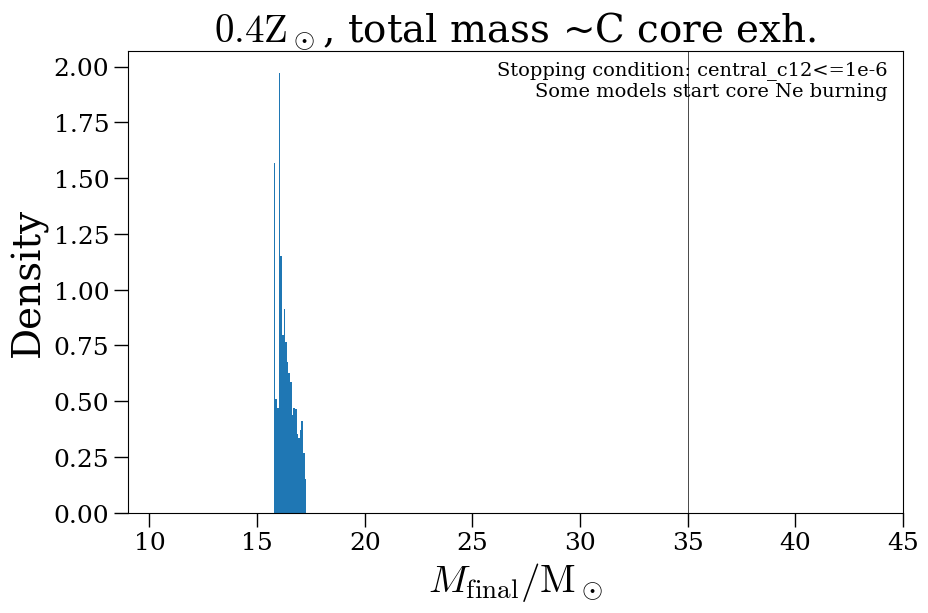

In [738]:
fig, ax = plt.subplots(figsize=(10,6))

h, bins, patches = ax.hist(result[0][:,3], density=True, bins=20)

ax.vlines(35, 0, max(h)*1.05, color='k', lw=0.5)
ax.set_ylim(0, max(h)*1.05)
ax.set_xlim(9, 45)
#ax.set_xticks(np.arange(30, 50, 2.5))

ax.set_ylabel('Density')
ax.set_xlabel('$M_\\mathrm{final}/\mathrm{M}_\odot$')
ax.set_title(f'${zkey}\\mathrm{{Z}}_\\odot$, total mass ~C core exh.')

note = '\n'.join(('Stopping condition: central_c12<=1e-6',
                  'Some models start core Ne burning'))
ax.text(0.98, 
        0.98, 
        note,
        transform=ax.transAxes,
        ha='right',
        va='top',
        fontsize=14
        )

savefig(fig, f'mfinal_distr_{zkey}zsun')


## $0.6\mathrm{Z}_\odot$

In [739]:
zkey = '0.6'

model_dicts = all_model_dicts[zkey]
final_mass_array = final_core_prop_array_dict[zkey]

# Select models
models_to_plot = np.arange(0, len(model_dicts), 1)
model_dict_list = model_dicts[models_to_plot]
print(f'Loading {model_dict_list}')

# Collect periods
all_periods = []
for dict_ in model_dict_list:
    for k1 in dict_.keys():
        for k2 in dict_[k1].keys():
            all_periods.append(k2)
all_periods = np.unique(all_periods)
all_periods = all_periods[np.argsort([float(p) for p in all_periods])]
print(all_periods)

mass_guide_str = [list(dict_.keys())[0] for dict_ in model_dict_list]
mass_guide_float = np.array([float(m) for m in mass_guide_str])

period_guide_str = all_periods
period_guide_float = np.array([float(p) for p in period_guide_str])

Loading [{'20.0': {'2.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/03_ZdivZsun_6d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.600d+00_w2.797d-05'), '4.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/03_ZdivZsun_6d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d+00_w1.818d-05'), '0.40': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/03_ZdivZsun_6d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d-01_w1.818d-04'), '2.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/03_ZdivZsun_6d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.000d+00_w3.636d-05'), '0.70': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/03_ZdivZsun_6d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p7.000d-01_w1.039d-04'), '1.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/03_ZdivZsun_6d-1/001_md1_m20

/tmp/ipykernel_1635975/3182167842.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=0, hspace=0)
/tmp/ipykernel_1635975/3646536049.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


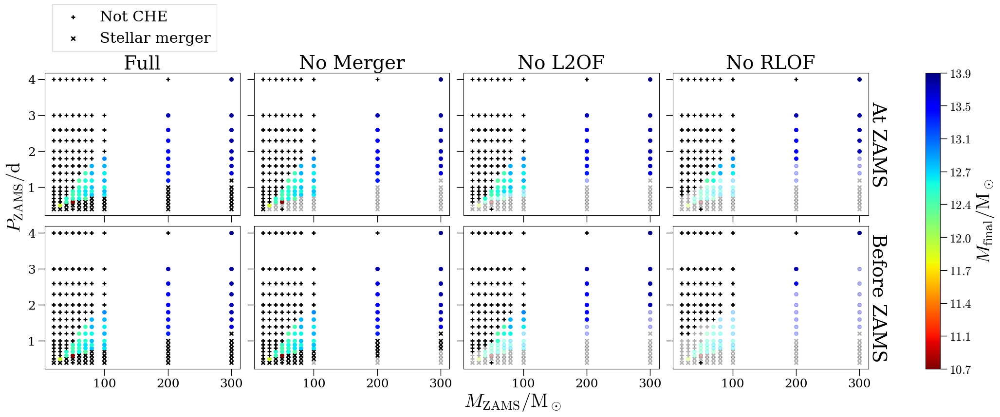

In [740]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True, layout='constrained')
fig.subplots_adjust(wspace=0, hspace=0)

plot_ps = np.linspace(0, 4, 100)

min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)  

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
             
of_kind = 'RL'
ax = axes[1, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
           
fig.text(0, 0.5, '$P_\\mathrm{ZAMS}/\\mathrm{d}$', rotation=90, ha='right', va='center')
fig.text(0.5, 0, '$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

sm = ScalarMappable(Normalize(vmin=np.log10(min_mcore), vmax=np.log10(max_mcore)), cm.jet_r)
cbar = fig.colorbar(sm, ax=axes[:,3], pad=0.2)
cbar.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')
cbar.set_ticks(np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10))
cbar.set_ticklabels([f'${10**logm:.1f}$' for logm in np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10)])

handles = []
handles.append(ax.scatter([], [], marker='+', color='k', label='Not CHE'))
handles.append(ax.scatter([], [], marker='x', color='k', label='Stellar merger'))
axes[0,0].legend(handles=handles, fancybox=False, loc='lower left', bbox_to_anchor=(0, 1.1))

savefig(fig, f'che_window_{zkey}zsun')

In [741]:
min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
mcore_norm = TwoSlopeNorm(vmin=min(30, min_mcore), vmax=max(max_mcore, 40), vcenter=35.)
nonche_c = to_rgba('darkslategrey')
crit_c = to_rgba('slategrey')
cmap = cm.seismic
def mcore_cmap(x): return cmap(mcore_norm(x))

In [742]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
zams_l2of_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = mcore_cmap(mcore)
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
        else:
            mcore_arr[i_m, i_p, :] = nonche_c

        rzams = final_mass_array[i_p, i_m, 6]
        is_l2of = is_of(r=rzams, m=m1, p=p1, q=1, kind='L2')
        if is_l2of:
            zams_l2of_arr[i_m, i_p, :] = [0, 0, 0, 0]
        else:
            zams_l2of_arr[i_m, i_p, :] = 4*[nan]
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

color_mcore_arr = mcore_arr
color_m_arr = m_arr
color_p_arr = p_arr

In [743]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_crit_mcore_arr = mcore_arr
hatch_crit_m_arr = m_arr
hatch_crit_p_arr = p_arr

In [744]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = nonche_c
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_nonche_mcore_arr = mcore_arr
hatch_nonche_m_arr = m_arr
hatch_nonche_p_arr = p_arr

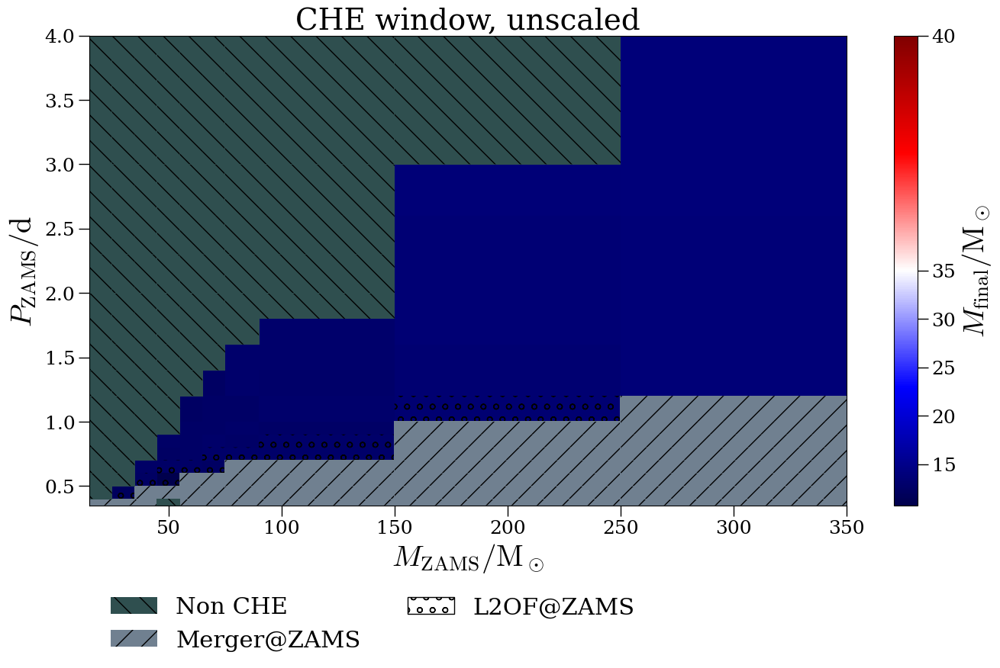

In [745]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_title('CHE window, unscaled')

savefig(fig,f'che_window_unscaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


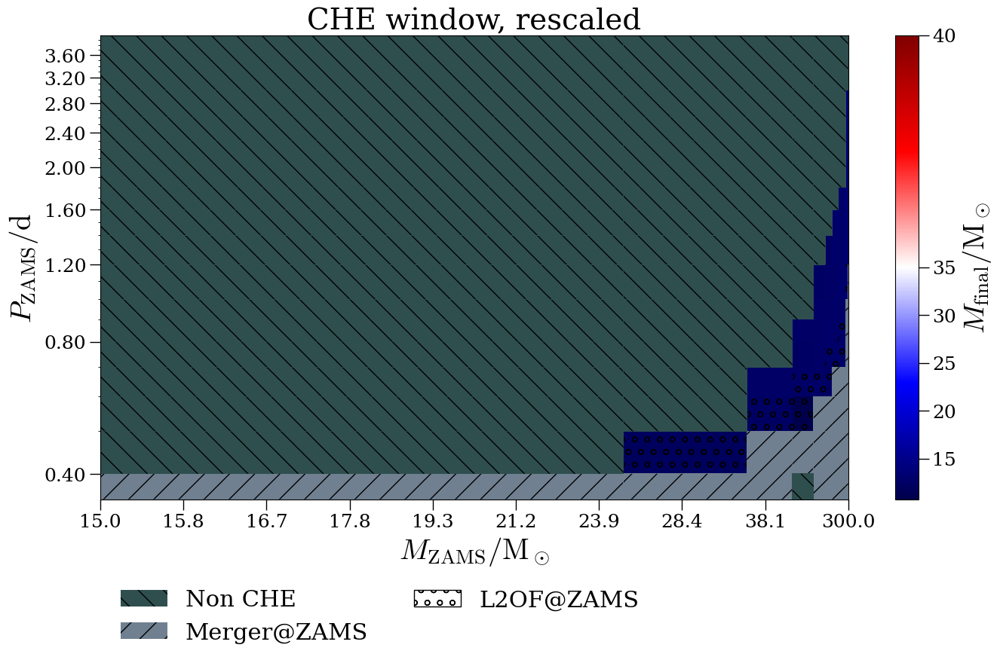

In [746]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(15), mass_forward(300), 10)])

ax.set_xlim(15, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled')

savefig(fig, f'che_window_rescaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


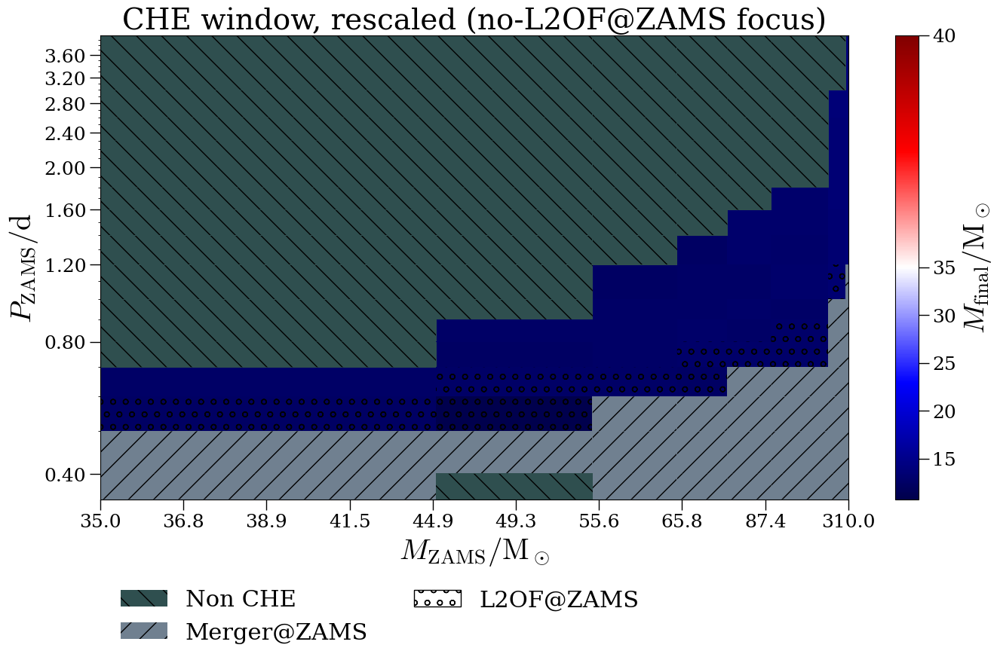

In [747]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(35), mass_forward(310), 10)])

ax.set_xlim(35, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled (no-L2OF@ZAMS focus)')

savefig(fig, f'che_window_rescaled_no_l2of_{zkey}zsun')

In [748]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 0] 
    r_arr = final_mass_array[:, i, 6] 

    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
        
    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
            
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_mcore_interpolator_dict = interpolator_dict

In [749]:
def l2_mzams_mcore_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_mcore_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value='extrapolate'
    )
    
    m_core = interpolator(m_zams)
    
    return m_core  

In [750]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 6] 
    r_arr = final_mass_array[:, i, 6] 
    
    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]

    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
    
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_rzams_interpolator_dict = interpolator_dict

In [751]:
def l2_mzams_rzams_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_rzams_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value=nan
    )
    
    m_core = interpolator(m_zams)
    
    return m_core      

In [752]:
def draw_mass_sample(
    res=int(1e7),
    min_m=20,
    max_m=300,
    min_p=0.1,
    max_p=4,
    min_mfinal=20,
    max_mfinal=50,
    mfinal_bin_width=0.2
):
    sample_masses = np.linspace(min_m, max_m, res)
    sample_probs = sample_masses**-2.3/np.sum(sample_masses**-2.3)
    sample_masses = np.random.choice(sample_masses, p=sample_probs, size=int(res/100))

    sample_periods = np.linspace(np.log10(min_p), np.log10(max_p), res)
    sample_probs = np.ones(res)/res
    sample_periods = 10.**np.random.choice(sample_periods, p=sample_probs, size=int(res/100))

    sample_zams_rs = np.array([l2_mzams_rzams_interpolator(m, p) for m, p in zip(sample_masses, sample_periods)])

    sample_mcores = np.zeros(int(res/100))

    sample_ = np.array([sample_masses, sample_periods, sample_zams_rs, sample_mcores]).T
    zams_l2of_sample = set_mcores(sample_).copy()
    
    mass_draw = zams_l2of_sample[:, 3]
    mass_draw = mass_draw[~np.isnan(mass_draw)]

    bins = np.arange(min_mfinal, max_mfinal+mfinal_bin_width, mfinal_bin_width)
    hist, bins = np.histogram(mass_draw, density=True, bins=bins)
    centers = np.array([(bin0+bin1)/2 for bin0, bin1 in zip(bins[:-1], bins[1:])])
    mode = centers[np.argmax(hist)]
    
    return zams_l2of_sample, mode

In [753]:
result06 = draw_mass_sample(res=res)

/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


In [754]:
result = result06

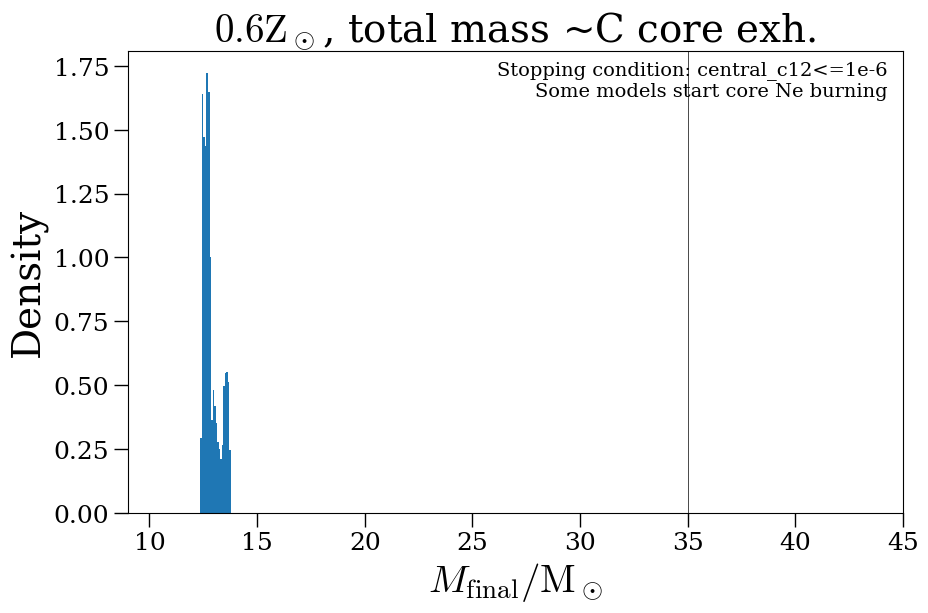

In [755]:
fig, ax = plt.subplots(figsize=(10,6))

h, bins, patches = ax.hist(result[0][:,3], density=True, bins=20)

ax.vlines(35, 0, max(h)*1.05, color='k', lw=0.5)
ax.set_ylim(0, max(h)*1.05)
ax.set_xlim(9, 45)
#ax.set_xticks(np.arange(30, 50, 2.5))

ax.set_ylabel('Density')
ax.set_xlabel('$M_\\mathrm{final}/\mathrm{M}_\odot$')
ax.set_title(f'${zkey}\\mathrm{{Z}}_\\odot$, total mass ~C core exh.')

note = '\n'.join(('Stopping condition: central_c12<=1e-6',
                  'Some models start core Ne burning'))
ax.text(0.98, 
        0.98, 
        note,
        transform=ax.transAxes,
        ha='right',
        va='top',
        fontsize=14
        )

savefig(fig, f'mfinal_distr_{zkey}zsun')


## $0.8\mathrm{Z}_\odot$

In [756]:
zkey = '0.8'

model_dicts = all_model_dicts[zkey]
final_mass_array = final_core_prop_array_dict[zkey]

# Select models
models_to_plot = np.arange(0, len(model_dicts), 1)
model_dict_list = model_dicts[models_to_plot]
print(f'Loading {model_dict_list}')

# Collect periods
all_periods = []
for dict_ in model_dict_list:
    for k1 in dict_.keys():
        for k2 in dict_[k1].keys():
            all_periods.append(k2)
all_periods = np.unique(all_periods)
all_periods = all_periods[np.argsort([float(p) for p in all_periods])]
print(all_periods)

mass_guide_str = [list(dict_.keys())[0] for dict_ in model_dict_list]
mass_guide_float = np.array([float(m) for m in mass_guide_str])

period_guide_str = all_periods
period_guide_float = np.array([float(p) for p in period_guide_str])

Loading [{'20.0': {'2.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.600d+00_w2.797d-05'), '4.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d+00_w1.818d-05'), '0.40': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d-01_w1.818d-04'), '2.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.000d+00_w3.636d-05'), '0.70': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p7.000d-01_w1.039d-04'), '1.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/04_ZdivZsun_8d-1/001_md1_m20

/tmp/ipykernel_1635975/3182167842.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=0, hspace=0)
/tmp/ipykernel_1635975/3646536049.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


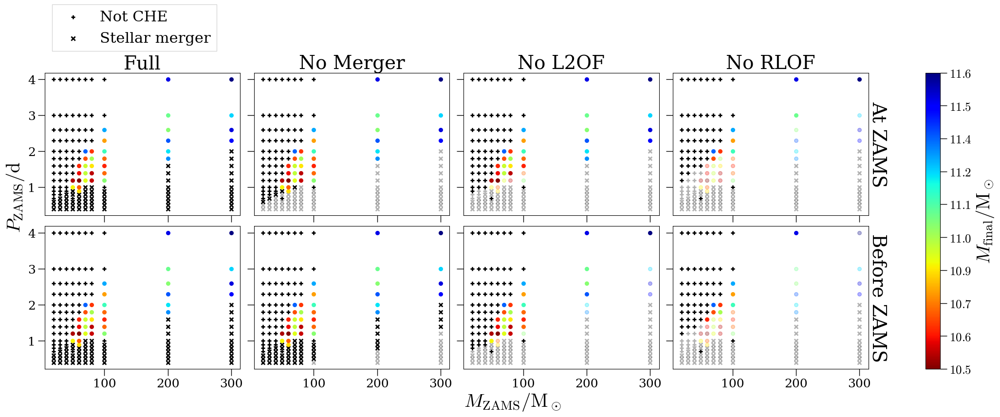

In [757]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True, layout='constrained')
fig.subplots_adjust(wspace=0, hspace=0)

plot_ps = np.linspace(0, 4, 100)

min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)  

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
             
of_kind = 'RL'
ax = axes[1, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
           
fig.text(0, 0.5, '$P_\\mathrm{ZAMS}/\\mathrm{d}$', rotation=90, ha='right', va='center')
fig.text(0.5, 0, '$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

sm = ScalarMappable(Normalize(vmin=np.log10(min_mcore), vmax=np.log10(max_mcore)), cm.jet_r)
cbar = fig.colorbar(sm, ax=axes[:,3], pad=0.2)
cbar.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')
cbar.set_ticks(np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10))
cbar.set_ticklabels([f'${10**logm:.1f}$' for logm in np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10)])

handles = []
handles.append(ax.scatter([], [], marker='+', color='k', label='Not CHE'))
handles.append(ax.scatter([], [], marker='x', color='k', label='Stellar merger'))
axes[0,0].legend(handles=handles, fancybox=False, loc='lower left', bbox_to_anchor=(0, 1.1))

savefig(fig, f'che_window_{zkey}zsun')

In [758]:
min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
mcore_norm = TwoSlopeNorm(vmin=min(30, min_mcore), vmax=max(max_mcore, 40), vcenter=35.)
nonche_c = to_rgba('darkslategrey')
crit_c = to_rgba('slategrey')
cmap = cm.seismic
def mcore_cmap(x): return cmap(mcore_norm(x))

In [759]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
zams_l2of_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = mcore_cmap(mcore)
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
        else:
            mcore_arr[i_m, i_p, :] = nonche_c

        rzams = final_mass_array[i_p, i_m, 6]
        is_l2of = is_of(r=rzams, m=m1, p=p1, q=1, kind='L2')
        if is_l2of:
            zams_l2of_arr[i_m, i_p, :] = [0, 0, 0, 0]
        else:
            zams_l2of_arr[i_m, i_p, :] = 4*[nan]
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

color_mcore_arr = mcore_arr
color_m_arr = m_arr
color_p_arr = p_arr

In [760]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_crit_mcore_arr = mcore_arr
hatch_crit_m_arr = m_arr
hatch_crit_p_arr = p_arr

In [761]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = nonche_c
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_nonche_mcore_arr = mcore_arr
hatch_nonche_m_arr = m_arr
hatch_nonche_p_arr = p_arr

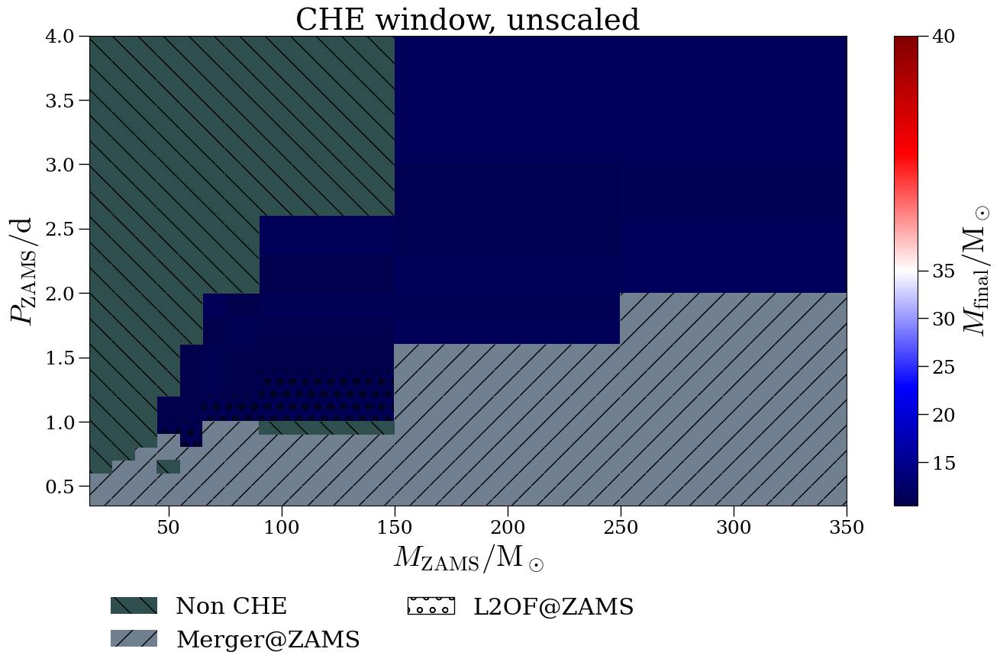

In [762]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_title('CHE window, unscaled')

savefig(fig,f'che_window_unscaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


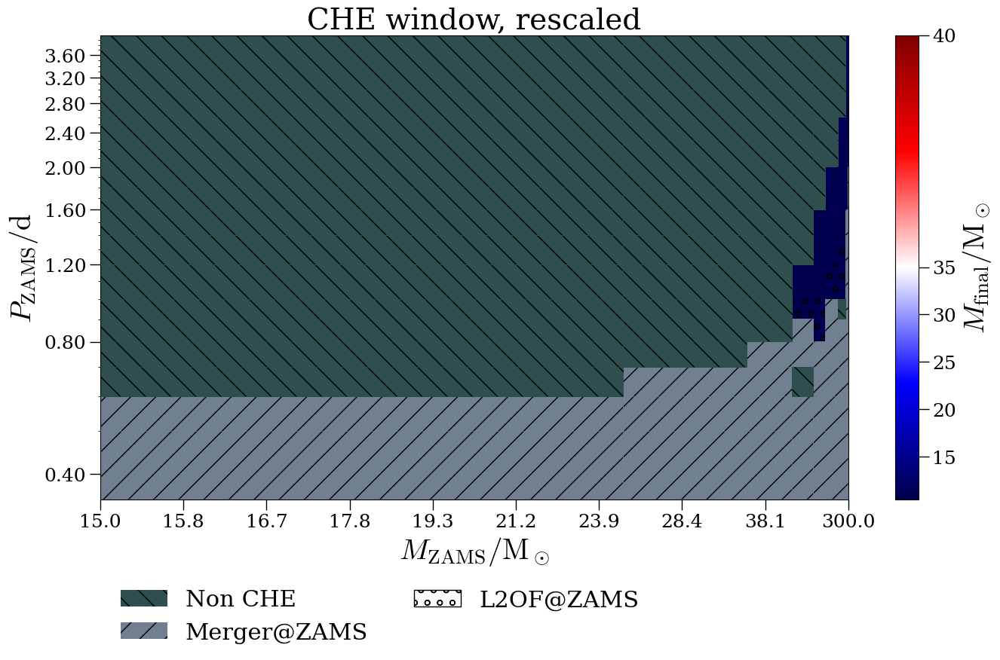

In [763]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(15), mass_forward(300), 10)])

ax.set_xlim(15, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled')

savefig(fig, f'che_window_rescaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


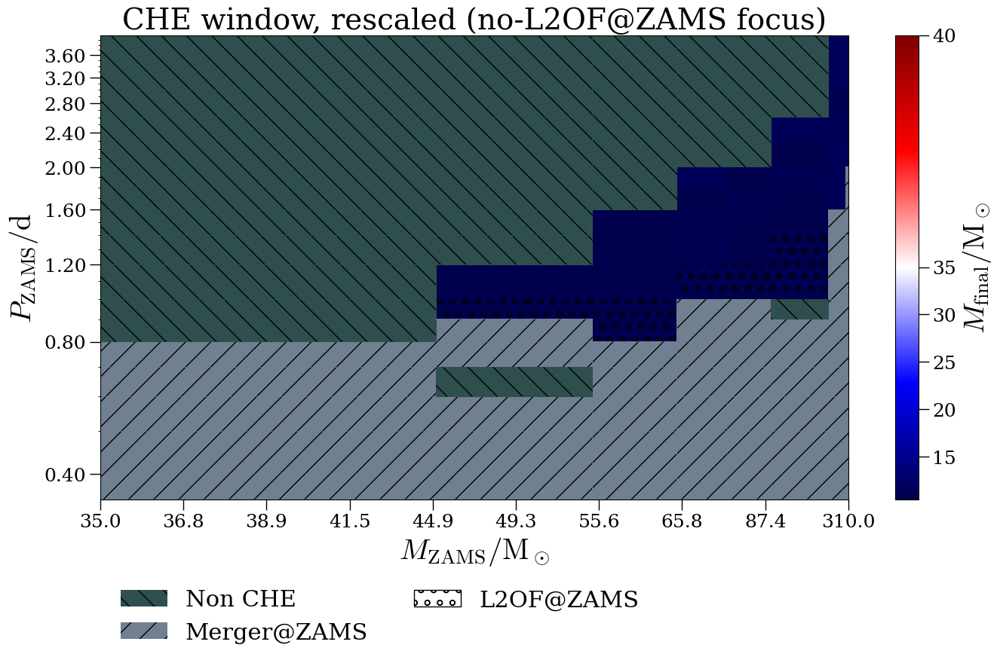

In [764]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(35), mass_forward(310), 10)])

ax.set_xlim(35, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled (no-L2OF@ZAMS focus)')

savefig(fig, f'che_window_rescaled_no_l2of_{zkey}zsun')

In [765]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 0] 
    r_arr = final_mass_array[:, i, 6] 

    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
        
    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
            
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_mcore_interpolator_dict = interpolator_dict

In [766]:
def l2_mzams_mcore_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_mcore_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value='extrapolate'
    )
    
    m_core = interpolator(m_zams)
    
    return m_core  

In [767]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 6] 
    r_arr = final_mass_array[:, i, 6] 
    
    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]

    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
    
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_rzams_interpolator_dict = interpolator_dict

In [768]:
def l2_mzams_rzams_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_rzams_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value=nan
    )
    
    m_core = interpolator(m_zams)
    
    return m_core      

In [769]:
def draw_mass_sample(
    res=int(1e7),
    min_m=20,
    max_m=300,
    min_p=0.1,
    max_p=4,
    min_mfinal=20,
    max_mfinal=50,
    mfinal_bin_width=0.2
):
    sample_masses = np.linspace(min_m, max_m, res)
    sample_probs = sample_masses**-2.3/np.sum(sample_masses**-2.3)
    sample_masses = np.random.choice(sample_masses, p=sample_probs, size=int(res/100))

    sample_periods = np.linspace(np.log10(min_p), np.log10(max_p), res)
    sample_probs = np.ones(res)/res
    sample_periods = 10.**np.random.choice(sample_periods, p=sample_probs, size=int(res/100))

    sample_zams_rs = np.array([l2_mzams_rzams_interpolator(m, p) for m, p in zip(sample_masses, sample_periods)])

    sample_mcores = np.zeros(int(res/100))

    sample_ = np.array([sample_masses, sample_periods, sample_zams_rs, sample_mcores]).T
    zams_l2of_sample = set_mcores(sample_).copy()
    
    mass_draw = zams_l2of_sample[:, 3]
    mass_draw = mass_draw[~np.isnan(mass_draw)]

    bins = np.arange(min_mfinal, max_mfinal+mfinal_bin_width, mfinal_bin_width)
    hist, bins = np.histogram(mass_draw, density=True, bins=bins)
    centers = np.array([(bin0+bin1)/2 for bin0, bin1 in zip(bins[:-1], bins[1:])])
    mode = centers[np.argmax(hist)]
    
    return zams_l2of_sample, mode

In [770]:
result08 = draw_mass_sample(res=res)

/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


In [771]:
result = result08

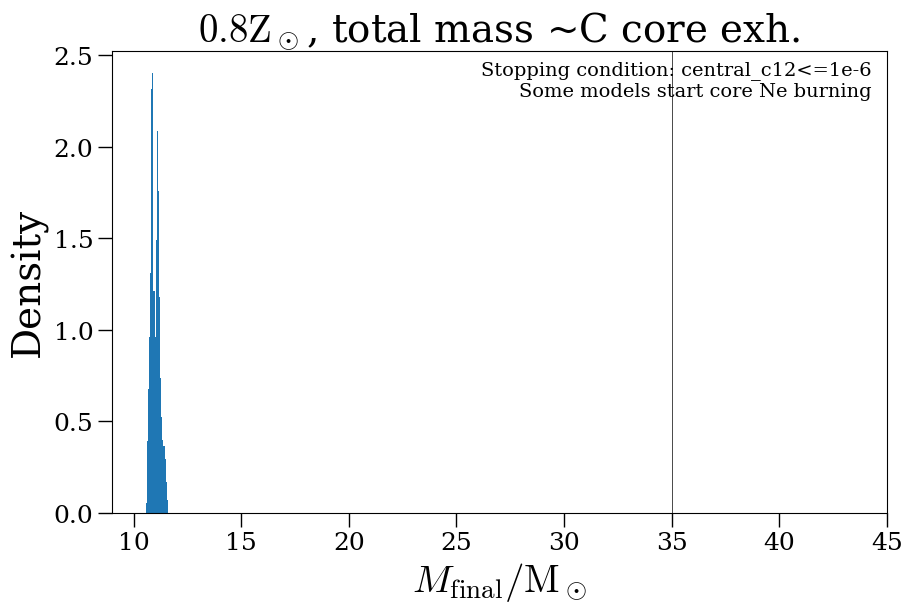

In [772]:
fig, ax = plt.subplots(figsize=(10,6))

h, bins, patches = ax.hist(result[0][:,3], density=True, bins=20)

ax.vlines(35, 0, max(h)*1.05, color='k', lw=0.5)
ax.set_ylim(0, max(h)*1.05)
ax.set_xlim(9, 45)
#ax.set_xticks(np.arange(30, 50, 2.5))

ax.set_ylabel('Density')
ax.set_xlabel('$M_\\mathrm{final}/\mathrm{M}_\odot$')
ax.set_title(f'${zkey}\\mathrm{{Z}}_\\odot$, total mass ~C core exh.')

note = '\n'.join(('Stopping condition: central_c12<=1e-6',
                  'Some models start core Ne burning'))
ax.text(0.98, 
        0.98, 
        note,
        transform=ax.transAxes,
        ha='right',
        va='top',
        fontsize=14
        )

savefig(fig, f'mfinal_distr_{zkey}zsun')


## $1.0\mathrm{Z}_\odot$

In [773]:
zkey = '1.0'

model_dicts = all_model_dicts[zkey]
final_mass_array = final_core_prop_array_dict[zkey]

# Select models
models_to_plot = np.arange(0, len(model_dicts), 1)
model_dict_list = model_dicts[models_to_plot]
print(f'Loading {model_dict_list}')

# Collect periods
all_periods = []
for dict_ in model_dict_list:
    for k1 in dict_.keys():
        for k2 in dict_[k1].keys():
            all_periods.append(k2)
all_periods = np.unique(all_periods)
all_periods = all_periods[np.argsort([float(p) for p in all_periods])]
print(all_periods)

mass_guide_str = [list(dict_.keys())[0] for dict_ in model_dict_list]
mass_guide_float = np.array([float(m) for m in mass_guide_str])

period_guide_str = all_periods
period_guide_float = np.array([float(p) for p in period_guide_str])

Loading [{'20.0': {'2.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/05_ZdivZsun_1d0/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.600d+00_w2.797d-05'), '4.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/05_ZdivZsun_1d0/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d+00_w1.818d-05'), '0.40': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/05_ZdivZsun_1d0/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d-01_w1.818d-04'), '2.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/05_ZdivZsun_1d0/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.000d+00_w3.636d-05'), '0.70': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/05_ZdivZsun_1d0/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p7.000d-01_w1.039d-04'), '1.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/05_ZdivZsun_1d0/001_md1_m20_zsund

/tmp/ipykernel_1635975/3182167842.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=0, hspace=0)
/tmp/ipykernel_1635975/3646536049.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


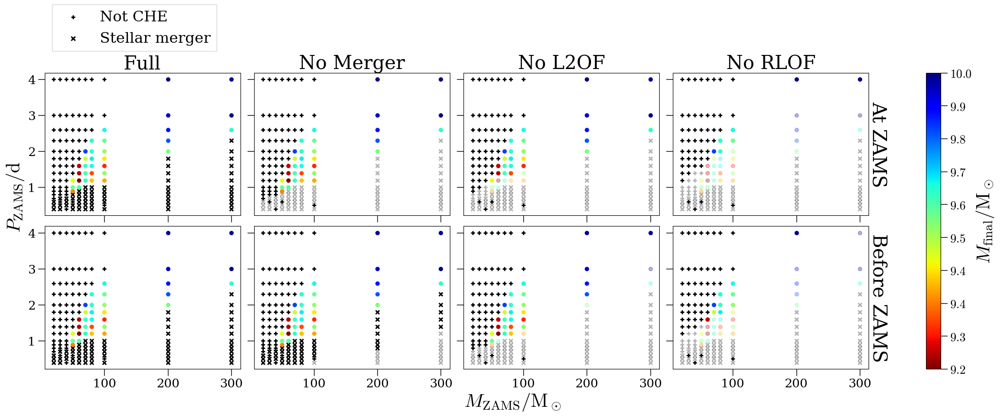

In [774]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True, layout='constrained')
fig.subplots_adjust(wspace=0, hspace=0)

plot_ps = np.linspace(0, 4, 100)

min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)  

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
             
of_kind = 'RL'
ax = axes[1, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
           
fig.text(0, 0.5, '$P_\\mathrm{ZAMS}/\\mathrm{d}$', rotation=90, ha='right', va='center')
fig.text(0.5, 0, '$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

sm = ScalarMappable(Normalize(vmin=np.log10(min_mcore), vmax=np.log10(max_mcore)), cm.jet_r)
cbar = fig.colorbar(sm, ax=axes[:,3], pad=0.2)
cbar.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')
cbar.set_ticks(np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10))
cbar.set_ticklabels([f'${10**logm:.1f}$' for logm in np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10)])

handles = []
handles.append(ax.scatter([], [], marker='+', color='k', label='Not CHE'))
handles.append(ax.scatter([], [], marker='x', color='k', label='Stellar merger'))
axes[0,0].legend(handles=handles, fancybox=False, loc='lower left', bbox_to_anchor=(0, 1.1))

savefig(fig, f'che_window_{zkey}zsun')

In [775]:
min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
mcore_norm = TwoSlopeNorm(vmin=min(30, min_mcore), vmax=max(max_mcore, 40), vcenter=35.)
nonche_c = to_rgba('darkslategrey')
crit_c = to_rgba('slategrey')
cmap = cm.seismic
def mcore_cmap(x): return cmap(mcore_norm(x))

In [776]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
zams_l2of_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = mcore_cmap(mcore)
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
        else:
            mcore_arr[i_m, i_p, :] = nonche_c

        rzams = final_mass_array[i_p, i_m, 6]
        is_l2of = is_of(r=rzams, m=m1, p=p1, q=1, kind='L2')
        if is_l2of:
            zams_l2of_arr[i_m, i_p, :] = [0, 0, 0, 0]
        else:
            zams_l2of_arr[i_m, i_p, :] = 4*[nan]
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

color_mcore_arr = mcore_arr
color_m_arr = m_arr
color_p_arr = p_arr

In [777]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_crit_mcore_arr = mcore_arr
hatch_crit_m_arr = m_arr
hatch_crit_p_arr = p_arr

In [778]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = nonche_c
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_nonche_mcore_arr = mcore_arr
hatch_nonche_m_arr = m_arr
hatch_nonche_p_arr = p_arr

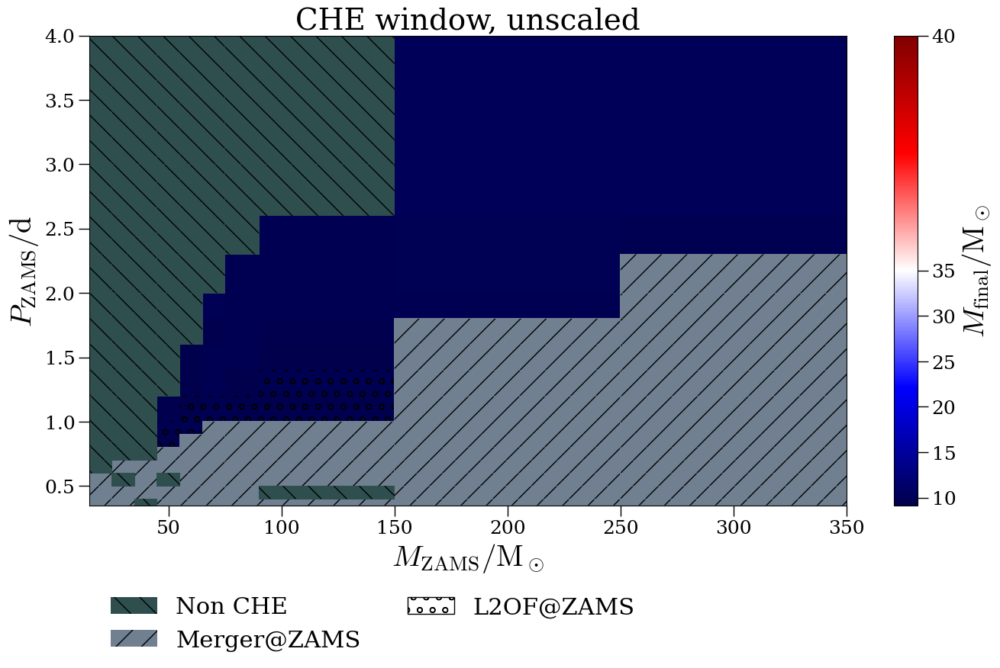

In [779]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_title('CHE window, unscaled')

savefig(fig,f'che_window_unscaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


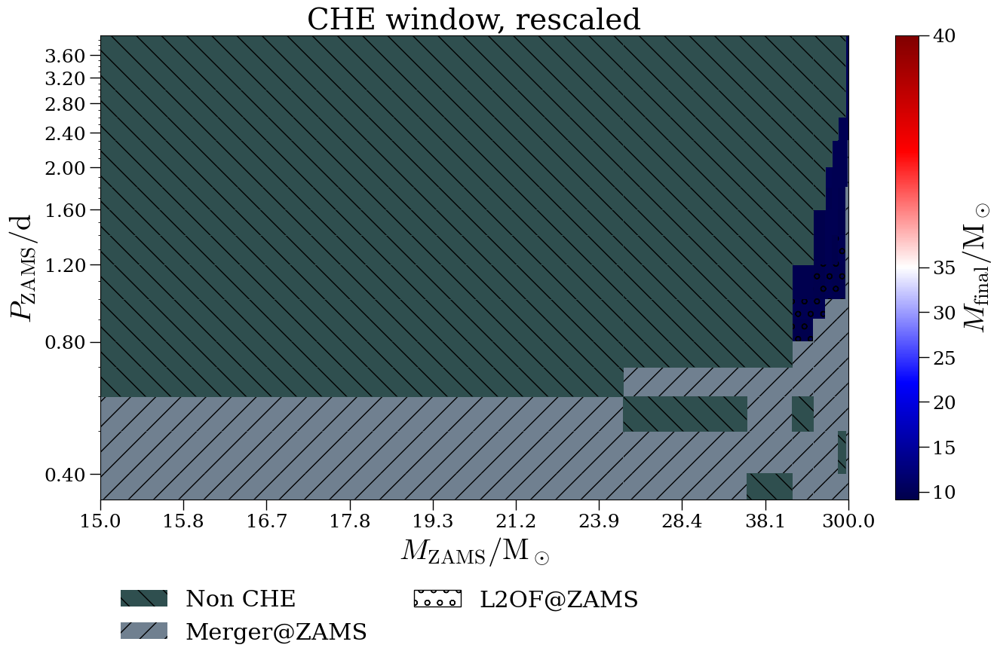

In [780]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(15), mass_forward(300), 10)])

ax.set_xlim(15, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled')

savefig(fig, f'che_window_rescaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


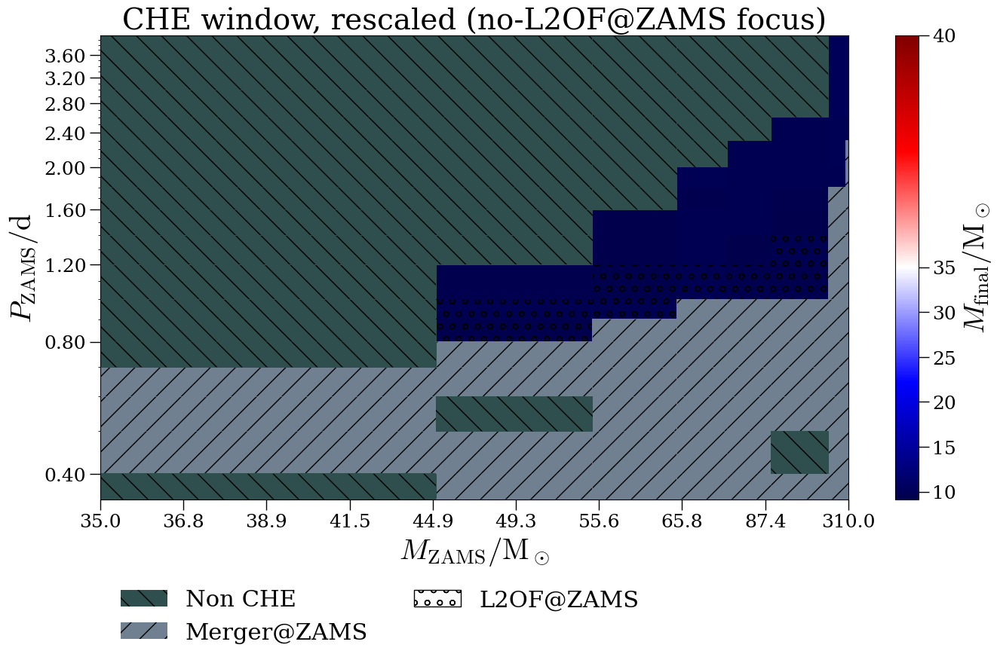

In [781]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(35), mass_forward(310), 10)])

ax.set_xlim(35, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled (no-L2OF@ZAMS focus)')

savefig(fig, f'che_window_rescaled_no_l2of_{zkey}zsun')

In [782]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 0] 
    r_arr = final_mass_array[:, i, 6] 

    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
        
    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
            
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_mcore_interpolator_dict = interpolator_dict

In [783]:
def l2_mzams_mcore_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_mcore_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value='extrapolate'
    )
    
    m_core = interpolator(m_zams)
    
    return m_core  

In [784]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 6] 
    r_arr = final_mass_array[:, i, 6] 
    
    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]

    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
    
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_rzams_interpolator_dict = interpolator_dict

In [785]:
def l2_mzams_rzams_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_rzams_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value=nan
    )
    
    m_core = interpolator(m_zams)
    
    return m_core      

In [786]:
def draw_mass_sample(
    res=int(1e7),
    min_m=20,
    max_m=300,
    min_p=0.1,
    max_p=4,
    min_mfinal=20,
    max_mfinal=50,
    mfinal_bin_width=0.2
):
    sample_masses = np.linspace(min_m, max_m, res)
    sample_probs = sample_masses**-2.3/np.sum(sample_masses**-2.3)
    sample_masses = np.random.choice(sample_masses, p=sample_probs, size=int(res/100))

    sample_periods = np.linspace(np.log10(min_p), np.log10(max_p), res)
    sample_probs = np.ones(res)/res
    sample_periods = 10.**np.random.choice(sample_periods, p=sample_probs, size=int(res/100))

    sample_zams_rs = np.array([l2_mzams_rzams_interpolator(m, p) for m, p in zip(sample_masses, sample_periods)])

    sample_mcores = np.zeros(int(res/100))

    sample_ = np.array([sample_masses, sample_periods, sample_zams_rs, sample_mcores]).T
    zams_l2of_sample = set_mcores(sample_).copy()
    
    mass_draw = zams_l2of_sample[:, 3]
    mass_draw = mass_draw[~np.isnan(mass_draw)]

    bins = np.arange(min_mfinal, max_mfinal+mfinal_bin_width, mfinal_bin_width)
    hist, bins = np.histogram(mass_draw, density=True, bins=bins)
    centers = np.array([(bin0+bin1)/2 for bin0, bin1 in zip(bins[:-1], bins[1:])])
    mode = centers[np.argmax(hist)]
    
    return zams_l2of_sample, mode

In [787]:
result10 = draw_mass_sample(res=res)

/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


In [788]:
result = result10

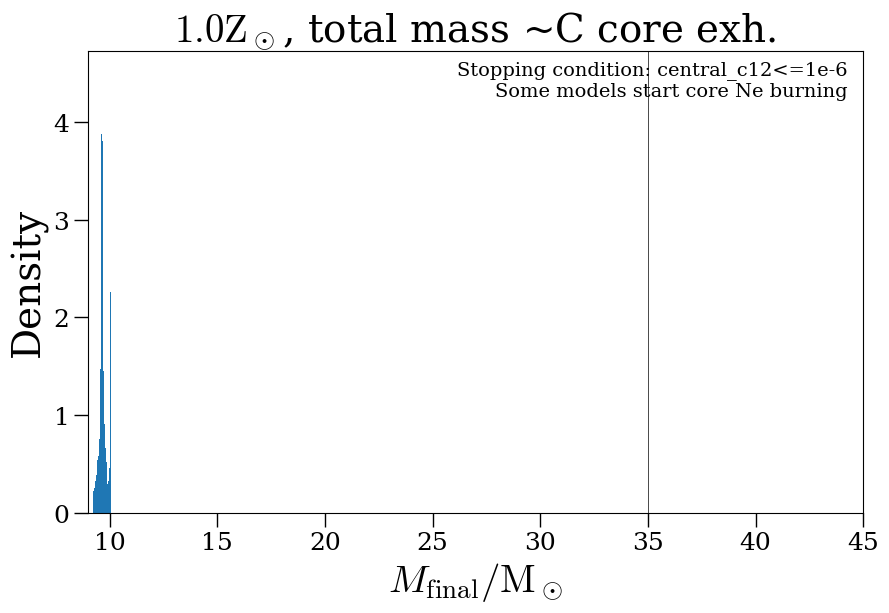

In [789]:
fig, ax = plt.subplots(figsize=(10,6))

h, bins, patches = ax.hist(result[0][:,3], density=True, bins=20)

ax.vlines(35, 0, max(h)*1.05, color='k', lw=0.5)
ax.set_ylim(0, max(h)*1.05)
ax.set_xlim(9, 45)
#ax.set_xticks(np.arange(30, 50, 2.5))

ax.set_ylabel('Density')
ax.set_xlabel('$M_\\mathrm{final}/\mathrm{M}_\odot$')
ax.set_title(f'${zkey}\\mathrm{{Z}}_\\odot$, total mass ~C core exh.')

note = '\n'.join(('Stopping condition: central_c12<=1e-6',
                  'Some models start core Ne burning'))
ax.text(0.98, 
        0.98, 
        note,
        transform=ax.transAxes,
        ha='right',
        va='top',
        fontsize=14
        )

savefig(fig, f'mfinal_distr_{zkey}zsun')


## $0.05\mathrm{Z}_\odot$

In [38]:
zkey = '0.05'

model_dicts = all_model_dicts[zkey]
final_mass_array = final_core_prop_array_dict[zkey]

# Select models
models_to_plot = np.arange(0, len(model_dicts), 1)
model_dict_list = model_dicts[models_to_plot]
print(f'Loading {model_dict_list}')

# Collect periods
all_periods = []
for dict_ in model_dict_list:
    for k1 in dict_.keys():
        for k2 in dict_[k1].keys():
            all_periods.append(k2)
all_periods = np.unique(all_periods)
all_periods = all_periods[np.argsort([float(p) for p in all_periods])]
print(all_periods)

mass_guide_str = [list(dict_.keys())[0] for dict_ in model_dict_list]
mass_guide_float = np.array([float(m) for m in mass_guide_str])

period_guide_str = all_periods
period_guide_float = np.array([float(p) for p in period_guide_str])

Loading [{'20.0': {'2.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/06_ZdivZsun_5d-2/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.600d+00_w2.797d-05'), '4.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/06_ZdivZsun_5d-2/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d+00_w1.818d-05'), '0.40': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/06_ZdivZsun_5d-2/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d-01_w1.818d-04'), '2.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/06_ZdivZsun_5d-2/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.000d+00_w3.636d-05'), '0.70': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/06_ZdivZsun_5d-2/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p7.000d-01_w1.039d-04'), '1.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/06_ZdivZsun_5d-2/001_md1_m20

/tmp/ipykernel_3126593/3182167842.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=0, hspace=0)
/tmp/ipykernel_3126593/3646536049.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


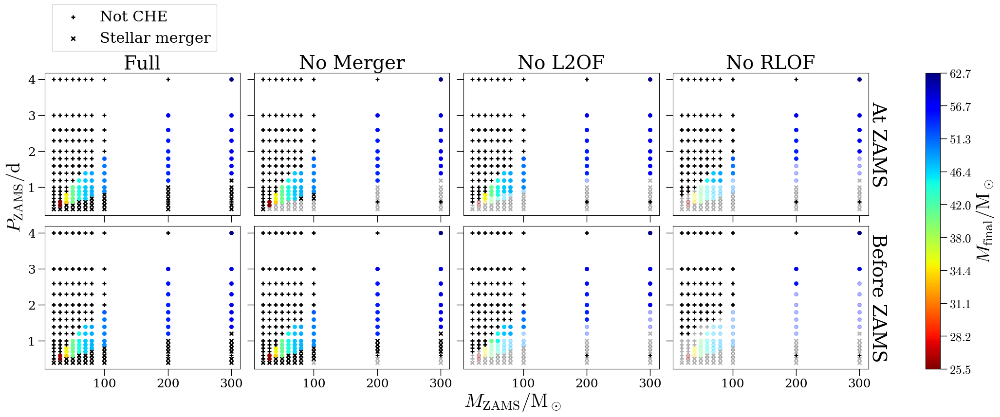

In [39]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True, layout='constrained')
fig.subplots_adjust(wspace=0, hspace=0)

plot_ps = np.linspace(0, 4, 100)

min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)  

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
             
of_kind = 'RL'
ax = axes[1, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
           
fig.text(0, 0.5, '$P_\\mathrm{ZAMS}/\\mathrm{d}$', rotation=90, ha='right', va='center')
fig.text(0.5, 0, '$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

sm = ScalarMappable(Normalize(vmin=np.log10(min_mcore), vmax=np.log10(max_mcore)), cm.jet_r)
cbar = fig.colorbar(sm, ax=axes[:,3], pad=0.2)
cbar.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')
cbar.set_ticks(np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10))
cbar.set_ticklabels([f'${10**logm:.1f}$' for logm in np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10)])

handles = []
handles.append(ax.scatter([], [], marker='+', color='k', label='Not CHE'))
handles.append(ax.scatter([], [], marker='x', color='k', label='Stellar merger'))
axes[0,0].legend(handles=handles, fancybox=False, loc='lower left', bbox_to_anchor=(0, 1.1))

savefig(fig, f'che_window_{zkey}zsun')

In [40]:
min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
mcore_norm = TwoSlopeNorm(vmin=min(30, min_mcore), vmax=max(max_mcore, 40), vcenter=35.)
nonche_c = to_rgba('darkslategrey')
crit_c = to_rgba('slategrey')
cmap = cm.seismic
def mcore_cmap(x): return cmap(mcore_norm(x))

In [41]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
zams_l2of_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = mcore_cmap(mcore)
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
        else:
            mcore_arr[i_m, i_p, :] = nonche_c

        rzams = final_mass_array[i_p, i_m, 6]
        is_l2of = is_of(r=rzams, m=m1, p=p1, q=1, kind='L2')
        if is_l2of:
            zams_l2of_arr[i_m, i_p, :] = [0, 0, 0, 0]
        else:
            zams_l2of_arr[i_m, i_p, :] = 4*[nan]
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

color_mcore_arr = mcore_arr
color_m_arr = m_arr
color_p_arr = p_arr

In [42]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_crit_mcore_arr = mcore_arr
hatch_crit_m_arr = m_arr
hatch_crit_p_arr = p_arr

In [43]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = nonche_c
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_nonche_mcore_arr = mcore_arr
hatch_nonche_m_arr = m_arr
hatch_nonche_p_arr = p_arr

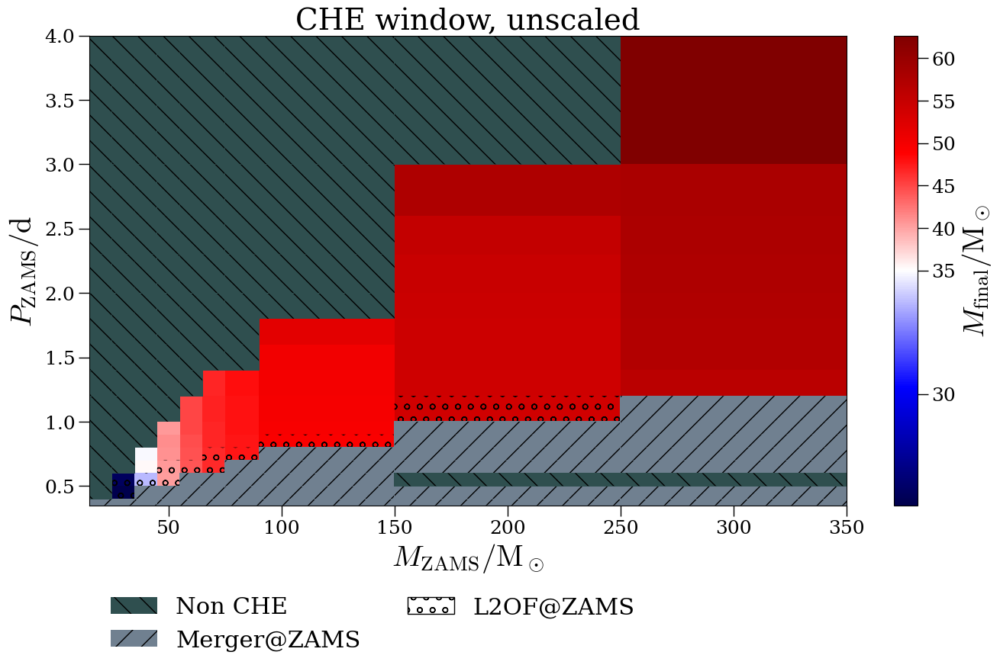

In [49]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_title('CHE window, unscaled')

savefig(fig,f'che_window_unscaled_{zkey}zsun')

/tmp/ipykernel_3126593/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_3126593/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


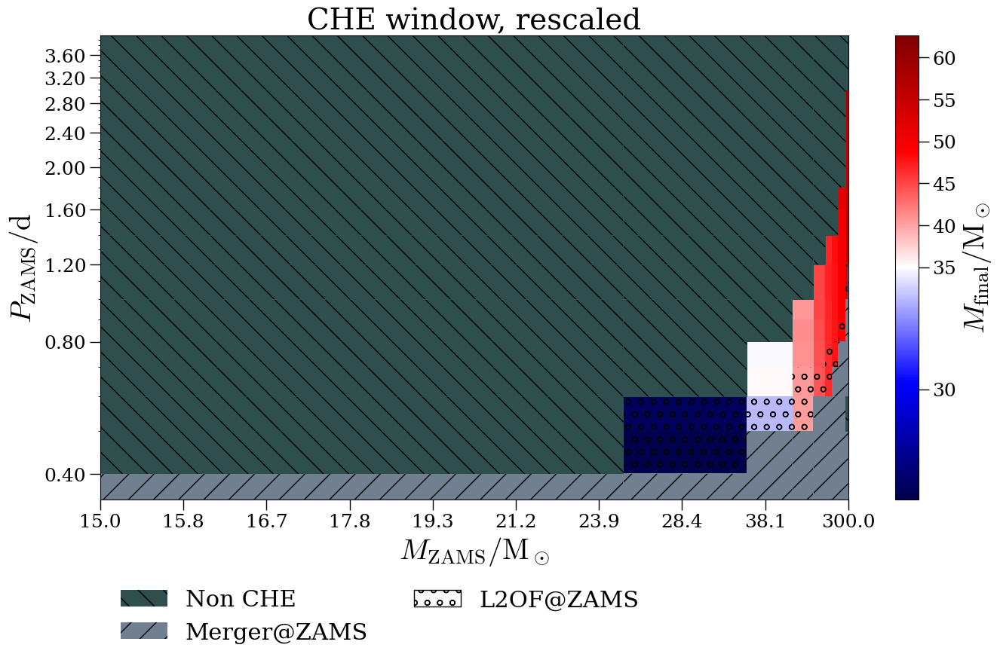

In [50]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(15), mass_forward(300), 10)])

ax.set_xlim(15, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled')

savefig(fig, f'che_window_rescaled_{zkey}zsun')

/tmp/ipykernel_3126593/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_3126593/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


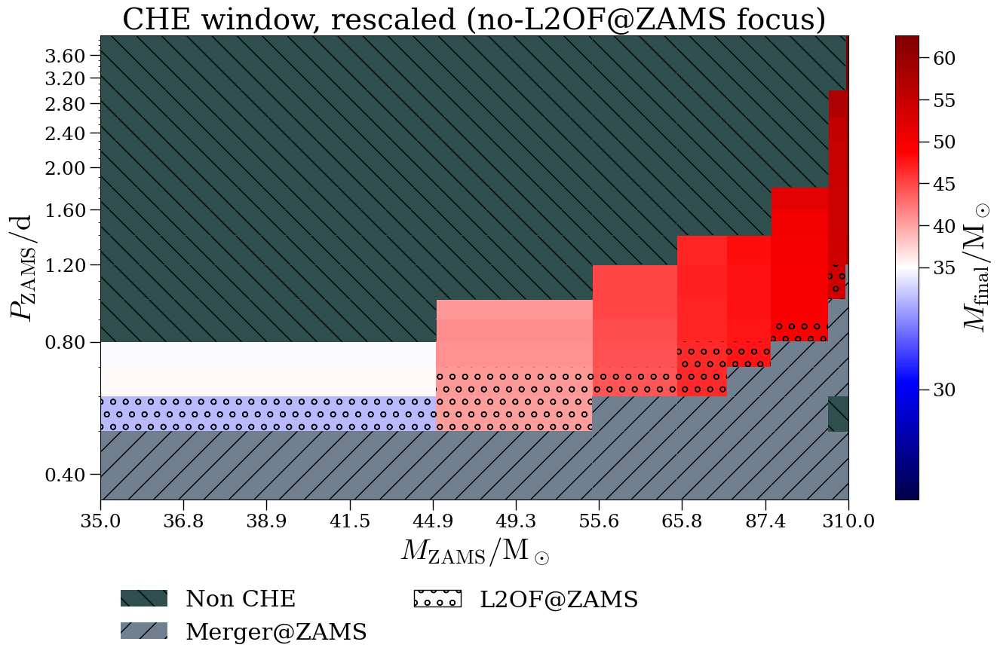

In [51]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(35), mass_forward(310), 10)])

ax.set_xlim(35, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled (no-L2OF@ZAMS focus)')

savefig(fig, f'che_window_rescaled_no_l2of_{zkey}zsun')

In [799]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 0] 
    r_arr = final_mass_array[:, i, 6] 

    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
        
    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
            
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_mcore_interpolator_dict = interpolator_dict

In [800]:
def l2_mzams_mcore_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_mcore_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value='extrapolate'
    )
    
    m_core = interpolator(m_zams)
    
    return m_core  

In [801]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 6] 
    r_arr = final_mass_array[:, i, 6] 
    
    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]

    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
    
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_rzams_interpolator_dict = interpolator_dict

In [802]:
def l2_mzams_rzams_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_rzams_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value=nan
    )
    
    m_core = interpolator(m_zams)
    
    return m_core      

In [803]:
def draw_mass_sample(
    res=int(1e7),
    min_m=20,
    max_m=300,
    min_p=0.1,
    max_p=4,
    min_mfinal=20,
    max_mfinal=50,
    mfinal_bin_width=0.2
):
    sample_masses = np.linspace(min_m, max_m, res)
    sample_probs = sample_masses**-2.3/np.sum(sample_masses**-2.3)
    sample_masses = np.random.choice(sample_masses, p=sample_probs, size=int(res/100))

    sample_periods = np.linspace(np.log10(min_p), np.log10(max_p), res)
    sample_probs = np.ones(res)/res
    sample_periods = 10.**np.random.choice(sample_periods, p=sample_probs, size=int(res/100))

    sample_zams_rs = np.array([l2_mzams_rzams_interpolator(m, p) for m, p in zip(sample_masses, sample_periods)])

    sample_mcores = np.zeros(int(res/100))

    sample_ = np.array([sample_masses, sample_periods, sample_zams_rs, sample_mcores]).T
    zams_l2of_sample = set_mcores(sample_).copy()
    
    mass_draw = zams_l2of_sample[:, 3]
    mass_draw = mass_draw[~np.isnan(mass_draw)]

    bins = np.arange(min_mfinal, max_mfinal+mfinal_bin_width, mfinal_bin_width)
    hist, bins = np.histogram(mass_draw, density=True, bins=bins)
    centers = np.array([(bin0+bin1)/2 for bin0, bin1 in zip(bins[:-1], bins[1:])])
    mode = centers[np.argmax(hist)]
    
    return zams_l2of_sample, mode

In [804]:
result005 = draw_mass_sample(res=res)

In [805]:
result = result005

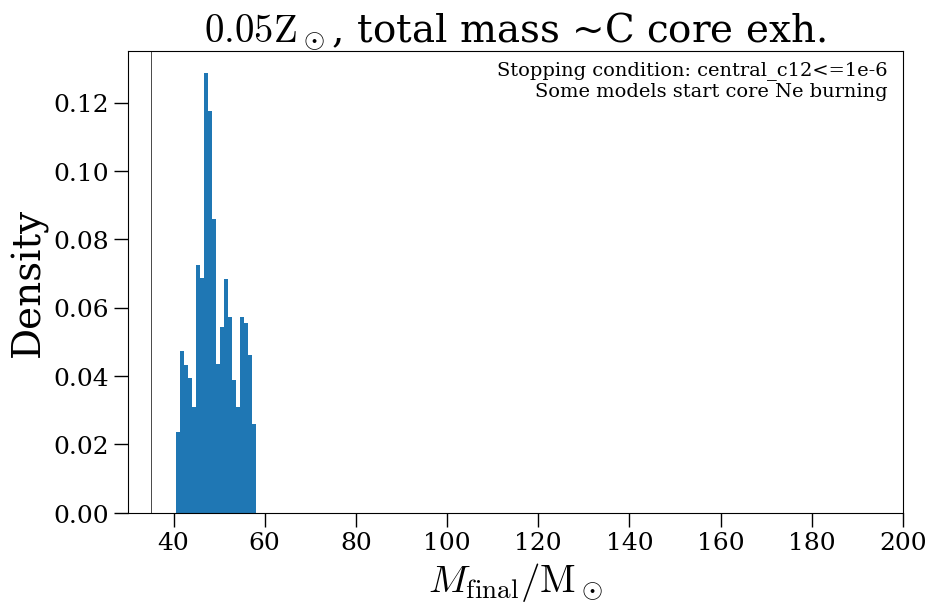

In [806]:
fig, ax = plt.subplots(figsize=(10,6))

h, bins, patches = ax.hist(result[0][:,3], density=True, bins=20)

ax.vlines(35, 0, max(h)*1.05, color='k', lw=0.5)
ax.set_ylim(0, max(h)*1.05)
ax.set_xlim(30, 200)
#ax.set_xticks(np.arange(30, 50, 2.5))

ax.set_ylabel('Density')
ax.set_xlabel('$M_\\mathrm{final}/\mathrm{M}_\odot$')
ax.set_title(f'${zkey}\\mathrm{{Z}}_\\odot$, total mass ~C core exh.')

note = '\n'.join(('Stopping condition: central_c12<=1e-6',
                  'Some models start core Ne burning'))
ax.text(0.98, 
        0.98, 
        note,
        transform=ax.transAxes,
        ha='right',
        va='top',
        fontsize=14
        )

savefig(fig, f'mfinal_distr_{zkey}zsun')


## $0.02\mathrm{Z}_\odot$

In [807]:
zkey = '0.02'

model_dicts = all_model_dicts[zkey]
final_mass_array = final_core_prop_array_dict[zkey]

# Select models
models_to_plot = np.arange(0, len(model_dicts), 1)
model_dict_list = model_dicts[models_to_plot]
print(f'Loading {model_dict_list}')

# Collect periods
all_periods = []
for dict_ in model_dict_list:
    for k1 in dict_.keys():
        for k2 in dict_[k1].keys():
            all_periods.append(k2)
all_periods = np.unique(all_periods)
all_periods = all_periods[np.argsort([float(p) for p in all_periods])]
print(all_periods)

mass_guide_str = [list(dict_.keys())[0] for dict_ in model_dict_list]
mass_guide_float = np.array([float(m) for m in mass_guide_str])

period_guide_str = all_periods
period_guide_float = np.array([float(p) for p in period_guide_str])

Loading [{'20.0': {'2.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/07_ZdivZsun_2d-2/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.600d+00_w2.797d-05'), '4.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/07_ZdivZsun_2d-2/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d+00_w1.818d-05'), '0.40': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/07_ZdivZsun_2d-2/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d-01_w1.818d-04'), '2.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/07_ZdivZsun_2d-2/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.000d+00_w3.636d-05'), '0.70': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/07_ZdivZsun_2d-2/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p7.000d-01_w1.039d-04'), '1.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/07_ZdivZsun_2d-2/001_md1_m20

/tmp/ipykernel_1635975/3182167842.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=0, hspace=0)
/tmp/ipykernel_1635975/3646536049.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


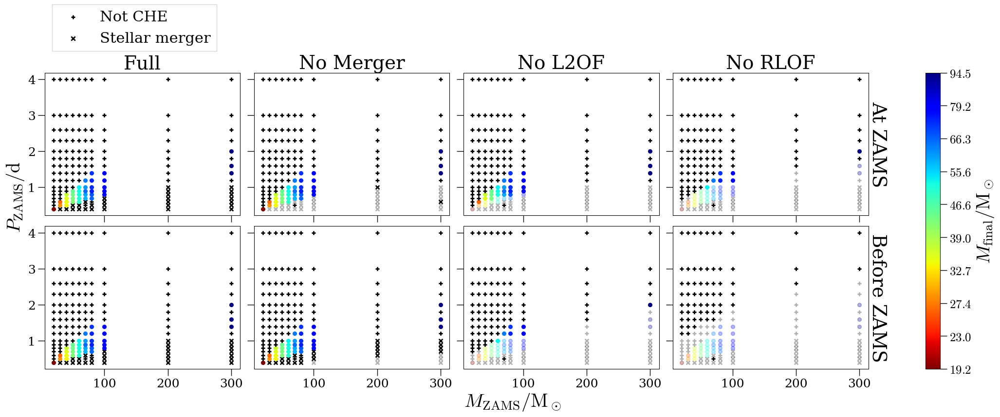

In [808]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True, layout='constrained')
fig.subplots_adjust(wspace=0, hspace=0)

plot_ps = np.linspace(0, 4, 100)

min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)  

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
             
of_kind = 'RL'
ax = axes[1, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
           
fig.text(0, 0.5, '$P_\\mathrm{ZAMS}/\\mathrm{d}$', rotation=90, ha='right', va='center')
fig.text(0.5, 0, '$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

sm = ScalarMappable(Normalize(vmin=np.log10(min_mcore), vmax=np.log10(max_mcore)), cm.jet_r)
cbar = fig.colorbar(sm, ax=axes[:,3], pad=0.2)
cbar.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')
cbar.set_ticks(np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10))
cbar.set_ticklabels([f'${10**logm:.1f}$' for logm in np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10)])

handles = []
handles.append(ax.scatter([], [], marker='+', color='k', label='Not CHE'))
handles.append(ax.scatter([], [], marker='x', color='k', label='Stellar merger'))
axes[0,0].legend(handles=handles, fancybox=False, loc='lower left', bbox_to_anchor=(0, 1.1))

savefig(fig, f'che_window_{zkey}zsun')

In [809]:
min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
mcore_norm = TwoSlopeNorm(vmin=min(30, min_mcore), vmax=max(max_mcore, 40), vcenter=35.)
nonche_c = to_rgba('darkslategrey')
crit_c = to_rgba('slategrey')
cmap = cm.seismic
def mcore_cmap(x): return cmap(mcore_norm(x))

In [810]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
zams_l2of_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = mcore_cmap(mcore)
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
        else:
            mcore_arr[i_m, i_p, :] = nonche_c

        rzams = final_mass_array[i_p, i_m, 6]
        is_l2of = is_of(r=rzams, m=m1, p=p1, q=1, kind='L2')
        if is_l2of:
            zams_l2of_arr[i_m, i_p, :] = [0, 0, 0, 0]
        else:
            zams_l2of_arr[i_m, i_p, :] = 4*[nan]
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

color_mcore_arr = mcore_arr
color_m_arr = m_arr
color_p_arr = p_arr

In [811]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_crit_mcore_arr = mcore_arr
hatch_crit_m_arr = m_arr
hatch_crit_p_arr = p_arr

In [812]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = nonche_c
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_nonche_mcore_arr = mcore_arr
hatch_nonche_m_arr = m_arr
hatch_nonche_p_arr = p_arr

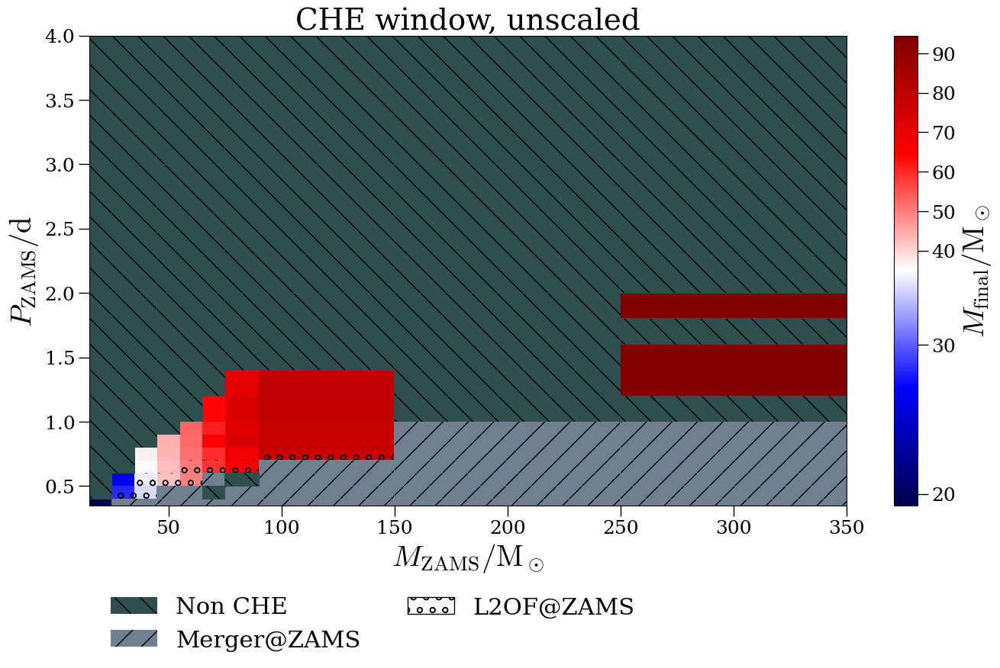

In [813]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_title('CHE window, unscaled')

savefig(fig,f'che_window_unscaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


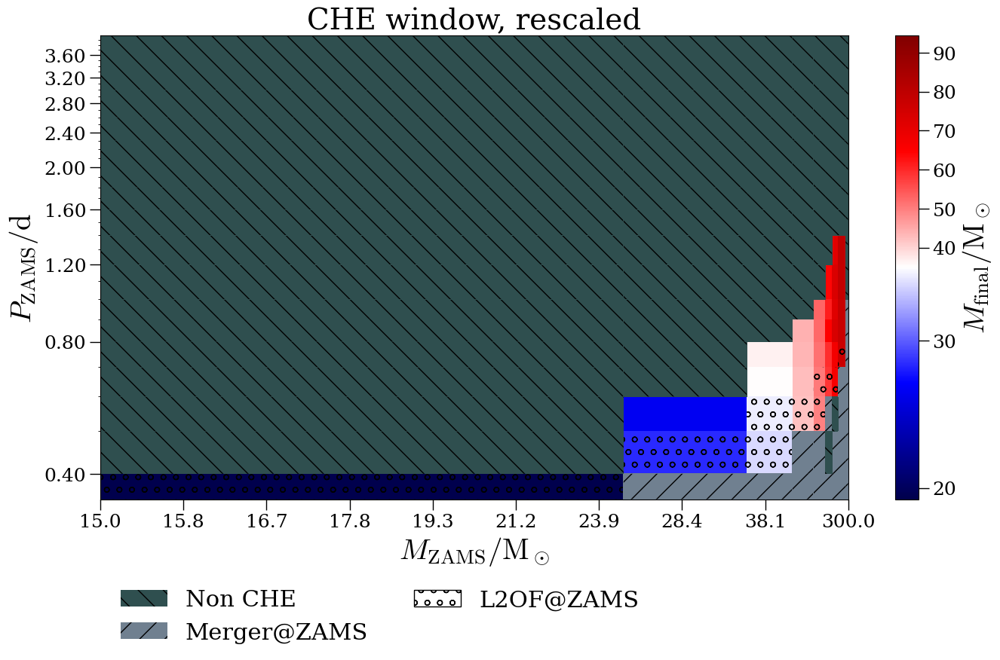

In [814]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(15), mass_forward(300), 10)])

ax.set_xlim(15, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled')

savefig(fig, f'che_window_rescaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


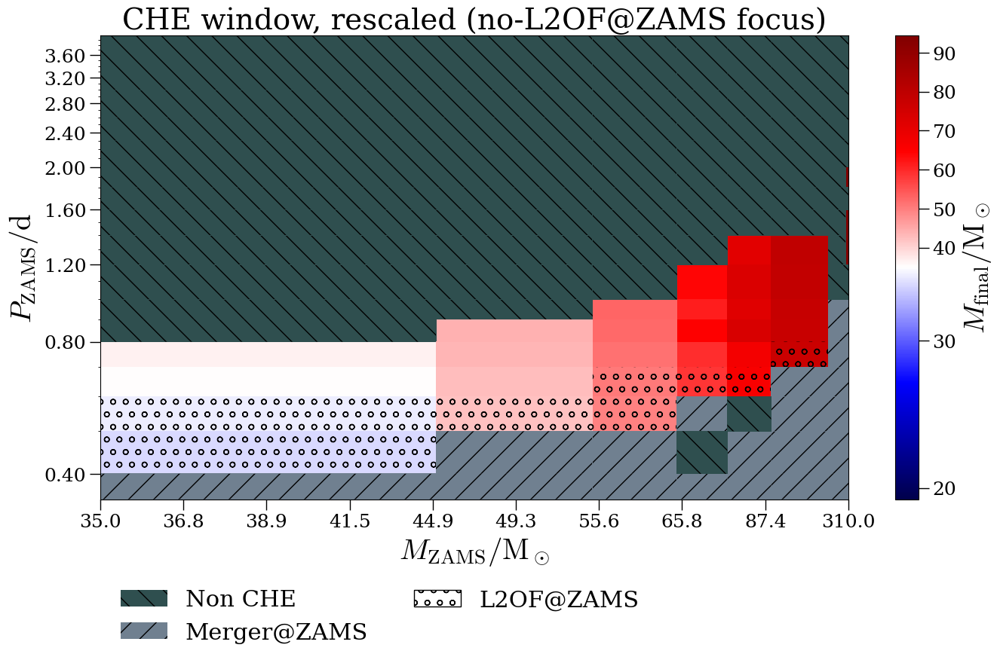

In [815]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(35), mass_forward(310), 10)])

ax.set_xlim(35, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled (no-L2OF@ZAMS focus)')

savefig(fig, f'che_window_rescaled_no_l2of_{zkey}zsun')

In [816]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 0] 
    r_arr = final_mass_array[:, i, 6] 

    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
        
    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
            
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_mcore_interpolator_dict = interpolator_dict

In [817]:
def l2_mzams_mcore_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_mcore_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value='extrapolate'
    )
    
    m_core = interpolator(m_zams)
    
    return m_core  

In [818]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 6] 
    r_arr = final_mass_array[:, i, 6] 
    
    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]

    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
    
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_rzams_interpolator_dict = interpolator_dict

In [819]:
def l2_mzams_rzams_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_rzams_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value=nan
    )
    
    m_core = interpolator(m_zams)
    
    return m_core      

In [820]:
def draw_mass_sample(
    res=int(1e7),
    min_m=20,
    max_m=300,
    min_p=0.1,
    max_p=4,
    min_mfinal=20,
    max_mfinal=50,
    mfinal_bin_width=0.2
):
    sample_masses = np.linspace(min_m, max_m, res)
    sample_probs = sample_masses**-2.3/np.sum(sample_masses**-2.3)
    sample_masses = np.random.choice(sample_masses, p=sample_probs, size=int(res/100))

    sample_periods = np.linspace(np.log10(min_p), np.log10(max_p), res)
    sample_probs = np.ones(res)/res
    sample_periods = 10.**np.random.choice(sample_periods, p=sample_probs, size=int(res/100))

    sample_zams_rs = np.array([l2_mzams_rzams_interpolator(m, p) for m, p in zip(sample_masses, sample_periods)])

    sample_mcores = np.zeros(int(res/100))

    sample_ = np.array([sample_masses, sample_periods, sample_zams_rs, sample_mcores]).T
    zams_l2of_sample = set_mcores(sample_).copy()
    
    mass_draw = zams_l2of_sample[:, 3]
    mass_draw = mass_draw[~np.isnan(mass_draw)]

    bins = np.arange(min_mfinal, max_mfinal+mfinal_bin_width, mfinal_bin_width)
    hist, bins = np.histogram(mass_draw, density=True, bins=bins)
    centers = np.array([(bin0+bin1)/2 for bin0, bin1 in zip(bins[:-1], bins[1:])])
    mode = centers[np.argmax(hist)]
    
    return zams_l2of_sample, mode

In [821]:
result002 = draw_mass_sample(res=res)

In [822]:
result = result002

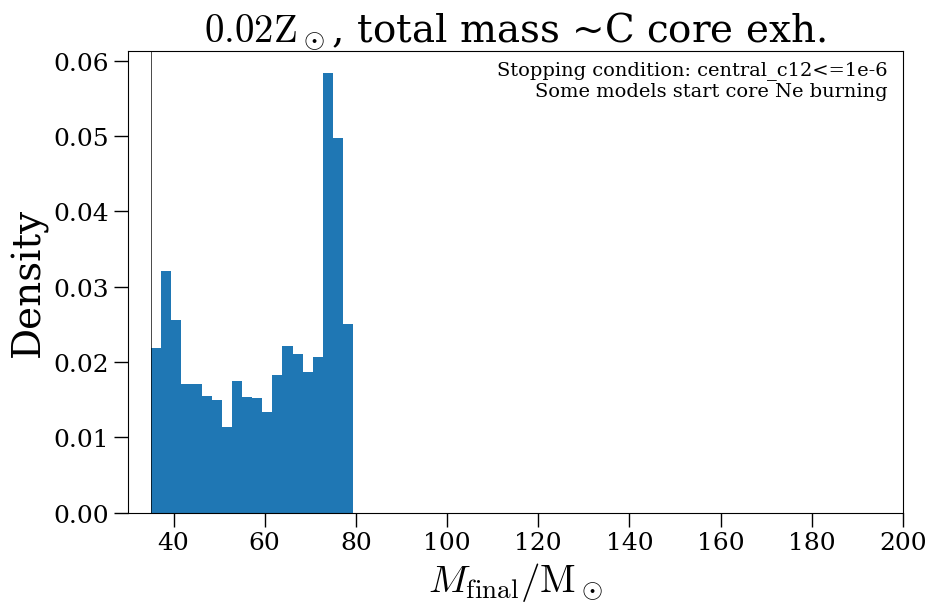

In [823]:
fig, ax = plt.subplots(figsize=(10,6))

h, bins, patches = ax.hist(result[0][:,3], density=True, bins=20)

ax.vlines(35, 0, max(h)*1.05, color='k', lw=0.5)
ax.set_ylim(0, max(h)*1.05)
ax.set_xlim(30, 200)
#ax.set_xticks(np.arange(30, 50, 2.5))

ax.set_ylabel('Density')
ax.set_xlabel('$M_\\mathrm{final}/\mathrm{M}_\odot$')
ax.set_title(f'${zkey}\\mathrm{{Z}}_\\odot$, total mass ~C core exh.')

note = '\n'.join(('Stopping condition: central_c12<=1e-6',
                  'Some models start core Ne burning'))
ax.text(0.98, 
        0.98, 
        note,
        transform=ax.transAxes,
        ha='right',
        va='top',
        fontsize=14
        )

savefig(fig, f'mfinal_distr_{zkey}zsun')


## $0.005\mathrm{Z}_\odot$

In [824]:
zkey = '0.005'

model_dicts = all_model_dicts[zkey]
final_mass_array = final_core_prop_array_dict[zkey]

# Select models
models_to_plot = np.arange(0, len(model_dicts), 1)
model_dict_list = model_dicts[models_to_plot]
print(f'Loading {model_dict_list}')

# Collect periods
all_periods = []
for dict_ in model_dict_list:
    for k1 in dict_.keys():
        for k2 in dict_[k1].keys():
            all_periods.append(k2)
all_periods = np.unique(all_periods)
all_periods = all_periods[np.argsort([float(p) for p in all_periods])]
print(all_periods)

mass_guide_str = [list(dict_.keys())[0] for dict_ in model_dict_list]
mass_guide_float = np.array([float(m) for m in mass_guide_str])

period_guide_str = all_periods
period_guide_float = np.array([float(p) for p in period_guide_str])

Loading [{'20.0': {'2.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.600d+00_w2.797d-05'), '4.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d+00_w1.818d-05'), '0.40': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d-01_w1.818d-04'), '2.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.000d+00_w3.636d-05'), '0.70': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p7.000d-01_w1.039d-04'), '1.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/08_ZdivZsun_5d-3/001_md1_m20

/tmp/ipykernel_1635975/3182167842.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=0, hspace=0)
/tmp/ipykernel_1635975/3646536049.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


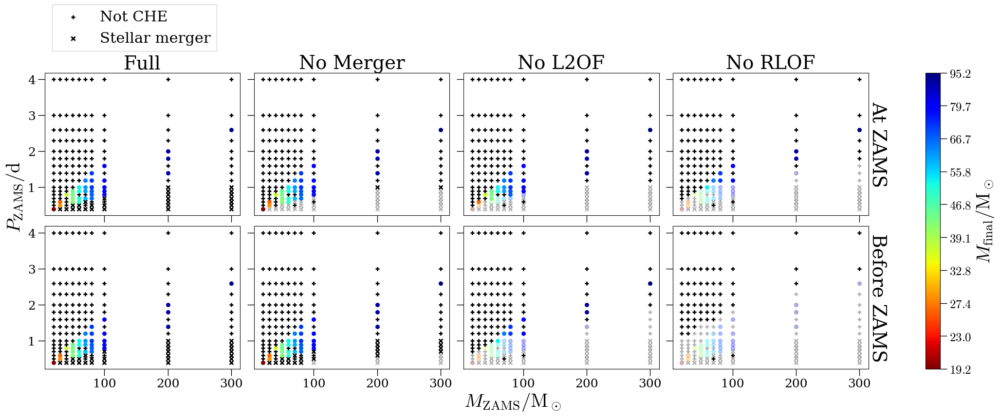

In [825]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True, layout='constrained')
fig.subplots_adjust(wspace=0, hspace=0)

plot_ps = np.linspace(0, 4, 100)

min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)  

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
             
of_kind = 'RL'
ax = axes[1, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
           
fig.text(0, 0.5, '$P_\\mathrm{ZAMS}/\\mathrm{d}$', rotation=90, ha='right', va='center')
fig.text(0.5, 0, '$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

sm = ScalarMappable(Normalize(vmin=np.log10(min_mcore), vmax=np.log10(max_mcore)), cm.jet_r)
cbar = fig.colorbar(sm, ax=axes[:,3], pad=0.2)
cbar.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')
cbar.set_ticks(np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10))
cbar.set_ticklabels([f'${10**logm:.1f}$' for logm in np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10)])

handles = []
handles.append(ax.scatter([], [], marker='+', color='k', label='Not CHE'))
handles.append(ax.scatter([], [], marker='x', color='k', label='Stellar merger'))
axes[0,0].legend(handles=handles, fancybox=False, loc='lower left', bbox_to_anchor=(0, 1.1))

savefig(fig, f'che_window_{zkey}zsun')

In [826]:
min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
mcore_norm = TwoSlopeNorm(vmin=min(30, min_mcore), vmax=max(max_mcore, 40), vcenter=35.)
nonche_c = to_rgba('darkslategrey')
crit_c = to_rgba('slategrey')
cmap = cm.seismic
def mcore_cmap(x): return cmap(mcore_norm(x))

In [827]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
zams_l2of_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = mcore_cmap(mcore)
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
        else:
            mcore_arr[i_m, i_p, :] = nonche_c

        rzams = final_mass_array[i_p, i_m, 6]
        is_l2of = is_of(r=rzams, m=m1, p=p1, q=1, kind='L2')
        if is_l2of:
            zams_l2of_arr[i_m, i_p, :] = [0, 0, 0, 0]
        else:
            zams_l2of_arr[i_m, i_p, :] = 4*[nan]
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

color_mcore_arr = mcore_arr
color_m_arr = m_arr
color_p_arr = p_arr

In [828]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_crit_mcore_arr = mcore_arr
hatch_crit_m_arr = m_arr
hatch_crit_p_arr = p_arr

In [829]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = nonche_c
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_nonche_mcore_arr = mcore_arr
hatch_nonche_m_arr = m_arr
hatch_nonche_p_arr = p_arr

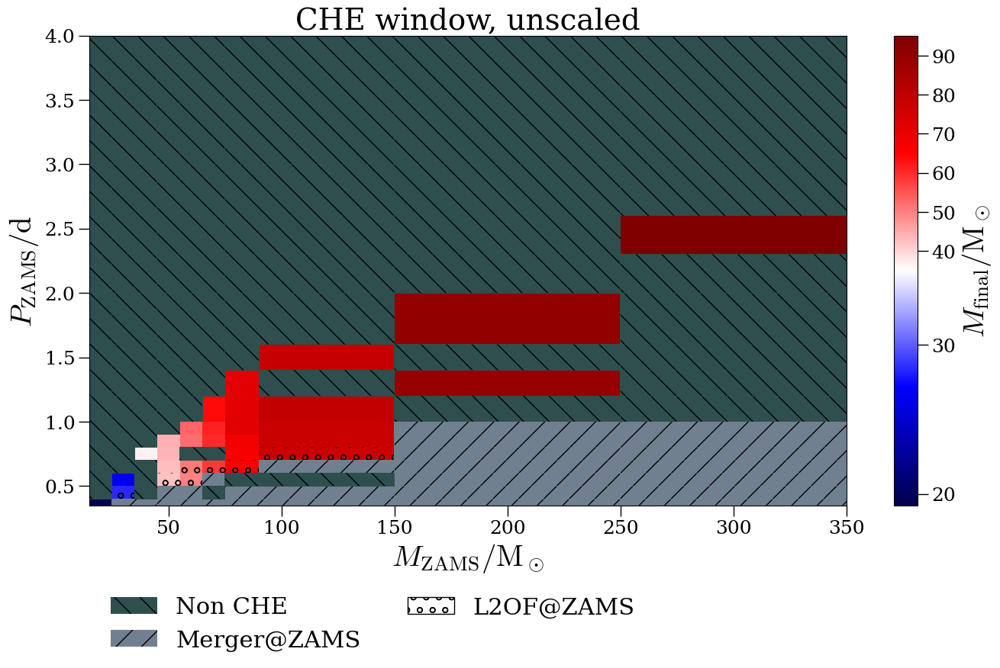

In [830]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_title('CHE window, unscaled')

savefig(fig,f'che_window_unscaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


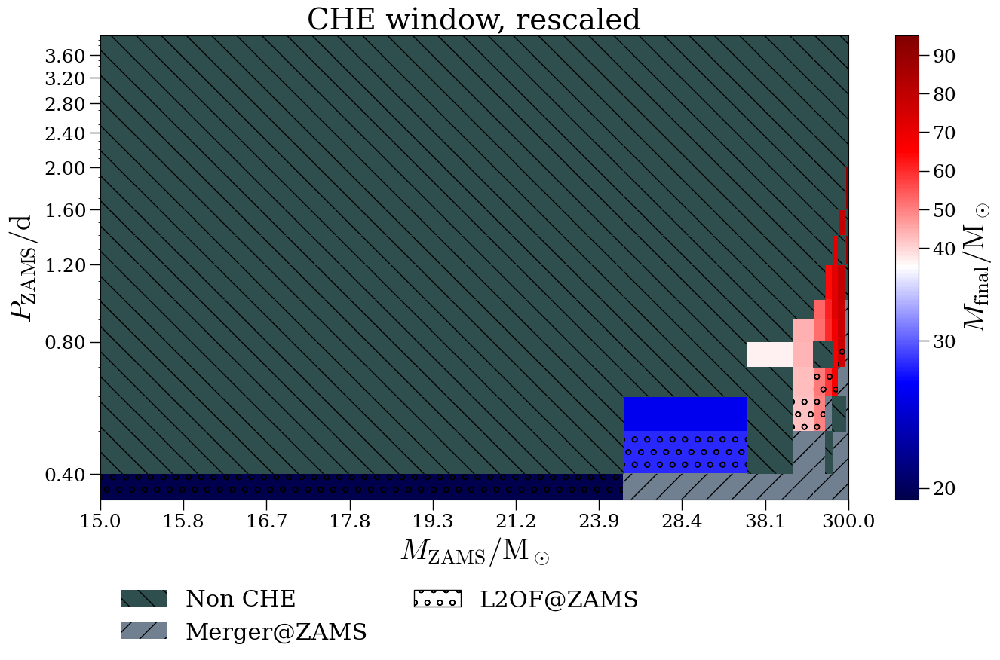

In [831]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(15), mass_forward(300), 10)])

ax.set_xlim(15, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled')

savefig(fig, f'che_window_rescaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


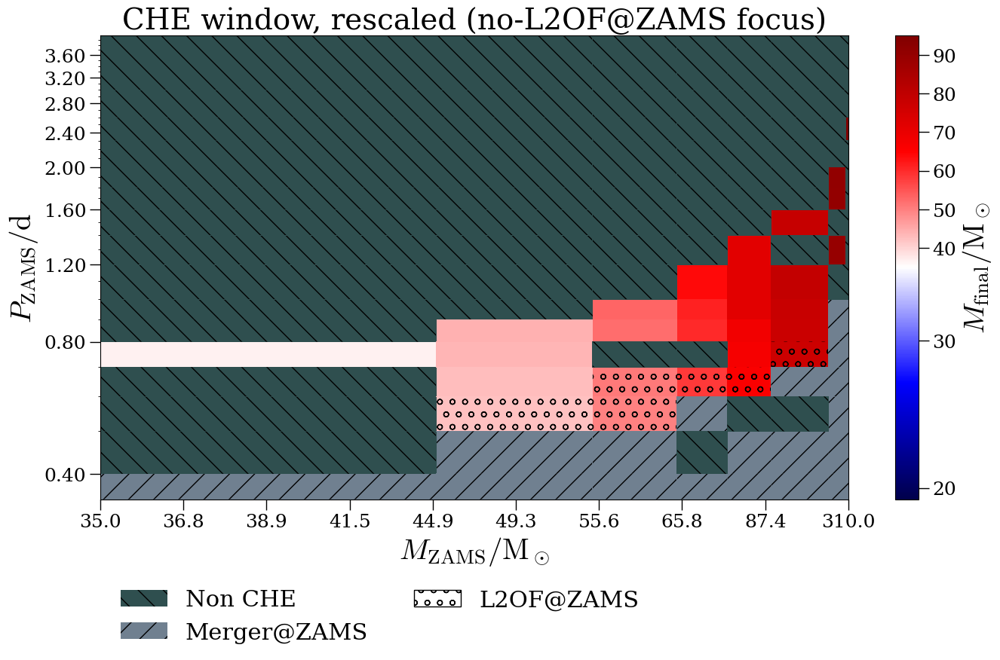

In [832]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(35), mass_forward(310), 10)])

ax.set_xlim(35, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled (no-L2OF@ZAMS focus)')

savefig(fig, f'che_window_rescaled_no_l2of_{zkey}zsun')

In [833]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 0] 
    r_arr = final_mass_array[:, i, 6] 

    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
        
    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
            
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_mcore_interpolator_dict = interpolator_dict

In [834]:
def l2_mzams_mcore_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_mcore_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value='extrapolate'
    )
    
    m_core = interpolator(m_zams)
    
    return m_core  

In [835]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 6] 
    r_arr = final_mass_array[:, i, 6] 
    
    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]

    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
    
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_rzams_interpolator_dict = interpolator_dict

In [836]:
def l2_mzams_rzams_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_rzams_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value=nan
    )
    
    m_core = interpolator(m_zams)
    
    return m_core      

In [837]:
def draw_mass_sample(
    res=int(1e7),
    min_m=20,
    max_m=300,
    min_p=0.1,
    max_p=4,
    min_mfinal=20,
    max_mfinal=50,
    mfinal_bin_width=0.2
):
    sample_masses = np.linspace(min_m, max_m, res)
    sample_probs = sample_masses**-2.3/np.sum(sample_masses**-2.3)
    sample_masses = np.random.choice(sample_masses, p=sample_probs, size=int(res/100))

    sample_periods = np.linspace(np.log10(min_p), np.log10(max_p), res)
    sample_probs = np.ones(res)/res
    sample_periods = 10.**np.random.choice(sample_periods, p=sample_probs, size=int(res/100))

    sample_zams_rs = np.array([l2_mzams_rzams_interpolator(m, p) for m, p in zip(sample_masses, sample_periods)])

    sample_mcores = np.zeros(int(res/100))

    sample_ = np.array([sample_masses, sample_periods, sample_zams_rs, sample_mcores]).T
    zams_l2of_sample = set_mcores(sample_).copy()
    
    mass_draw = zams_l2of_sample[:, 3]
    mass_draw = mass_draw[~np.isnan(mass_draw)]

    bins = np.arange(min_mfinal, max_mfinal+mfinal_bin_width, mfinal_bin_width)
    hist, bins = np.histogram(mass_draw, density=True, bins=bins)
    centers = np.array([(bin0+bin1)/2 for bin0, bin1 in zip(bins[:-1], bins[1:])])
    mode = centers[np.argmax(hist)]
    
    return zams_l2of_sample, mode

In [838]:
result0005 = draw_mass_sample(res=res)

/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


In [839]:
result = result0005

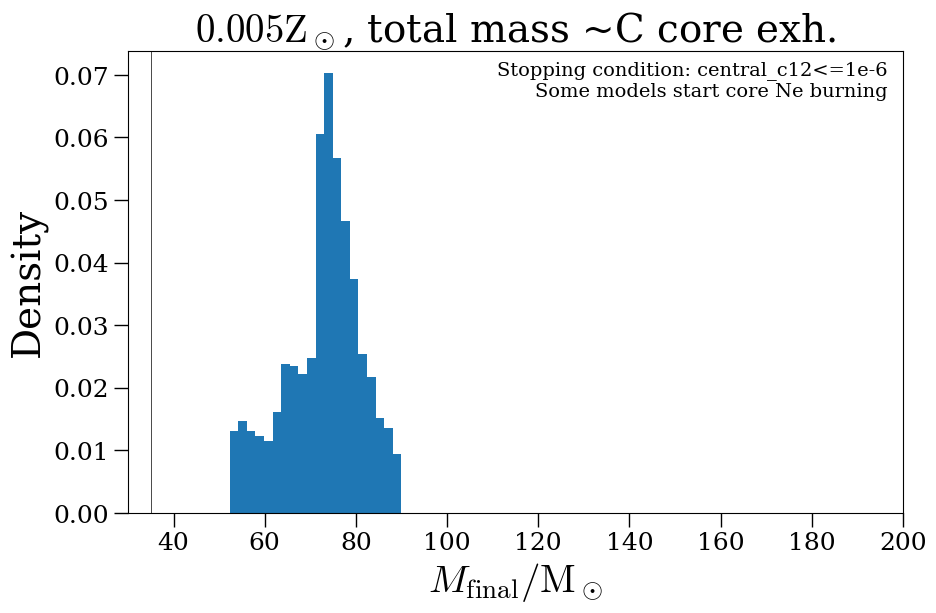

In [840]:
fig, ax = plt.subplots(figsize=(10,6))

h, bins, patches = ax.hist(result[0][:,3], density=True, bins=20)

ax.vlines(35, 0, max(h)*1.05, color='k', lw=0.5)
ax.set_ylim(0, max(h)*1.05)
ax.set_xlim(30, 200)
#ax.set_xticks(np.arange(30, 50, 2.5))

ax.set_ylabel('Density')
ax.set_xlabel('$M_\\mathrm{final}/\mathrm{M}_\odot$')
ax.set_title(f'${zkey}\\mathrm{{Z}}_\\odot$, total mass ~C core exh.')

note = '\n'.join(('Stopping condition: central_c12<=1e-6',
                  'Some models start core Ne burning'))
ax.text(0.98, 
        0.98, 
        note,
        transform=ax.transAxes,
        ha='right',
        va='top',
        fontsize=14
        )

savefig(fig, f'mfinal_distr_{zkey}zsun')


## $0.0005\mathrm{Z}_\odot$

In [841]:
zkey = '0.0005'

model_dicts = all_model_dicts[zkey]
final_mass_array = final_core_prop_array_dict[zkey]

# Select models
models_to_plot = np.arange(0, len(model_dicts), 1)
model_dict_list = model_dicts[models_to_plot]
print(f'Loading {model_dict_list}')

# Collect periods
all_periods = []
for dict_ in model_dict_list:
    for k1 in dict_.keys():
        for k2 in dict_[k1].keys():
            all_periods.append(k2)
all_periods = np.unique(all_periods)
all_periods = all_periods[np.argsort([float(p) for p in all_periods])]
print(all_periods)

mass_guide_str = [list(dict_.keys())[0] for dict_ in model_dict_list]
mass_guide_float = np.array([float(m) for m in mass_guide_str])

period_guide_str = all_periods
period_guide_float = np.array([float(p) for p in period_guide_str])

Loading [{'20.0': {'2.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.600d+00_w2.797d-05'), '4.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d+00_w1.818d-05'), '0.40': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p4.000d-01_w1.818d-04'), '2.00': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p2.000d+00_w3.636d-05'), '0.70': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/001_md1_m20_zsundiv10_04y0_03dy/m2.000d+01_p7.000d-01_w1.039d-04'), '1.60': PosixPath('/mnt/ceph/users/ldesa/mesa_che_grids/sse_enhanced_w_proof_of_concept/09_ZdivZsun_5d-4/001_md1_m20

/tmp/ipykernel_1635975/3182167842.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=0, hspace=0)
/tmp/ipykernel_1635975/3646536049.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles.append(ax.scatter([], [], c=c, marker='o', label=m_key))


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


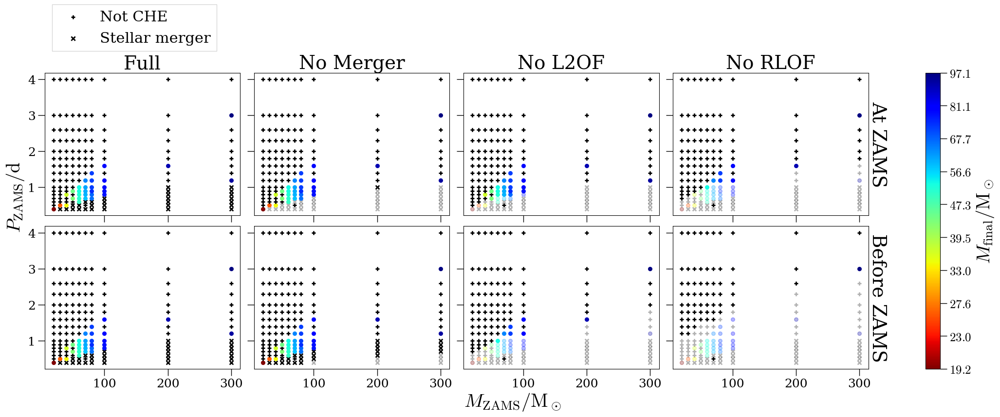

In [842]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True, layout='constrained')
fig.subplots_adjust(wspace=0, hspace=0)

plot_ps = np.linspace(0, 4, 100)

min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])

# AT ZAMS
of_when = 'zams'

of_kind = 'none'
ax = axes[0, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('Full')                

of_kind = 'merger'
ax = axes[0, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No Merger')                

of_kind = 'L2'
ax = axes[0, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No L2OF')                

of_kind = 'RL'
ax = axes[0, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
ax.set_title('No RLOF')                

# AT ZAMS
of_when = 'prezams'

of_kind = 'none'
ax = axes[1, 0]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)

of_kind = 'merger'
ax = axes[1, 1]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)  

of_kind = 'L2'
ax = axes[1, 2]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
             
of_kind = 'RL'
ax = axes[1, 3]
ax, handles = mzams_p0_mcore_of_plot(ax, of_when=of_when, of_kind=of_kind, min_mcore=min_mcore, max_mcore=max_mcore)
           
fig.text(0, 0.5, '$P_\\mathrm{ZAMS}/\\mathrm{d}$', rotation=90, ha='right', va='center')
fig.text(0.5, 0, '$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$', ha='center', va='top')
axes[0, 3].text(1, 0.5, 'At ZAMS', rotation=-90, ha='left', va='center', transform=axes[0, 3].transAxes)
axes[1, 3].text(1, 0.5, 'Before ZAMS', rotation=-90, ha='left', va='center', transform=axes[1, 3].transAxes)

sm = ScalarMappable(Normalize(vmin=np.log10(min_mcore), vmax=np.log10(max_mcore)), cm.jet_r)
cbar = fig.colorbar(sm, ax=axes[:,3], pad=0.2)
cbar.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')
cbar.set_ticks(np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10))
cbar.set_ticklabels([f'${10**logm:.1f}$' for logm in np.linspace(np.log10(min_mcore), np.log10(max_mcore), 10)])

handles = []
handles.append(ax.scatter([], [], marker='+', color='k', label='Not CHE'))
handles.append(ax.scatter([], [], marker='x', color='k', label='Stellar merger'))
axes[0,0].legend(handles=handles, fancybox=False, loc='lower left', bbox_to_anchor=(0, 1.1))

savefig(fig, f'che_window_{zkey}zsun')

In [843]:
min_mcore = np.nanmin(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
max_mcore = np.nanmax(final_mass_array[:, :, 0][np.array(final_mass_array[:, :, 9], bool)])
mcore_norm = TwoSlopeNorm(vmin=min(30, min_mcore), vmax=max(max_mcore, 40), vcenter=35.)
nonche_c = to_rgba('darkslategrey')
crit_c = to_rgba('slategrey')
cmap = cm.seismic
def mcore_cmap(x): return cmap(mcore_norm(x))

In [844]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
zams_l2of_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = mcore_cmap(mcore)
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
        else:
            mcore_arr[i_m, i_p, :] = nonche_c

        rzams = final_mass_array[i_p, i_m, 6]
        is_l2of = is_of(r=rzams, m=m1, p=p1, q=1, kind='L2')
        if is_l2of:
            zams_l2of_arr[i_m, i_p, :] = [0, 0, 0, 0]
        else:
            zams_l2of_arr[i_m, i_p, :] = 4*[nan]
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

color_mcore_arr = mcore_arr
color_m_arr = m_arr
color_p_arr = p_arr

In [845]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = crit_c
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_crit_mcore_arr = mcore_arr
hatch_crit_m_arr = m_arr
hatch_crit_p_arr = p_arr

In [846]:
m_arr = np.zeros(len(mass_guide_float)+1)
p_arr = np.zeros(len(period_guide_float)+1)
mcore_arr = np.zeros((len(mass_guide_float), len(period_guide_float), 4))
che_mask = np.ones((len(mass_guide_float)+1, len(period_guide_float)+1), bool)

for i_m, m1 in enumerate(mass_guide_float):
    if i_m == 0:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        bin_lower_m = m1 - (bin_upper_m-m1)
    elif i_m < len(mass_guide_float)-1:
        m2 = mass_guide_float[i_m+1]
        bin_upper_m = (m1+m2)/2
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
    else:
        m0 = mass_guide_float[i_m-1]
        bin_lower_m = (m0+m1)/2
        bin_upper_m = m1 + (m1-bin_lower_m)
    m_arr[i_m] = bin_lower_m
    m_arr[i_m+1] = bin_upper_m
    
    for i_p, p1 in enumerate(period_guide_float):
        if i_p == 0:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = p1 - (bin_upper_p-p1)
        elif i_p < len(period_guide_float)-1:
            p2 = period_guide_float[i_p+1]
            bin_upper_p = (p1+p2)/2
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (p0+p1)/2
        else:
            p0 = period_guide_float[i_p-1]
            bin_lower_p = (m0+m1)/2
            m2 = m1 + (m1-bin_lower_p)
        p_arr[i_p] = p0
        p_arr[i_p+1] = p2
        
        mcore = final_mass_array[i_p, i_m, 0]
        ische = final_mass_array[i_p, i_m, 9]
        iscrit = final_mass_array[i_p, i_m, 8]
        if ische:
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = True
        elif iscrit: 
            mcore_arr[i_m, i_p, :] = 4*[nan]
            che_mask[i_m, i_p] = False
        else:
            mcore_arr[i_m, i_p, :] = nonche_c
            che_mask[i_m, i_p] = False
            
m_arr = np.tile(m_arr, [len(period_guide_float)+1, 1]).T
p_arr = np.tile(p_arr, [len(mass_guide_float)+1, 1])

hatch_nonche_mcore_arr = mcore_arr
hatch_nonche_m_arr = m_arr
hatch_nonche_p_arr = p_arr

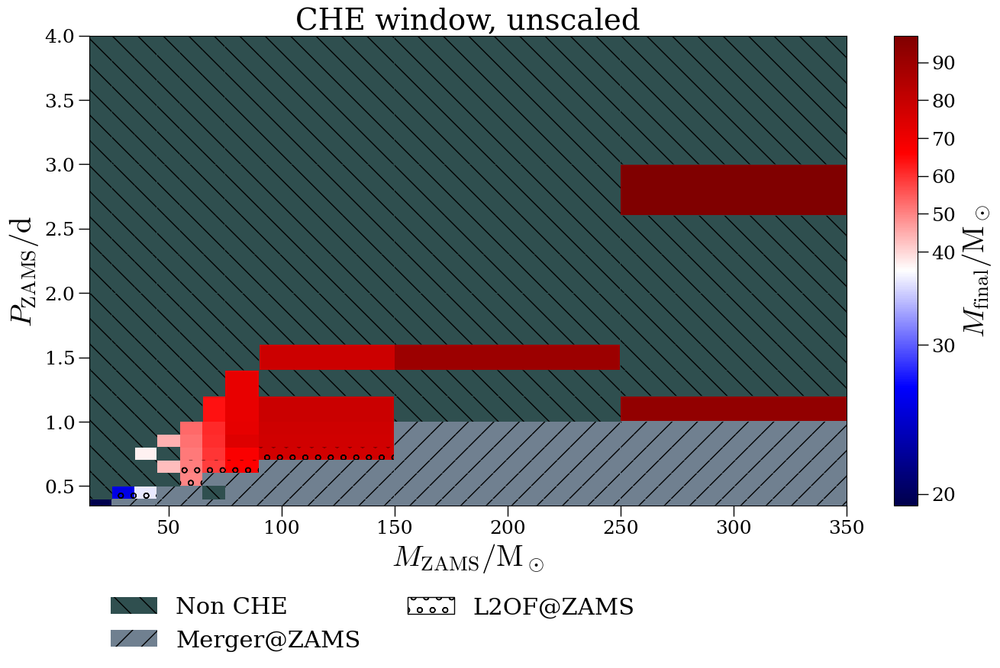

In [847]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_title('CHE window, unscaled')

savefig(fig,f'che_window_unscaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


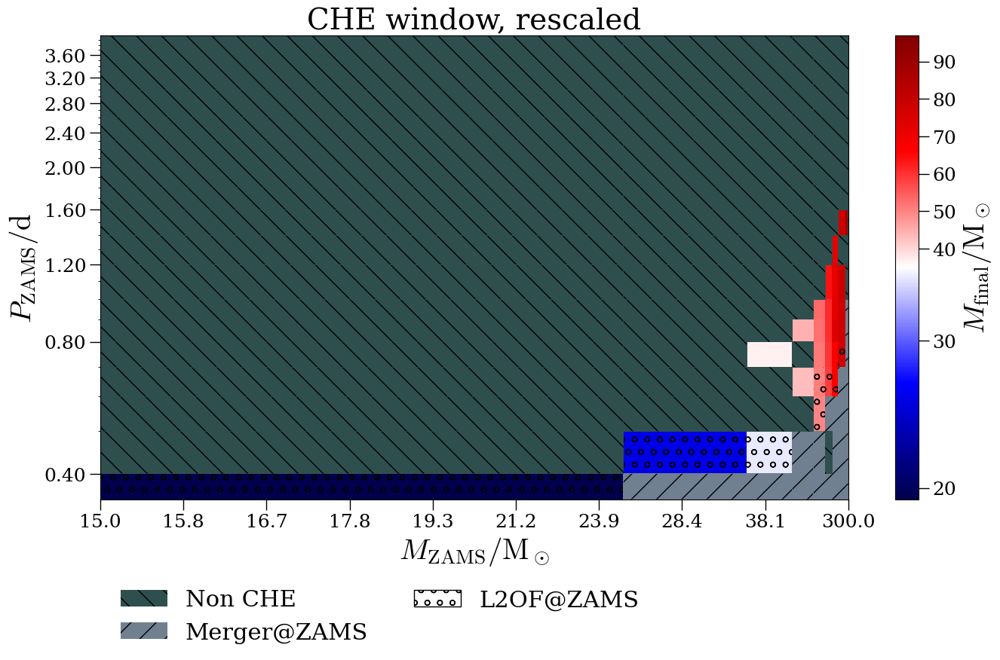

In [848]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(15), mass_forward(300), 10)])

ax.set_xlim(15, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled')

savefig(fig, f'che_window_rescaled_{zkey}zsun')

/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35
/tmp/ipykernel_1635975/1587637377.py:2: RuntimeWarning: divide by zero encountered in power
  return m**-2.35


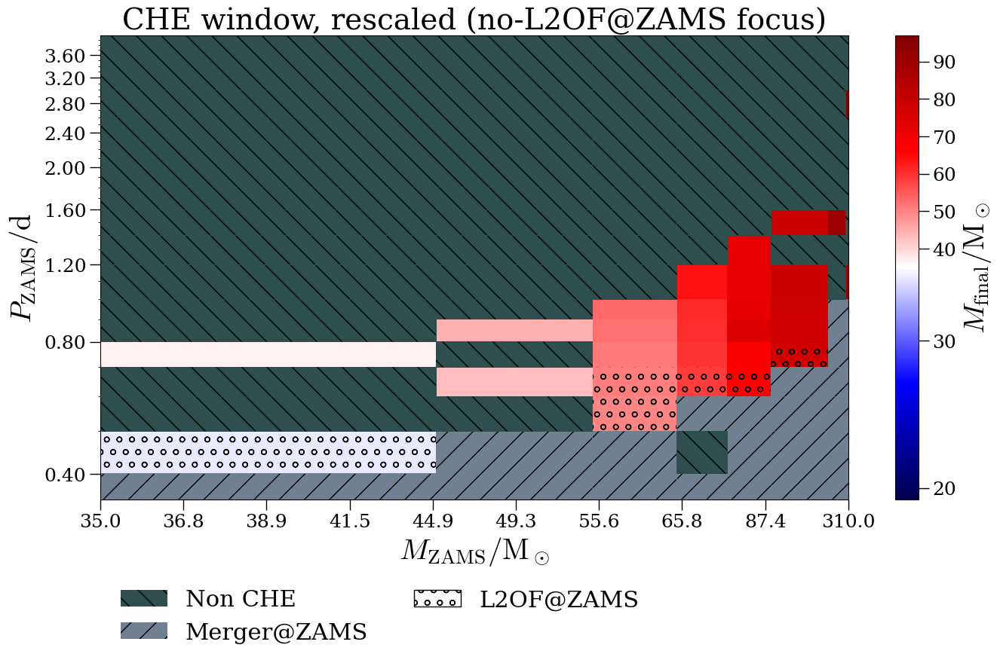

In [849]:
fig, ax = plt.subplots(figsize=(16, 8))

ax.pcolormesh(color_m_arr, color_p_arr, color_mcore_arr, shading='flat')
ax.pcolor(color_m_arr, color_p_arr, zams_l2of_arr, hatch=l2of_hatch)
ax.pcolor(hatch_crit_m_arr, hatch_crit_p_arr, hatch_crit_mcore_arr, alpha=0., hatch=crit_hatch)
ax.pcolor(hatch_nonche_m_arr, hatch_nonche_p_arr, hatch_nonche_mcore_arr, alpha=0., hatch=nonche_hatch)

ax.set_xlabel('$M_\\mathrm{ZAMS}/\\mathrm{M}_\\odot$')
ax.set_ylabel('$P_\\mathrm{ZAMS}/\\mathrm{d}$')

sm = ScalarMappable(norm=mcore_norm, cmap=cmap)
cb = fig.colorbar(sm, ax=ax)
cb.set_label('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')

handles = []
handles.append(Patch(facecolor=nonche_c, hatch=nonche_hatch, label='Non CHE'))
handles.append(Patch(facecolor=crit_c, hatch=crit_hatch, label='Merger@ZAMS'))
handles.append(Patch(facecolor='w', hatch=l2of_hatch, label='L2OF@ZAMS', edgecolor='k'))
ax.legend(handles=handles, frameon=False, loc='upper left', bbox_to_anchor=(0, -0.15), ncol=2)

ax.set_yscale('log')
ax.set_xscale('function', functions=(mass_forward, mass_inverse))
ax.set_xticks([mass_inverse(x) for x in np.linspace(mass_forward(35), mass_forward(310), 10)])

ax.set_xlim(35, 310)
ax.invert_xaxis()

ax.set_yticks(np.arange(0.4, 4, 0.4))
ax.set_yticklabels([f'{p:.2f}' for p in np.arange(0.4, 4, 0.4)])
ax.set_yticks(np.arange(0.4, 4, 0.1), minor=True)
ax.set_yticklabels([], minor=True)

ax.set_title('CHE window, rescaled (no-L2OF@ZAMS focus)')

savefig(fig, f'che_window_rescaled_no_l2of_{zkey}zsun')

In [850]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 0] 
    r_arr = final_mass_array[:, i, 6] 

    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
        
    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
            
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_mcore_interpolator_dict = interpolator_dict

In [851]:
def l2_mzams_mcore_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_mcore_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value='extrapolate'
    )
    
    m_core = interpolator(m_zams)
    
    return m_core  

In [852]:
interpolator_dict = dict()

for i, m in enumerate(mass_guide_float):
    m_key = mass_guide_str[i]
    p_arr = period_guide_float   
    y_arr = final_mass_array[:, i, 6] 
    r_arr = final_mass_array[:, i, 6] 
    
    mask = np.array(final_mass_array[:, i, 9], bool)
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]

    mask = []
    for p0, rzams in zip(p_arr, r_arr):
        isof = is_of(rzams, float(m_key), p0, 1, kind='L2')
        if isof:
            mask.append(False)
        else:
            mask.append(True)
    
    y_arr = y_arr[mask]
    p_arr = p_arr[mask]
    r_arr = r_arr[mask]
    
    if len(y_arr) == 0:
        y_arr = [nan]
        p_arr = [1]
        r_arr = [1]
    
    interpolator = interp1d(
        x=p_arr,
        y=y_arr,
        kind='linear',
        bounds_error=False,
        fill_value=nan
        )

    interpolator_dict[m_key] = interpolator     
    
l2_pzams_rzams_interpolator_dict = interpolator_dict

In [853]:
def l2_mzams_rzams_interpolator(m_zams, p_zams):
    ip_m_cores = []
    for m_key in mass_guide_str:
        interpolator = l2_pzams_rzams_interpolator_dict[m_key]
        ip_m_cores.append(interpolator(p_zams))
    
    interpolator = interp1d(
        x=mass_guide_float,
        y=ip_m_cores,
        kind='linear',
        bounds_error=False,
        fill_value=nan
    )
    
    m_core = interpolator(m_zams)
    
    return m_core      

In [854]:
def draw_mass_sample(
    res=int(1e7),
    min_m=20,
    max_m=300,
    min_p=0.1,
    max_p=4,
    min_mfinal=20,
    max_mfinal=50,
    mfinal_bin_width=0.2
):
    sample_masses = np.linspace(min_m, max_m, res)
    sample_probs = sample_masses**-2.3/np.sum(sample_masses**-2.3)
    sample_masses = np.random.choice(sample_masses, p=sample_probs, size=int(res/100))

    sample_periods = np.linspace(np.log10(min_p), np.log10(max_p), res)
    sample_probs = np.ones(res)/res
    sample_periods = 10.**np.random.choice(sample_periods, p=sample_probs, size=int(res/100))

    sample_zams_rs = np.array([l2_mzams_rzams_interpolator(m, p) for m, p in zip(sample_masses, sample_periods)])

    sample_mcores = np.zeros(int(res/100))

    sample_ = np.array([sample_masses, sample_periods, sample_zams_rs, sample_mcores]).T
    zams_l2of_sample = set_mcores(sample_).copy()
    
    mass_draw = zams_l2of_sample[:, 3]
    mass_draw = mass_draw[~np.isnan(mass_draw)]

    bins = np.arange(min_mfinal, max_mfinal+mfinal_bin_width, mfinal_bin_width)
    hist, bins = np.histogram(mass_draw, density=True, bins=bins)
    centers = np.array([(bin0+bin1)/2 for bin0, bin1 in zip(bins[:-1], bins[1:])])
    mode = centers[np.argmax(hist)]
    
    return zams_l2of_sample, mode

In [855]:
result00005 = draw_mass_sample(res=res)

In [856]:
result = result00005

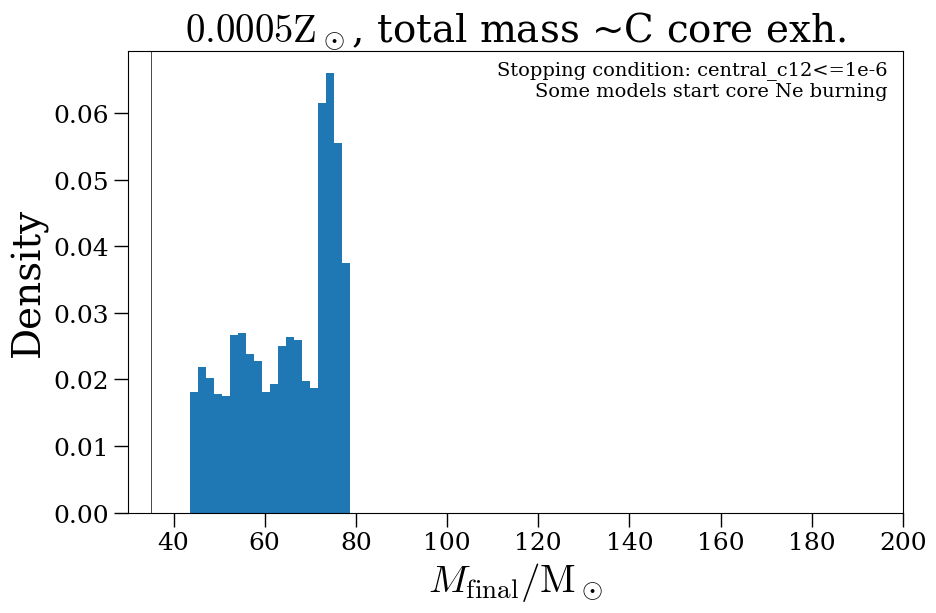

In [857]:
fig, ax = plt.subplots(figsize=(10,6))

h, bins, patches = ax.hist(result[0][:,3], density=True, bins=20)

ax.vlines(35, 0, max(h)*1.05, color='k', lw=0.5)
ax.set_ylim(0, max(h)*1.05)
ax.set_xlim(30, 200)
#ax.set_xticks(np.arange(30, 50, 2.5))

ax.set_ylabel('Density')
ax.set_xlabel('$M_\\mathrm{final}/\mathrm{M}_\odot$')
ax.set_title(f'${zkey}\\mathrm{{Z}}_\\odot$, total mass ~C core exh.')

note = '\n'.join(('Stopping condition: central_c12<=1e-6',
                  'Some models start core Ne burning'))
ax.text(0.98, 
        0.98, 
        note,
        transform=ax.transAxes,
        ha='right',
        va='top',
        fontsize=14
        )

savefig(fig, f'mfinal_distr_{zkey}zsun')


## Comparison

In [858]:
from matplotlib import cm

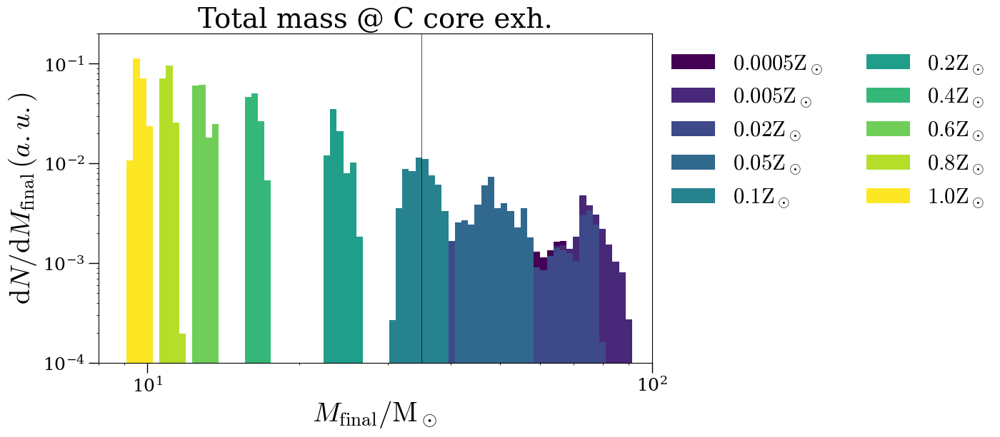

In [862]:
fig, ax = plt.subplots(figsize=(10,6))

bins = np.logspace(np.log10(5), np.log10(100), 101)
#bins = np.linspace(8, 50, 51)

hist0, _ = np.histogram(result00005[0][:,3], density=True, bins=bins)
hist1, _ = np.histogram(result0005[0][:,3], density=True, bins=bins)
hist2, _ = np.histogram(result002[0][:,3], density=True, bins=bins)
hist3, _ = np.histogram(result005[0][:,3], density=True, bins=bins)
hist4, _ = np.histogram(result01[0][:,3], density=True, bins=bins)
hist5, _ = np.histogram(result02[0][:,3], density=True, bins=bins)
hist6, _ = np.histogram(result04[0][:,3], density=True, bins=bins)
hist7, _ = np.histogram(result06[0][:,3], density=True, bins=bins)
hist8, _ = np.histogram(result08[0][:,3], density=True, bins=bins)
hist9, _ = np.histogram(result10[0][:,3], density=True, bins=bins)

norm = np.sum(np.concatenate((hist0, hist1, hist2, hist3, hist4, hist5, hist6, hist7, hist8, hist9)))
hist0 = hist0/norm
hist1 = hist1/norm
hist2 = hist2/norm
hist3 = hist3/norm
hist4 = hist4/norm
hist5 = hist5/norm
hist6 = hist6/norm
hist7 = hist7/norm
hist8 = hist8/norm
hist9 = hist9/norm

ax.stairs(hist0, bins, color=cm.viridis(0/9), label='$0.0005\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist1, bins, color=cm.viridis(1/9), label='$0.005\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist2, bins, color=cm.viridis(2/9), label='$0.02\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist3, bins, color=cm.viridis(3/9), label='$0.05\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist4, bins, color=cm.viridis(4/9), label='$0.1\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist5, bins, color=cm.viridis(5/9), label='$0.2\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist6, bins, color=cm.viridis(6/9), label='$0.4\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist7, bins, color=cm.viridis(7/9), label='$0.6\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist8, bins, color=cm.viridis(8/9), label='$0.8\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist9, bins, color=cm.viridis(9/9), label='$1.0\\mathrm{Z}_\\odot$', fill=True)

ax.set_ylabel('$\\mathrm{d}N/\\mathrm{d}M_\\mathrm{final}\\,(a.u.)$')
ax.set_xlabel('$M_\\mathrm{final}/\\mathrm{M}_\\odot$')
ax.set_title('Total mass @ C core exh.')
ax.set_xlim(8, 100)
ax.set_xscale('log')

ax.vlines(35, 1e-5, 0.2, color='k', lw=0.5)
ax.set_ylim(1e-4, 0.2)

ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1), ncol=2)
ax.set_yscale('log')

savefig(fig, 'all_zsun_mfinal_hist')


In [ ]:
for x in yd

SyntaxError: expected ':' (2383102413.py, line 1)

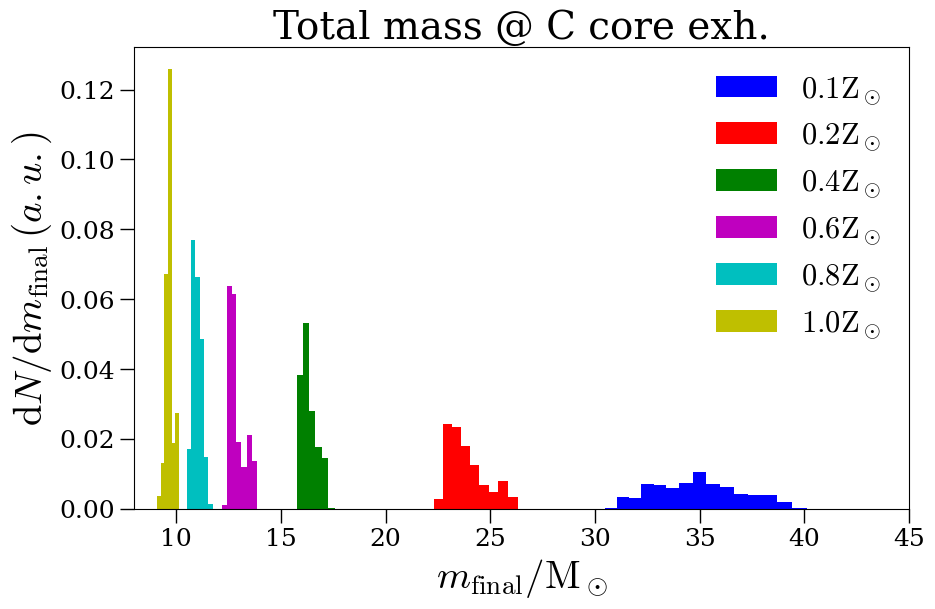

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

bins = np.logspace(np.log10(8), np.log10(50), 101)
#bins = np.linspace(8, 50, 51)

hist0, _ = np.histogram(result00[0][:,3], density=True, bins=bins)
hist1, _ = np.histogram(result01[0][:,3], density=True, bins=bins)
hist2, _ = np.histogram(result02[0][:,3], density=True, bins=bins)
hist3, _ = np.histogram(result03[0][:,3], density=True, bins=bins)
hist4, _ = np.histogram(result04[0][:,3], density=True, bins=bins)
hist5, _ = np.histogram(result05[0][:,3], density=True, bins=bins)

norm = np.sum(np.concatenate((hist0, hist1, hist2, hist3, hist4, hist5)))
hist0 = hist0/norm
hist1 = hist1/norm
hist2 = hist2/norm
hist3 = hist3/norm
hist4 = hist4/norm
hist5 = hist5/norm

ax.stairs(hist0, bins, color='b', label='$0.1\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist1, bins, color='r', label='$0.2\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist2, bins, color='g', label='$0.4\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist3, bins, color='m', label='$0.6\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist4, bins, color='c', label='$0.8\\mathrm{Z}_\\odot$', fill=True)
ax.stairs(hist5, bins, color='y', label='$1.0\\mathrm{Z}_\\odot$', fill=True)

ax.set_ylabel('$\\mathrm{d}N/\\mathrm{d}m_\\mathrm{final}\\,(a.u.)$')
ax.set_xlabel('$m_\\mathrm{final}/\\mathrm{M}_\\odot$')
ax.set_title('Total mass @ C core exh.')
ax.set_xlim(8, 45)

ax.legend(frameon=False)

savefig(fig, '01_02_04_06_08_10_zsun_mfinal_hist')
